# NETTOYAGE ET ANALYSE EXPLORATOIRE

In [1]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


En 2050, la ville de Seattle s'est fixé pour objectif d'atteindre un niveau de neutralité Carbone. Afin de ne pas supporter de nouveaux surcoûts, à l'image des relevés des campagnes effectuées en 2015 et 2016, la ville a besoin de prédictions pour ses bâtiments non destinés à l'habitation.

Les trois objectifs principaux sont :

- Déterminer des variables pertinentes ou en créer de nouvelles (sur le modèle du feature engineering).

- Prédire au moyen d'une modélisation :
  - Consommation totale d'Energie des Bâtiments ou "SiteEnergyUseWN(kBtu)".
  - Emissions GES (Gaz à Effets de Serre) ou "TotalGHGEmissions".
  

- Evaluer, pour ces prédictions, la pertinence d'un indicateur d'efficacité énergétique appelé ENERGYSTARScore.

# Importation des Bibliothèques et Mise en Forme :

In [2]:
# Installation des Bibliothèques :

import matplotlib.pyplot as plt
import matplotlib.colors 
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
import os
import missingno as msno

In [3]:
# Modification des affichages de colonnes, lignes et largeurs de colonnes pour avoir un maximum d'information :

pd.set_option('display.max_columns', 400)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_colwidth', -100)

/var/folders/_5/v63wfks92ynb3p2nthszhh2m0000gn/T/ipykernel_38184/3940679478.py:5: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -100)


# I Traitement des Fichiers Initiaux et Dataframes de Départ :

# Informations 2015 :

# CSV

In [4]:
# Chargement du fichier csv "Building 2015" :

building2015 = pd.read_csv('2015-building-energy-benchmarking.csv')

In [5]:
# Visualisation de la Dataframe "Building 2015" :

building2015

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122.33799744', 'human_address': '{""address"": ""405 OLIVE WAY"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122.33335756', 'human_address': '{""address"": ""724 PINE ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,"{'latitude': '47.61334897', 'longitude': '-122.33769944', 'human_address': '{""address"": ""1900 5TH AVE"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1969,1,41.0,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,0.0,2061.48,1.92,Yes,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,"{'latitude': '47.61421585', 'longitude': '-122.33660889', 'human_address': '{""address"": ""620 STEWART ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1926,1,10.0,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,1.0,460.4,462.5,636.3,643.2,28229320.0,28363444.0,23458518.0,811521.0,2769023.0,20019.0,2001894.0,0.0,1936.34,31.38,No,NaN,Compliant,High Outlier,NaN,56.0,NaN,31.0,18081
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,"{'latitude': '47.6137544', 'longitude': '-122.3409238', 'human_address': '{""address"": ""401 LENORA ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98121""}'}",7,DOWNTOWN,1980,1,18.0,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,67.0,120.1,122.1,228.8,227.1,14829099.0,15078243.0,0.0,1777841.0,6066245.0,87631.0,8763105.0,0.0,507.70,4.02,No,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,19576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3335,50049,2015,Multifamily LR (1-4),Low-Rise Multifamily,PACIFIC CENTER CONDOMINIUM,6599950000,"{'latitude': '47.59950256', 'longitude': '-122.32034302', 'human_address': '{""address"": ""321 10TH AVE S"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98104""}'}",2,DOWNTOWN,2000,1,4.0,44650,0,44650,Multifamily Housing,Multifamily Housing,44650.0,NaN,NaN,NaN,NaN,NaN,71.0,25.6,27.8,80.4,8

In [6]:
# Listage des colonnes constituant la dataframe initiale :

building2015.columns.to_list()

['OSEBuildingID',
 'DataYear',
 'BuildingType',
 'PrimaryPropertyType',
 'PropertyName',
 'TaxParcelIdentificationNumber',
 'Location',
 'CouncilDistrictCode',
 'Neighborhood',
 'YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'YearsENERGYSTARCertified',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'NaturalGas(therms)',
 'NaturalGas(kBtu)',
 'OtherFuelUse(kBtu)',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'DefaultData',
 'Comment',
 'ComplianceStatus',
 'Outlier',
 '2010 Census Tracts',

In [7]:
# Nombre de Lignes / Nombre de Colonnes de la Dataframe initiale :

building2015.shape

(3340, 47)

In [8]:
# Types de Variables Qualitatives et Quantitatives de la Dataframe intiale :

building2015.dtypes

OSEBuildingID                                                    int64  
DataYear                                                         int64  
BuildingType                                                     object 
PrimaryPropertyType                                              object 
PropertyName                                                     object 
TaxParcelIdentificationNumber                                    object 
Location                                                         object 
CouncilDistrictCode                                              int64  
Neighborhood                                                     object 
YearBuilt                                                        int64  
NumberofBuildings                                                int64  
NumberofFloors                                                   float64
PropertyGFATotal                                                 int64  
PropertyGFAParking                                 

In [9]:
# Quantification des Valeurs Dupliquées de la Dataframe initiale :

building2015.duplicated().sum()

0

In [10]:
# Données Statistiques de la Dataframe Initiale :

building2015.describe()

,OSEBuildingID,DataYear,CouncilDistrictCode,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
count,3340.000000,3340.0,3340.000000,3340.000000,3340.000000,3332.000000,3.340000e+03,3340.000000,3.340000e+03,3.204000e+03,1559.000000,560.000000,2560.000000,3330.000000,3330.000000,3330.000000,3330.000000,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3330.000000,3330.000000,224.000000,3338.000000,213.000000,3338.000000,3340.000000
mean,20522.168263,2015.0,4.450898,1967.624850,1.035629,4.682173,9.077289e+04,11054.032335,7.971886e+04,7.488154e+04,27675.646568,10755.708929,67.894141,53.626126,57.586547,132.779730,138.936036,4.983106e+06,5.203055e+06,2.502851e+05,1.017897e+06,3.473209e+06,1.253304e+04,1.253304e+06,7.142301e+03,110.094102,0.985339,123.062500,32.380168,1.347418,24.825644,18786.680240
std,11511.515874,0.0,2.127203,32.949847,0.784463,5.458460,1.493058e+05,35296.330507,1.292314e+05,1.236249e+05,52480.843425,22618.529737,27.154057,53.893311,55.604963,131.943223,131.359121,1.375330e+07,1.400757e+07,3.481900e+06,2.789931e+06,9.519639e+06,4.415142e+04,4.415142e+06,1.962790e+05,409.450179,1.637172,5.812128,19.907567,0.477272,15.006287,588.604192
min,1.000000,2015.0,1.000000,1900.000000,1.000000,0.000000,2.000000e+04,-3.000000,-5.055000e+04,5.872000e+03,0.000000,0.000000,1.000000,0.000000,0.000000,-2.000000,-2.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,116.000000,1.000000,1.000000,1.000000,17916.000000
25%,19921.750000,2015.0,3.000000,1947.000000,1.000000,2.000000,2.848700e+04,0.000000,2.668300e+04,2.500000e+04,4959.000000,2385.250000,51.750000,27.300000,29.700000,73.500000,80.300000,9.139300e+05,9.883248e+05,0.000000e+00,1.864908e+05,6.363322e+05,0.000000e+00,0.000000e+00,0.000000e+00,9.265000,0.080000,117.000000,14.000000,1.000000,10.000000,18379.000000
50%,22977.000000,2015.0,4.000000,1973.000000,1.000000,4.000000,4.385500e+04,0.000000,4.132600e+04,3.900000e+04,10600.000000,5019.500000,76.000000,37.400000,40.900000,95.000000,102.800000,1.776219e+06,1.953996e+06,0.000000e+00,3.400320e+05,1.160236e+06,2.945500e+03,2.945770e+05,0.000000e+00,32.740000,0.460000,123.000000,33.000000,1.000000,26.000000,18390.000000
75%,25748.000000,2015.0,7.000000,1996.000000,1.000000,5.000000,8.842800e+04,4304.250000,7.872600e+04,7.206750e+04,26224.500000,10275.000000,90.000000,59.875000,65.575000,143.900000,151.275000,4.044277e+06,4.368462e+06,0.000000e+00,8.061935e+05,2.750847e+06,1.115325e+04,1.115366e+06,0.000000e+00,88.642500,1.180000,125.500000,50.000000,2.000000,38.000000,19576.000000
max,50059.000000,2015.0,7.000000,2015.000000,39.000000,99.000000,2.200000e+06,512608.000000,2.200000e+06,1.719643e+06,686750.000000,303910.000000,100.000000,800.600000,800.600000,2511.100000,2511.000000,2.958126e+08,2.977410e+08,1.278697e+08,8.344505e+07,2.847263e+08,1.364484e+06,1.364484e+08,8.269669e+06,11824.890000,31.380000,135.000000,61.000000,2.000000,51.000000,19584.000000


<AxesSubplot:>

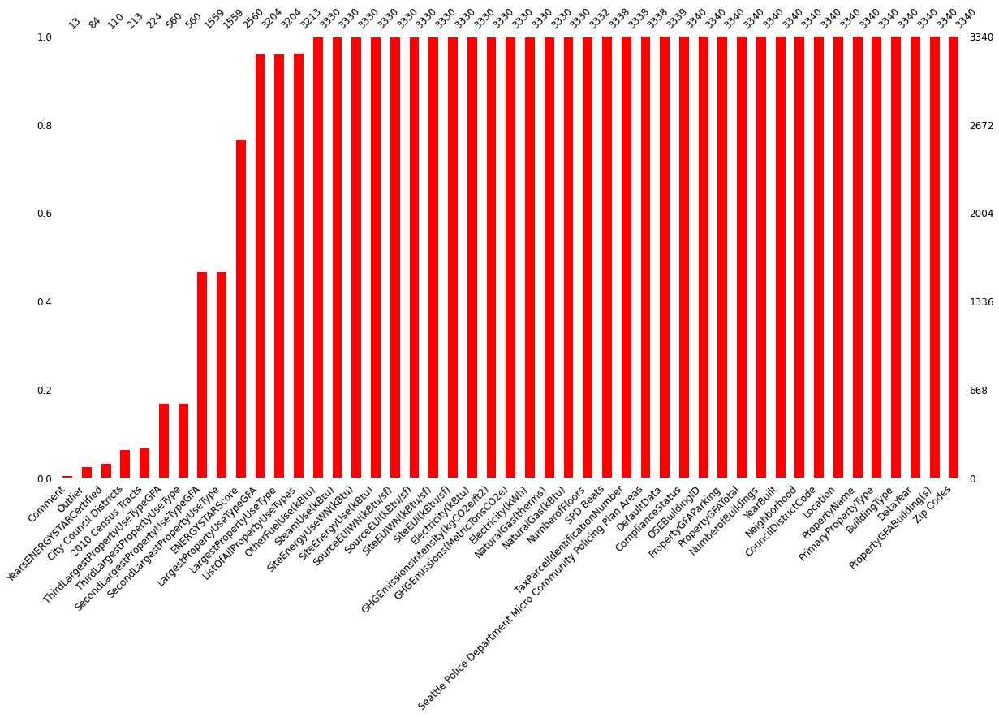

In [11]:
# Matrice de Remplissage des NaN de la Dataframe initiale :

msno.bar(building2015, sort = "ascending", color = "red", figsize = (20,10), fontsize = 12)

<AxesSubplot:>

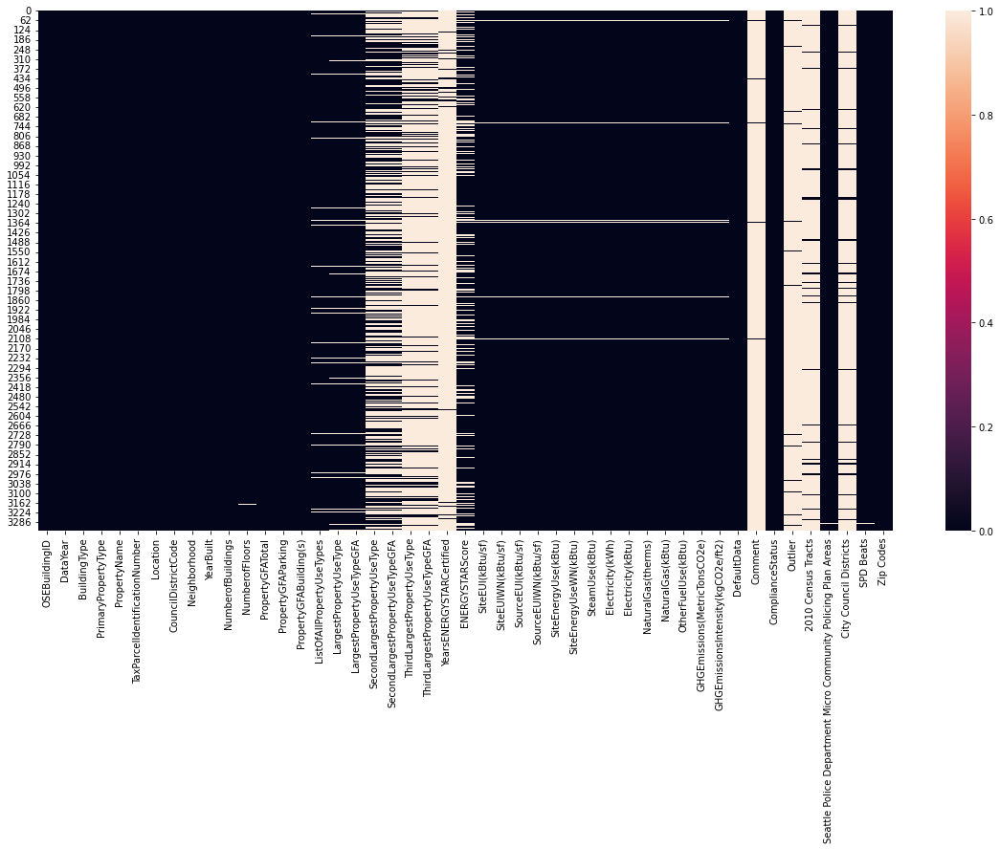

In [12]:
# Heatmap de Valeurs Manquantes de la Dataframe d'Origine :

fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(building2015.isnull())

In [13]:
# Traduction en Pourcentage des Valeurs Manquantes :

missing_count1 = building2015.isnull().sum()
missing_count1

OSEBuildingID                                                    0   
DataYear                                                         0   
BuildingType                                                     0   
PrimaryPropertyType                                              0   
PropertyName                                                     0   
TaxParcelIdentificationNumber                                    2   
Location                                                         0   
CouncilDistrictCode                                              0   
Neighborhood                                                     0   
YearBuilt                                                        0   
NumberofBuildings                                                0   
NumberofFloors                                                   8   
PropertyGFATotal                                                 0   
PropertyGFAParking                                               0   
PropertyGFABuilding(

In [14]:
# Traduction en Pourcentage des Valeurs Manquantes :

value_count1 = building2015.isnull().count()
value_count1

OSEBuildingID                                                    3340
DataYear                                                         3340
BuildingType                                                     3340
PrimaryPropertyType                                              3340
PropertyName                                                     3340
TaxParcelIdentificationNumber                                    3340
Location                                                         3340
CouncilDistrictCode                                              3340
Neighborhood                                                     3340
YearBuilt                                                        3340
NumberofBuildings                                                3340
NumberofFloors                                                   3340
PropertyGFATotal                                                 3340
PropertyGFAParking                                               3340
PropertyGFABuilding(

In [15]:
# Calcul du Pourcentage de Valeurs Manquantes :

missing_percentage1 = round((missing_count1 / value_count1) * 100)

In [16]:
# Dataframe des Pourcentages de NaN :

missing_df1 = pd.DataFrame({'Nombre' : missing_count1, 'Pourcentage' : missing_percentage1})

In [17]:
# Dataframe "Missing_df" :

missing_df1

,Nombre,Pourcentage
OSEBuildingID,0,0.0
DataYear,0,0.0
BuildingType,0,0.0
PrimaryPropertyType,0,0.0
PropertyName,0,0.0
TaxParcelIdentificationNumber,2,0.0
Location,0,0.0
CouncilDistrictCode,0,0.0
Neighborhood,0,0.0
YearBuilt,0,0.0


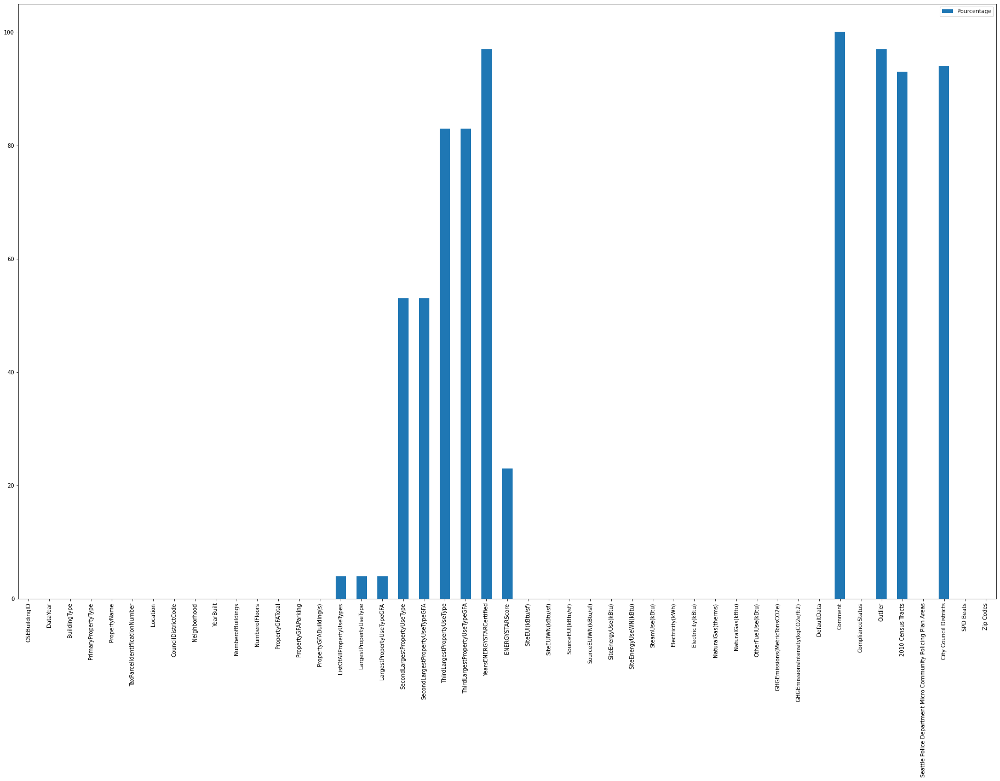

In [18]:
# Pourcentage de Valeurs Manquantes selon les différentes Variables :

plt.rcParams["figure.figsize"] = (32,20)
barchart = missing_df1.plot.bar(y='Pourcentage')

# JSON

In [19]:
# Chargement du fichier json "Metadata 2015" :

import json
metadata1 = open('socrata_metadata_2015-building-energy-benchmarking.json')
metadata2015 = json.load(metadata1)
metadata2015

{'id': 'h7rm-fz6m',
 'name': '2015 Building Energy Benchmarking',
 'assetType': 'dataset',
 'attribution': 'City of Seattle',
 'attributionLink': 'http://www.seattle.gov/environment',
 'averageRating': 0,
 'createdAt': 1492461362,
 'description': "Seattle’s Building Energy Benchmarking and Reporting Program (SMC 22.920) requires owners of non-residential and multifamily buildings (20,000 square feet or larger) to track energy performance and annually report to the City of Seattle. Buildings account for 33% of Seattle's core emissions. The benchmarking policy supports Seattle's goals to reduce energy use and greenhouse gas emissions from existing buildings. In 2013, the City of Seattle adopted a Climate Action Plan to achieve zero net greenhouse gas (GHG) emissions by 2050. Annual benchmarking, reporting and disclosing of building performance are foundational elements of creating more market value for energy efficiency.\r\nPer Ordinance (125000), starting with 2015 energy use performanc

In [20]:
# Normalisation Json 2015 :

with open('socrata_metadata_2015-building-energy-benchmarking.json') as f:
    metadata_2015 = json.load(f)
pd.json_normalize(metadata_2015)

id                               name assetType      attribution  \
0  h7rm-fz6m  2015 Building Energy Benchmarking  dataset   City of Seattle   

                      attributionLink  averageRating   createdAt  \
0  http://www.seattle.gov/environment  0              1492461362   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  description  \
0  Seattle’s Building Energy Benchmarking and Reporting Program (SMC 22.920) requires owners of non-residential and multifamily buildings (20,000 square feet or larger) to track energy performance and annually report to the City of Seattle. Buildings account for 33% of Seattle's core emissions. The benchmarking policy supports Seattle's goals to reduce energy use and greenhouse gas emissions from existing buildings. In 2013, the City of Seattle adopted a Climate Action Plan to achieve zero net greenhouse gas (GHG) emissions by 2050. Annual benchmarking, reporting and disclosing of building performance are foundational elements of creating more market value for energy efficiency.\r\nPer Ordinance (125000), starting with 2015 energy use performance reporting, the City of Seattle will make the data for all building 20,000 SF and larger available annually. This update to the benchmarking mandate was passed by Seattle City Council on February 29, 2016.\r\n\r\nIf you have questions or comments on the data, email us at energybenchmarking@seattle.gov and include Open Data in the subject line.   

  displayType  downloadCount  hideFromCatalog  hideFromDataJson  \
0  table       2905           False            False              

   indexUpdatedAt      licenseId  newBackend  numberOfComments       oid  \
0  1551379229      PUBLIC_DOMAIN  True        0                 28249767   

  provenance  publicationAppendEnabled  publicationDate  publicationGroup  \
0  official   False                     1521489624       14152737           

  publicationStage  rowsUpdatedAt rowsUpdatedBy   tableId  totalTimesRated  \
0  published        1521489255     9yyf-ecsx     14945997  0                 

   viewCount  viewLastModified viewType  \
0  5220       1618951804        tabular   

                                                                                                                                                                                                                                                                                                                                                                                                                                      approvals  \
0  [{'reviewedAt': 1521489624, 'reviewedAutomatically': True, 'state': 'approved', 'submissionId': 331106, 'submissionObject': 'public_audience_request', 'submissionOutcome': 'change_audience', 'submittedAt': 1521489624, 'workflowId': 623, 'submissionDetails': {'permissionType': 'READ'}, 'submissionOutcomeApplication': {'failureCount': 0, 'status': 'success'}, 'submitter': {'id': 

In [21]:
# Chargement du fichier json "Metadata 2015" (Chaîne de Caractère) :

data_str1 = json.dumps(metadata2015)
print(data_str1)

{"id": "h7rm-fz6m", "name": "2015 Building Energy Benchmarking", "assetType": "dataset", "attribution": "City of Seattle", "attributionLink": "http://www.seattle.gov/environment", "averageRating": 0, "createdAt": 1492461362, "description": "Seattle\u2019s Building Energy Benchmarking and Reporting Program (SMC 22.920) requires owners of non-residential and multifamily buildings (20,000 square feet or larger) to track energy performance and annually report to the City of Seattle. Buildings account for 33% of Seattle's core emissions. The benchmarking policy supports Seattle's goals to reduce energy use and greenhouse gas emissions from existing buildings. In 2013, the City of Seattle adopted a Climate Action Plan to achieve zero net greenhouse gas (GHG) emissions by 2050. Annual benchmarking, reporting and disclosing of building performance are foundational elements of creating more market value for energy efficiency.\r\nPer Ordinance (125000), starting with 2015 energy use performance 

# Informations 2016 :

# CSV :

In [22]:
# Chargement du fichier csv "Building 2016" :

building2016 = pd.read_csv('2016-building-energy-benchmarking.csv')

In [23]:
# Visualisation de la Dataframe "Building 2016" :

building2016

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.00,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,21566554.00,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.00,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.00,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,65.900002,114.199997,118.900002,9.502762e+05,1.053706e+06,0.00,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recreation, Swimming Pool",Other - Recreation,7583.0,Fitness Center/Health Club/Gy

In [24]:
# Listage des colonnes constituant la dataframe initiale :

building2016.columns.to_list()

['OSEBuildingID',
 'DataYear',
 'BuildingType',
 'PrimaryPropertyType',
 'PropertyName',
 'Address',
 'City',
 'State',
 'ZipCode',
 'TaxParcelIdentificationNumber',
 'CouncilDistrictCode',
 'Neighborhood',
 'Latitude',
 'Longitude',
 'YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'YearsENERGYSTARCertified',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'NaturalGas(therms)',
 'NaturalGas(kBtu)',
 'DefaultData',
 'Comments',
 'ComplianceStatus',
 'Outlier',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity']

In [25]:
# Nombre de Lignes / Nombre de Colonnes de la Dataframe initiale :

building2016.shape

(3376, 46)

In [26]:
# Types de Variables Qualitatives et Quantitatives de la Dataframe intiale :

building2016.dtypes

OSEBuildingID                      int64  
DataYear                           int64  
BuildingType                       object 
PrimaryPropertyType                object 
PropertyName                       object 
Address                            object 
City                               object 
State                              object 
ZipCode                            float64
TaxParcelIdentificationNumber      object 
CouncilDistrictCode                int64  
Neighborhood                       object 
Latitude                           float64
Longitude                          float64
YearBuilt                          int64  
NumberofBuildings                  float64
NumberofFloors                     int64  
PropertyGFATotal                   int64  
PropertyGFAParking                 int64  
PropertyGFABuilding(s)             int64  
ListOfAllPropertyUseTypes          object 
LargestPropertyUseType             object 
LargestPropertyUseTypeGFA          float64
SecondLarge

In [27]:
# Quantification des Valeurs Dupliquées de la Dataframe initiale :

building2016.duplicated().sum()

0

In [28]:
# Données Statistiques de la Dataframe Initiale :

building2016.describe()

,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity
count,3376.000000,3376.0,3360.000000,3376.000000,3376.000000,3376.000000,3376.000000,3368.000000,3376.000000,3.376000e+03,3376.000000,3.376000e+03,3.356000e+03,1679.000000,596.000000,2533.000000,3369.000000,3370.000000,3367.000000,3367.000000,3.371000e+03,3.370000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,0.0,3367.000000,3367.000000
mean,21208.991114,2016.0,98116.949107,4.439277,47.624033,-122.334795,1968.573164,1.106888,4.709123,9.483354e+04,8001.526066,8.683201e+04,7.917764e+04,28444.075817,11738.675166,67.918674,54.732116,57.033798,134.232848,137.783932,5.403667e+06,5.276726e+06,2.745959e+05,1.086639e+06,3.707612e+06,1.368505e+04,1.368505e+06,NaN,119.723971,1.175916
std,12223.757015,0.0,18.615205,2.120625,0.047758,0.027203,33.088156,2.108402,5.494465,2.188376e+05,32326.723928,2.079398e+05,2.017034e+05,54392.917928,29331.199286,26.873271,56.273124,57.163330,139.287554,139.109807,2.161063e+07,1.593879e+07,3.912173e+06,4.352478e+06,1.485066e+07,6.709781e+04,6.709781e+06,NaN,538.832227,1.821452
min,1.000000,2016.0,98006.000000,1.000000,47.499170,-122.414250,1900.000000,0.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,-2.100000,0.000000e+00,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,NaN,-0.800000,-0.020000
25%,19990.750000,2016.0,98105.000000,3.000000,47.599860,-122.350662,1948.000000,1.000000,2.000000,2.848700e+04,0.000000,2.775600e+04,2.509475e+04,5000.000000,2239.000000,53.000000,27.900000,29.400000,74.699997,78.400002,9.251286e+05,9.701822e+05,0.000000e+00,1.874229e+05,6.394870e+05,0.000000e+00,0.000000e+00,NaN,9.495000,0.210000
50%,23112.000000,2016.0,98115.000000,4.000000,47.618675,-122.332495,1975.000000,1.000000,4.000000,4.417500e+04,0.000000,4.321600e+04,3.989400e+04,10664.000000,5043.000000,75.000000,38.599998,40.900002,96.199997,101.099998,1.803753e+06,1.904452e+06,0.000000e+00,3.451299e+05,1.177583e+06,3.237538e+03,3.237540e+05,NaN,33.920000,0.610000
75%,25994.250000,2016.0,98122.000000,7.000000,47.657115,-122.319407,1997.000000,1.000000,5.000000,9.099200e+04,0.000000,8.427625e+04,7.620025e+04,26640.000000,10138.750000,90.000000,60.400002,64.275002,143.899994,148.349998,4.222455e+06,4.381429e+06,0.000000e+00,8.293178e+05,2.829632e+06,1.189033e+04,1.189034e+06,NaN,93.940000,1.370000
max,50226.000000,2016.0,98272.000000,7.000000,47.733870,-122.220966,2015.000000,111.000000,99.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,686750.000000,459748.000000,100.000000,834.400024,834.400024,2620.000000,2620.000000,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,NaN,16870.980000,34.090000


<AxesSubplot:>

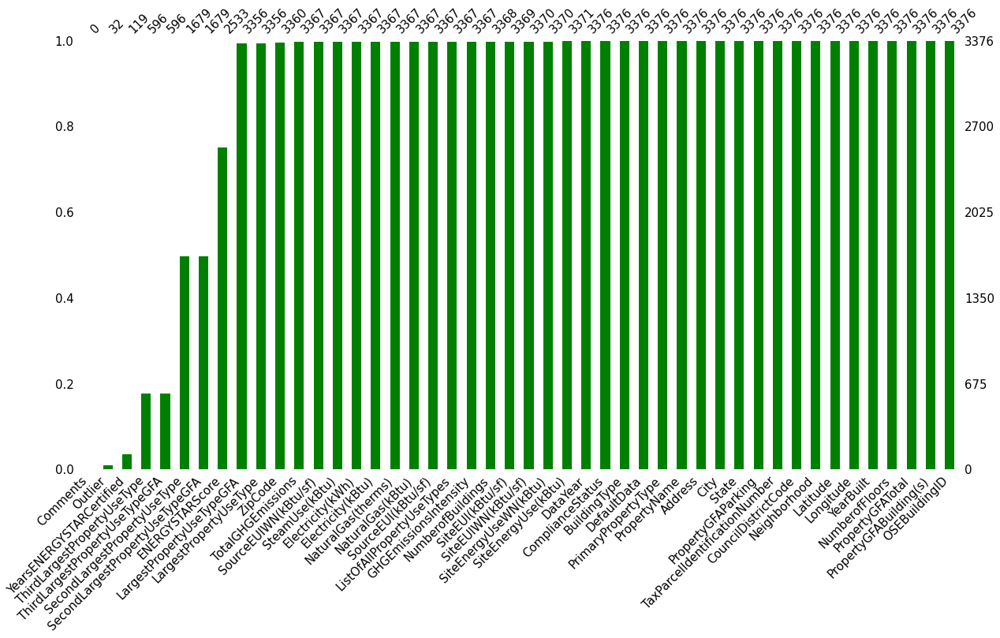

In [29]:
# Matrice de Remplissage des NaN de la Dataframe initiale :

msno.bar(building2016, sort = "ascending", color = "green", figsize = (20,10), fontsize = 15)

<AxesSubplot:>

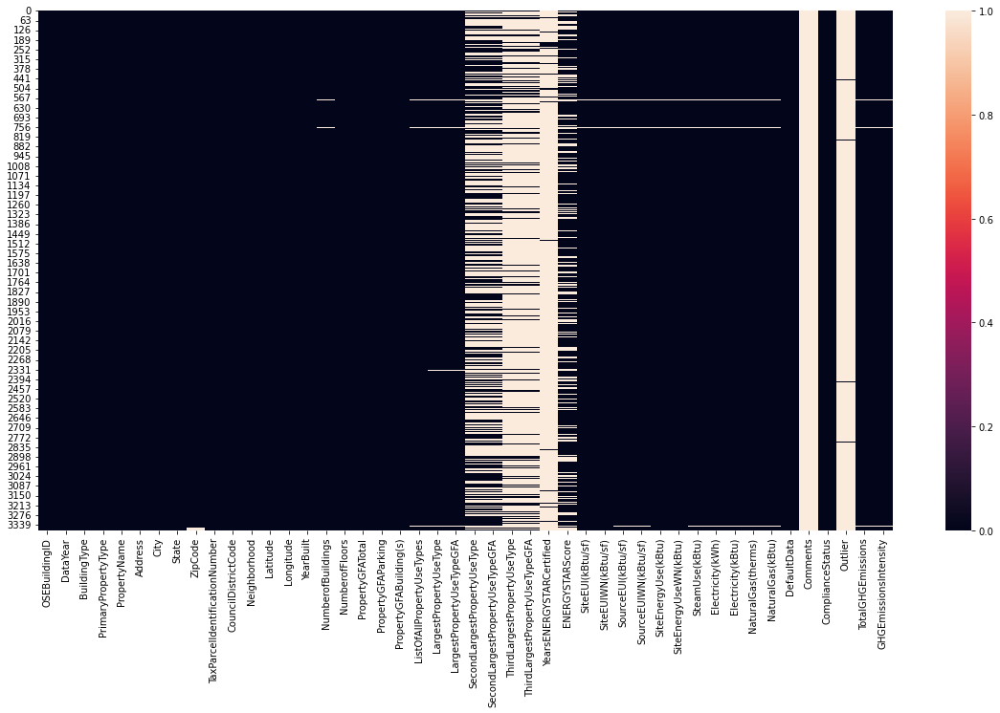

In [30]:
# Heatmap de Valeurs Manquantes de la Dataframe d'Origine :

fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(building2016.isnull())

In [31]:
# Traduction en Pourcentage des Valeurs Manquantes :

missing_count2 = building2016.isnull().sum()
missing_count2

OSEBuildingID                      0   
DataYear                           0   
BuildingType                       0   
PrimaryPropertyType                0   
PropertyName                       0   
Address                            0   
City                               0   
State                              0   
ZipCode                            16  
TaxParcelIdentificationNumber      0   
CouncilDistrictCode                0   
Neighborhood                       0   
Latitude                           0   
Longitude                          0   
YearBuilt                          0   
NumberofBuildings                  8   
NumberofFloors                     0   
PropertyGFATotal                   0   
PropertyGFAParking                 0   
PropertyGFABuilding(s)             0   
ListOfAllPropertyUseTypes          9   
LargestPropertyUseType             20  
LargestPropertyUseTypeGFA          20  
SecondLargestPropertyUseType       1697
SecondLargestPropertyUseTypeGFA    1697


In [32]:
# Traduction en Pourcentage des Valeurs Manquantes :

value_count2 = building2016.isnull().count()
value_count2

OSEBuildingID                      3376
DataYear                           3376
BuildingType                       3376
PrimaryPropertyType                3376
PropertyName                       3376
Address                            3376
City                               3376
State                              3376
ZipCode                            3376
TaxParcelIdentificationNumber      3376
CouncilDistrictCode                3376
Neighborhood                       3376
Latitude                           3376
Longitude                          3376
YearBuilt                          3376
NumberofBuildings                  3376
NumberofFloors                     3376
PropertyGFATotal                   3376
PropertyGFAParking                 3376
PropertyGFABuilding(s)             3376
ListOfAllPropertyUseTypes          3376
LargestPropertyUseType             3376
LargestPropertyUseTypeGFA          3376
SecondLargestPropertyUseType       3376
SecondLargestPropertyUseTypeGFA    3376


In [33]:
# Calcul du Pourcentage de Valeurs Manquantes :

missing_percentage2 = round((missing_count2 / value_count2) * 100)

In [34]:
# Dataframe des Pourcentages de NaN :

missing_df2 = pd.DataFrame({'Nombre' : missing_count2, 'Pourcentage' : missing_percentage2})

In [35]:
# Dataframe "Missing_df" :

missing_df2

,Nombre,Pourcentage
OSEBuildingID,0,0.0
DataYear,0,0.0
BuildingType,0,0.0
PrimaryPropertyType,0,0.0
PropertyName,0,0.0
Address,0,0.0
City,0,0.0
State,0,0.0
ZipCode,16,0.0
TaxParcelIdentificationNumber,0,0.0


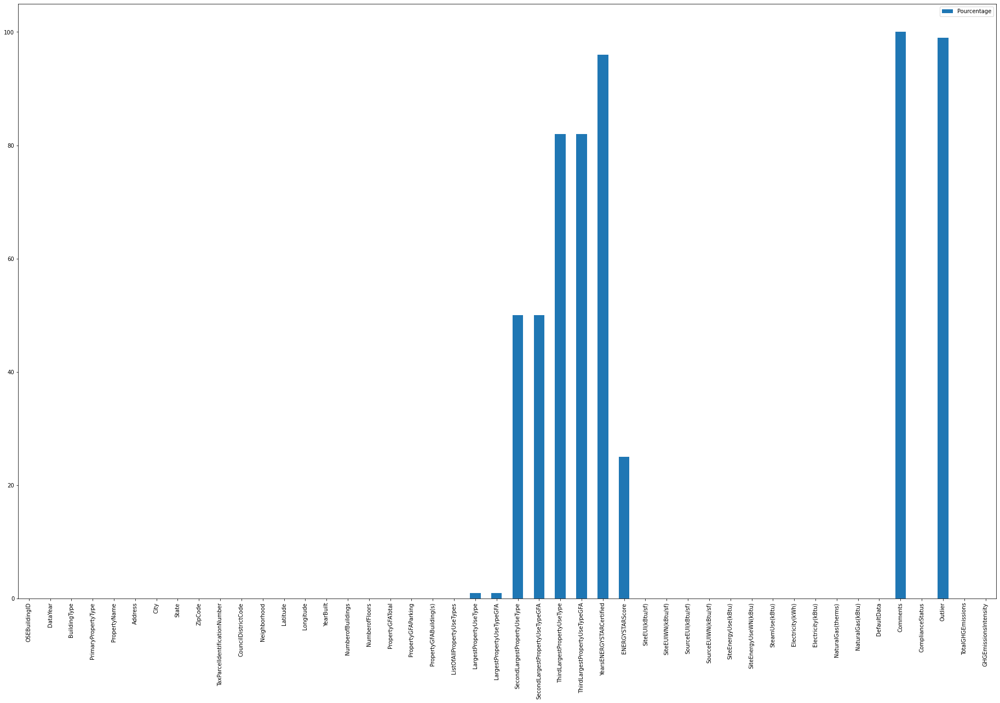

In [36]:
# Pourcentage de Valeurs Manquantes selon les différentes Variables :

plt.rcParams["figure.figsize"] = (32,20)
barchart = missing_df2.plot.bar(y='Pourcentage')

# JSON :

In [37]:
# Chargement du fichier json "Metadata 2016" :

import json
metadata2 = open('socrata_metadata_2016-building-energy-benchmarking.json')
metadata2016 = json.load(metadata2)
metadata2016

{'id': '2bpz-gwpy',
 'name': '2016 Building Energy Benchmarking',
 'assetType': 'dataset',
 'attribution': 'City of Seattle',
 'attributionLink': 'https://www.seattle.gov/energybenchmarking',
 'averageRating': 0,
 'createdAt': 1521070051,
 'description': "Seattle’s Building Energy Benchmarking and Reporting Program (SMC 22.920) requires owners of non-residential and multifamily buildings (20,000 square feet or larger) to track energy performance and annually report to the City of Seattle. Buildings account for 33% of Seattle's core emissions. The benchmarking policy supports Seattle's goals to reduce energy use and greenhouse gas emissions from existing buildings. In 2013, the City of Seattle adopted a Climate Action Plan to achieve zero net greenhouse gas (GHG) emissions by 2050. Annual benchmarking, reporting and disclosing of building performance are foundational elements of creating more market value for energy efficiency.\nPer Ordinance (125000), starting with 2015 energy use perf

In [38]:
# Normalisation Json 2016 :

with open('socrata_metadata_2016-building-energy-benchmarking.json') as g:
    metadata_2016 = json.load(g)
pd.json_normalize(metadata_2016)

id                               name assetType      attribution  \
0  2bpz-gwpy  2016 Building Energy Benchmarking  dataset   City of Seattle   

                              attributionLink  averageRating   createdAt  \
0  https://www.seattle.gov/energybenchmarking  0              1521070051   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            description  \
0  Seattle’s Building Energy Benchmarking and Reporting Program (SMC 22.920) requires owners of non-residential and multifamily buildings (20,000 square feet or larger) to track energy performance and annually report to the City of Seattle. Buildings account for 33% of Seattle's core emissions. The benchmarking policy supports Seattle's goals to reduce energy use and greenhouse gas emissions from existing buildings. In 2013, the City of Seattle adopted a Climate Action Plan to achieve zero net greenhouse gas (GHG) emissions by 2050. Annual benchmarking, reporting and disclosing of building performance are foundational elements of creating more market value for energy efficiency.\nPer Ordinance (125000), starting with 2015 energy use performance reporting, the City of Seattle will make the data for all building 20,000 SF and larger available annually. This update to the benchmarking mandate was passed by Seattle City Council on February 29, 2016.\n\nIf you have questions or comments on the data, email us at energybenchmarking@seattle.gov and include Open Data in the subject line.   

  displayType  downloadCount  hideFromCatalog  hideFromDataJson  \
0  table       2331           False            False              

   indexUpdatedAt      licenseId  newBackend  numberOfComments       oid  \
0  1521490072      PUBLIC_DOMAIN  True        0                 28218043   

  provenance  publicationAppendEnabled  publicationDate  publicationGroup  \
0  official   False                     1521071079       14936543           

  publicationStage  rowIdentifierColumnId  rowsUpdatedAt rowsUpdatedBy  \
0  published        349768636              1521071078     9yyf-ecsx      

    tableId  totalTimesRated  viewCount  viewLastModified viewType  \
0  14936543  0                3345       1618951870        tabular   

                                                                                                                                                                                                                                                                                                                                                                                                                                      approvals  \
0  [{'reviewedAt': 1521071079, 'reviewedAutomatically': True, 'state': 'approved', 'submissionId': 331104, 'submissionObject': 'public_audience_request', 'submissionOutcome': 'change_audience', 'submittedAt': 1521071079, 'workflowId': 623, 'submissionDetails': {'permissionType': 'READ'}, 'submissionOutcomeApplication': {'failureCou

In [39]:
# Chargement du fichier json "Metadata 2016" (Chaîne de Caractère) :

data_str2 = json.dumps(metadata2016)
print(data_str2)

{"id": "2bpz-gwpy", "name": "2016 Building Energy Benchmarking", "assetType": "dataset", "attribution": "City of Seattle", "attributionLink": "https://www.seattle.gov/energybenchmarking", "averageRating": 0, "createdAt": 1521070051, "description": "Seattle\u2019s Building Energy Benchmarking and Reporting Program (SMC 22.920) requires owners of non-residential and multifamily buildings (20,000 square feet or larger) to track energy performance and annually report to the City of Seattle. Buildings account for 33% of Seattle's core emissions. The benchmarking policy supports Seattle's goals to reduce energy use and greenhouse gas emissions from existing buildings. In 2013, the City of Seattle adopted a Climate Action Plan to achieve zero net greenhouse gas (GHG) emissions by 2050. Annual benchmarking, reporting and disclosing of building performance are foundational elements of creating more market value for energy efficiency.\nPer Ordinance (125000), starting with 2015 energy use perfor

# II COMPARAISON VARIABLES DATAFRAME 2015 et DATAFRAME 2016 :

In [40]:
# Fonction de Comparaison : 

def compare_colums(df1,df2):
    columns_1 = list(df1.columns) 
    columns_2 = list(df2.columns)
    same_columns=[]
    diff_columns_2=[]
    diff_columns_1=[]

    for col in columns_2:
        if col in columns_1:
            same_columns.append(col)
        else:
            diff_columns_2.append(col)
    for col in columns_1:
        if col not in columns_2:
            diff_columns_1.append(col)
    return diff_columns_1, diff_columns_2

In [41]:
# Comparaison des Colonnes entre 2015 et 2016 :

diff_columns_2015, diff_columns_2016 = compare_colums(building2015, building2016)
diff_columns_2015

['Location',
 'OtherFuelUse(kBtu)',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'Comment',
 '2010 Census Tracts',
 'Seattle Police Department Micro Community Policing Plan Areas',
 'City Council Districts',
 'SPD Beats',
 'Zip Codes']

In [42]:
# Comparaison des Colonnes entre 2015 et 2016 :

diff_columns_2015, diff_columns_2016 = compare_colums(building2015, building2016)
diff_columns_2016

['Address',
 'City',
 'State',
 'ZipCode',
 'Latitude',
 'Longitude',
 'Comments',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity']

In [43]:
# Noms des Variables communes aux deux dataframes 2015 et 2016 :

common = np.intersect1d(building2015.columns, building2016.columns)

In [44]:
# Listage de ces Variables :

common.tolist()

['BuildingType',
 'ComplianceStatus',
 'CouncilDistrictCode',
 'DataYear',
 'DefaultData',
 'ENERGYSTARScore',
 'Electricity(kBtu)',
 'Electricity(kWh)',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'ListOfAllPropertyUseTypes',
 'NaturalGas(kBtu)',
 'NaturalGas(therms)',
 'Neighborhood',
 'NumberofBuildings',
 'NumberofFloors',
 'OSEBuildingID',
 'Outlier',
 'PrimaryPropertyType',
 'PropertyGFABuilding(s)',
 'PropertyGFAParking',
 'PropertyGFATotal',
 'PropertyName',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SteamUse(kBtu)',
 'TaxParcelIdentificationNumber',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'YearBuilt',
 'YearsENERGYSTARCertified']

In [45]:
# Nombre de Variables Communes :

len(common)

37

In [46]:
# Noms de variables présentes en 2015 et pas en 2016 :

morecolumns2015 = set(building2015.columns) - set(building2016.columns)
morecolumns2015

{'2010 Census Tracts',
 'City Council Districts',
 'Comment',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'Location',
 'OtherFuelUse(kBtu)',
 'SPD Beats',
 'Seattle Police Department Micro Community Policing Plan Areas',
 'Zip Codes'}

In [47]:
# Noms de variables présentes en 2016 et pas en 2015 :

morecolumns2016 = set(building2016.columns) - set(building2015.columns)
morecolumns2016

{'Address',
 'City',
 'Comments',
 'GHGEmissionsIntensity',
 'Latitude',
 'Longitude',
 'State',
 'TotalGHGEmissions',
 'ZipCode'}

In [48]:
# Nombre de Variables en plus, en 2015 :

len(morecolumns2015)

10

In [49]:
# Nombre de Variables en plus, en 2016 :

len(morecolumns2016)

9

In [50]:
# Contenu de la Colonne "Location" en 2015 :

import ast

ast.literal_eval(building2015['Location'][1])

{'latitude': '47.61310583',
 'longitude': '-122.33335756',
 'human_address': '{"address": "724 PINE ST", "city": "SEATTLE", "state": "WA", "zip": "98101"}'}

In [51]:
# Latitude 2015 :

building2015['Latitude'] = [ast.literal_eval(
    row)['latitude'] for row in building2015['Location']]

# Longitude 2015 :

building2015['Longitude'] = [ast.literal_eval(
    row)['longitude'] for row in building2015['Location']]

# Adresse du Bâtiment 2015 :

building2015['Address'] = [ast.literal_eval(ast.literal_eval(row)['human_address'])[
    'address'] for row in building2015['Location']]

building2015['City'] = [ast.literal_eval(ast.literal_eval(row)['human_address'])[
    'city'] for row in building2015['Location']]

building2015['ZipCode'] = [ast.literal_eval(ast.literal_eval(row)['human_address'])[
    'zip'] for row in building2015['Location']]

building2015['State'] = [ast.literal_eval(ast.literal_eval(row)['human_address'])[
    'state'] for row in building2015['Location']]

In [52]:
# Nouvelle présentation de la Dataframe 2015 :

building2015.drop(['Location'], axis = 1)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes,Latitude,Longitude,Address,City,ZipCode,State
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.61219025,-122.33799744,405 OLIVE WAY,SEATTLE,98101,WA
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.61310583,-122.33335756,724 PINE ST,SEATTLE,98101,WA
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,7,DOWNTOWN,1969,1,41.0,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,0.0,2061.48,1.92,Yes,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081,47.61334897,-122.33769944,1900 5TH AVE,SEATTLE,98101,WA
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,7,DOWNTOWN,1926,1,10.0,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,1.0,460.4,462.5,636.3,643.2,28229320.0,28363444.0,23458518.0,811521.0,2769023.0,20019.0,2001894.0,0.0,1936.34,31.38,No,NaN,Compliant,High Outlier,NaN,56.0,NaN,31.0,18081,47.61421585,-122.33660889,620 STEWART ST,SEATTLE,98101,WA
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,7,DOWNTOWN,1980,1,18.0,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,67.0,120.1,122.1,228.8,227.1,14829099.0,15078243.0,0.0,1777841.0,6066245.0,87631.0,8763105.0,0.0,507.70,4.02,No,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,19576,47.6137544,-122.3409238,401 LENORA ST,SEATTLE,98121,WA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3335,50049,2015,Multifamily LR (1-4),Low-Rise Multifamily,PACIFIC CENTER CONDOMINIUM,6599950000,2,DOWNTOWN,2000,1,4.0,44650,0,44650,Multifamily Housing,Multifamily Housing,44650.0,NaN,NaN,NaN,NaN,NaN,71.0,25.6,27.8,80.4,87.2,1142949.0,1240429.0,0.0,334979.0,1142996.0,0.0,0.0,0.0,7.97,0.07,No,NaN,Compliant,NaN,NaN,26.0,NaN,16.0,18379,47.59950256,-122.32034302,321 10TH AVE S,SEATTLE,98104,WA
3336,50055,2015,Multifamily MR (5-9),Mid-Rise Multifamily,IDENTITY APTS 4123,1142001670,4,NORTHEAST,2014,1,7.0,42393,0,42393,Multifamily Housing,Multifamily Housing,31748.0,NaN,NaN,NaN,NaN,NaN,98.0,48.6,55.1,124.2,144.7,1543282.0,1750143.0,0.0,325705.0,1111352.0,4320.0,431976.0,0.0,30.69,0.61,No,NaN,Compliant,NaN,NaN,60.0,NaN,38.0,18383,47.65752471,-122.3160159,4123 12TH AVE NE,SEATTLE,98105,WA
3337,50057,2015,Multifamily HR (10+),High-Rise Multifamily,CIRRUS,660000575,7,DOWNTOWN,2015,1,40.0,319481,41915,277566,"Multifamily Housing

In [53]:
# Renommage :

building2015.rename(columns = {'Comment':'Comments'})

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comments,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes,Latitude,Longitude,Address,City,ZipCode,State
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122.33799744', 'human_address': '{""address"": ""405 OLIVE WAY"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.61219025,-122.33799744,405 OLIVE WAY,SEATTLE,98101,WA
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122.33335756', 'human_address': '{""address"": ""724 PINE ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.61310583,-122.33335756,724 PINE ST,SEATTLE,98101,WA
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,"{'latitude': '47.61334897', 'longitude': '-122.33769944', 'human_address': '{""address"": ""1900 5TH AVE"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1969,1,41.0,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,0.0,2061.48,1.92,Yes,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081,47.61334897,-122.33769944,1900 5TH AVE,SEATTLE,98101,WA
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,"{'latitude': '47.61421585', 'longitude': '-122.33660889', 'human_address': '{""address"": ""620 STEWART ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1926,1,10.0,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,1.0,460.4,462.5,636.3,643.2,28229320.0,28363444.0,23458518.0,811521.0,2769023.0,20019.0,2001894.0,0.0,1936.34,31.38,No,NaN,Compliant,High Outlier,NaN,56.0,NaN,31.0,18081,47.61421585,-122.33660889,620 STEWART ST,SEATTLE,98101,WA
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,"{'latitude': '47.6137544', 'longitude': '-122.3409238', 'human_address': '{""address"": ""401 LENORA ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98121""}'}",7,DOWNTOWN,1980,1,18.0,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,67.0,120.1,122.1,228.8,227.1,14829099.0,15078243.0,0.0,1777841.0,6066245.0,87631.0,8763105.0,0.0,507.70,4.02,No,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,19576,47.6137544,-122.3409238,401 LENORA ST,SEATTLE,98121,WA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3335,50049,2015,Multifamily LR (1-4),Low-Rise

In [54]:
# Contenu de la Colonne "Latitude" en 2016 :

building2016['Latitude'].sample(10).to_list()

[47.59819,
 47.58685,
 47.6123,
 47.6161,
 47.6214,
 47.65476,
 47.61472,
 47.66984,
 47.6012,
 47.60707]

In [55]:
# Contenu de la Variable "GHGEmissions(MetricTonsCO2e)" en 2015 :

CO2_2015 = building2015['GHGEmissions(MetricTonsCO2e)']
CO2_2015.head(10)

0    249.43 
1    263.51 
2    2061.48
3    1936.34
4    507.70 
5    304.62 
6    208.46 
7    199.99 
8    331.61 
9    170.00 
Name: GHGEmissions(MetricTonsCO2e), dtype: float64

In [56]:
# Données Statistiques CO2 2015 : 

CO2_2015.describe()

count    3330.000000 
mean     110.094102  
std      409.450179  
min      0.000000    
25%      9.265000    
50%      32.740000   
75%      88.642500   
max      11824.890000
Name: GHGEmissions(MetricTonsCO2e), dtype: float64

In [57]:
# Contenu de la Variable "GHGEmissions(MetricTonsCO2e)" en 2016 :

CO2_2016 = building2015['GHGEmissions(MetricTonsCO2e)']
CO2_2016.head(10)

0    249.43 
1    263.51 
2    2061.48
3    1936.34
4    507.70 
5    304.62 
6    208.46 
7    199.99 
8    331.61 
9    170.00 
Name: GHGEmissions(MetricTonsCO2e), dtype: float64

In [58]:
# Données Statistiques CO2 2016 : 

CO2_2016.describe()

count    3330.000000 
mean     110.094102  
std      409.450179  
min      0.000000    
25%      9.265000    
50%      32.740000   
75%      88.642500   
max      11824.890000
Name: GHGEmissions(MetricTonsCO2e), dtype: float64

In [59]:
# Stats 2015 et C02 :

building2015['GHGEmissions(MetricTonsCO2e)'].describe()

count    3330.000000 
mean     110.094102  
std      409.450179  
min      0.000000    
25%      9.265000    
50%      32.740000   
75%      88.642500   
max      11824.890000
Name: GHGEmissions(MetricTonsCO2e), dtype: float64

In [60]:
# Stats 2016 et C02 :

building2016['TotalGHGEmissions'].describe()

count    3367.000000 
mean     119.723971  
std      538.832227  
min     -0.800000    
25%      9.495000    
50%      33.920000   
75%      93.940000   
max      16870.980000
Name: TotalGHGEmissions, dtype: float64

In [61]:
# Stats 2015 et Intensity :

building2015['GHGEmissionsIntensity(kgCO2e/ft2)'].describe()

count    3330.000000
mean     0.985339   
std      1.637172   
min      0.000000   
25%      0.080000   
50%      0.460000   
75%      1.180000   
max      31.380000  
Name: GHGEmissionsIntensity(kgCO2e/ft2), dtype: float64

In [62]:
# Stats 2016 et Intensity :

building2016['GHGEmissionsIntensity'].describe()

count    3367.000000
mean     1.175916   
std      1.821452   
min     -0.020000   
25%      0.210000   
50%      0.610000   
75%      1.370000   
max      34.090000  
Name: GHGEmissionsIntensity, dtype: float64

In [63]:
# Comparaison des types de données :

pd.DataFrame([building2015.dtypes, building2016.dtypes])

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes,Latitude,Longitude,Address,City,ZipCode,State,Comments,TotalGHGEmissions,GHGEmissionsIntensity
0,int64,int64,object,object,object,object,object,int64,object,int64,int64,float64,int64,int64,int64,object,object,float64,object,float64,object,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,object,object,object,float64,float64,float64,float64,int64,object,object,object,object,object,object,NaN,NaN,NaN
1,int64,int64,object,object,object,object,NaN,int64,object,int64,float64,int64,int64,int64,int64,object,object,float64,object,float64,object,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,NaN,NaN,NaN,bool,NaN,object,object,NaN,NaN,NaN,NaN,NaN,float64,float64,object,object,float64,object,float64,float64,float64


In [64]:
# Transformation des Types de Variables :

building2015['Location'] = building2015['Location'].astype('object')
building2015['NumberofBuildings'] = building2015['NumberofBuildings'].astype('int64')
building2016['NumberofBuildings'] = building2015['NumberofBuildings'].astype('int64')
building2015['DefaultData'] = building2015['DefaultData'].map({'No': False, 'Yes': True}).astype('bool')
building2015['NumberofFloors'] = building2015['NumberofFloors'].fillna(0)
building2015['NumberofFloors'] = building2015['NumberofFloors'].astype('int32')
building2015[['Latitude', 'Longitude']] = building2015[['Latitude', 'Longitude']].astype('float32')
building2015['CouncilDistrictCode'] = building2015['CouncilDistrictCode'].apply(str).astype('object')
building2016['NumberofBuildings'] = building2016['NumberofBuildings'].fillna(0)
building2016['NumberofBuildings'] = building2016['NumberofBuildings'].astype('int32')
building2016[['Latitude', 'Longitude']] = building2016[['Latitude', 'Longitude']].astype('float32')
building2016['CouncilDistrictCode'] = building2016['CouncilDistrictCode'].apply(str).astype('object')

In [65]:
# Vérification : 

building2015.dtypes

OSEBuildingID                                                    int64  
DataYear                                                         int64  
BuildingType                                                     object 
PrimaryPropertyType                                              object 
PropertyName                                                     object 
TaxParcelIdentificationNumber                                    object 
Location                                                         object 
CouncilDistrictCode                                              object 
Neighborhood                                                     object 
YearBuilt                                                        int64  
NumberofBuildings                                                int64  
NumberofFloors                                                   int32  
PropertyGFATotal                                                 int64  
PropertyGFAParking                                 

# Bilan :
    
# 2015 :

OtherFuelUse(kBtu) : Suppression, car très peu de données.

GHGEmissions(MetricTonsCO2e) : Correspond à la colonne TotalGHGEmissions du fichier 2016 => On donne le même nom à cette colonne, 2015 et 2016.

GHGEmissionsIntensity(kgCO2e/ft2) : Correspond à la colonne GHGEmissionsIntensity du fichier 2016 => On donne le même nom à cette colonne, 2015 et 2016.

Comment : Suppression, car très peu de données. 
    
"2010" Census Tracts : Suppression, car très peu de données. 

Seattle Police Department Micro Community Policing Plan Areas : Suppression, car très peu de données. 

City Council Districts : Suppression, car très peu de données. 

SPD Beats : Suppression, car très peu de données. 
    
Zip Codes : Suppression, car très peu de données.

Autres Variables : Suppression, car données peu utiles.

# 2016 :

Comments : Suppression, car très peu de données.  

TotalGHGEmissions : Correspond à la colonne TotalGHGEmissions du fichier 2016 => On donne le même nom à cette colonne, 2015 et 2016.

GHGEmissionsIntensity : Correspond à la colonne GHGEmissionsIntensity du fichier 2016 => On donne le même nom à cette colonne, 2015 et 2016.

"2010" Census Tracts : Suppression, car très peu de données. 

Seattle Police Department Micro Community Policing Plan Areas : Suppression, car très peu de données. 

City Council Districts : Suppression, car très peu de données. 

SPD Beats : Suppression, car très peu de données. 
    
Zip Codes : Suppression, car très peu de données.  

Autres Variables : Suppression, car données peu utiles.

# III PRODUCTION DATAFRAME D'ETUDE :

In [66]:
# Nombre de Lignes et de Colonnes de la Dataframe 2015 :

building2015.shape

(3340, 53)

In [67]:
# Présentation des premières lignes de la dataframe 2015 :

building2015.head(3)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes,Latitude,Longitude,Address,City,ZipCode,State
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122.33799744', 'human_address': '{""address"": ""405 OLIVE WAY"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1927,1,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,False,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.612190,-122.337997,405 OLIVE WAY,SEATTLE,98101,WA
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122.33335756', 'human_address': '{""address"": ""724 PINE ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1996,1,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,False,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.613106,-122.333359,724 PINE ST,SEATTLE,98101,WA
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,"{'latitude': '47.61334897', 'longitude': '-122.33769944', 'human_address': '{""address"": ""1900 5TH AVE"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}'}",7,DOWNTOWN,1969,1,41,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,0.0,2061.48,1.92,True,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081,47.613350,-122.337700,1900 5TH AVE,SEATTLE,98101,WA


In [68]:
# Elimination de plusieurs colonnes de la dataframe 2015 :

building2015prime = building2015.drop(['CouncilDistrictCode','OSEBuildingID','PropertyName','TaxParcelIdentificationNumber','ComplianceStatus','Comment','DefaultData','Location','OtherFuelUse(kBtu)','2010 Census Tracts','Seattle Police Department Micro Community Policing Plan Areas','City Council Districts','SPD Beats', 'Zip Codes'], axis=1)

In [69]:
# Présentation des premières lignes de la dataframe 2015 prime :

building2015prime.head(3)

,DataYear,BuildingType,PrimaryPropertyType,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),Outlier,Latitude,Longitude,Address,City,ZipCode,State
0,2015,NonResidential,Hotel,DOWNTOWN,1927,1,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,249.43,2.64,NaN,47.612190,-122.337997,405 OLIVE WAY,SEATTLE,98101,WA
1,2015,NonResidential,Hotel,DOWNTOWN,1996,1,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,263.51,2.38,NaN,47.613106,-122.333359,724 PINE ST,SEATTLE,98101,WA
2,2015,NonResidential,Hotel,DOWNTOWN,1969,1,41,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,2061.48,1.92,NaN,47.613350,-122.337700,1900 5TH AVE,SEATTLE,98101,WA


In [70]:
# Nombre de Lignes et de Colonnes de la Dataframe 2016 :

building2016.shape

(3376, 46)

In [71]:
# Présentation des premières lignes de la dataframe 2016Q :

building2016.head(3)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.612202,-122.337990,1927,1,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.0,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.613171,-122.333931,1996,1,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.613930,-122.338097,1969,1,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.0,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19


In [72]:
# Elimination de plusieurs colonnes de la dataframe 2015 :

building2016prime = building2016.drop(['PropertyName','OSEBuildingID','CouncilDistrictCode','TaxParcelIdentificationNumber','City','State','ZipCode','Comments','DefaultData','ComplianceStatus'], axis=1)

In [73]:
# Présentation des premières lignes de la dataframe 2016 prime :

building2016prime.head(3)

,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,2016,NonResidential,Hotel,405 Olive way,DOWNTOWN,47.612202,-122.337990,1927,1,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.0,1.156514e+06,3946027.0,12764.52930,1276453.0,NaN,249.98,2.83
1,2016,NonResidential,Hotel,724 Pine street,DOWNTOWN,47.613171,-122.333931,1996,1,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,9.504252e+05,3242851.0,51450.81641,5145082.0,NaN,295.86,2.86
2,2016,NonResidential,Hotel,1900 5th Avenue,DOWNTOWN,47.613930,-122.338097,1969,1,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.0,1.451544e+07,49526664.0,14938.00000,1493800.0,NaN,2089.28,2.19


In [74]:
# Renommage :

building2015prime['Address'] = building2015prime['Address'].str.title()
building2015prime['Neighborhood'] = building2015prime['Neighborhood'].str.title()
building2016prime['Address'] = building2016prime['Address'].str.title()
building2016prime['Neighborhood'] = building2016prime['Neighborhood'].str.title()
building2015prime.rename(columns = {'GHGEmissions(MetricTonsCO2e)':'TotalGHGEmissions', 'GHGEmissionsIntensity(kgCO2e/ft2)':'GHGEmissionsIntensity'}, inplace = True)

In [75]:
# Comparaison Finale des Deux Dataframes 2015 et 2016 :

diff_columns_2015, diff_columns_2016 = compare_colums(building2015prime,building2016prime)
print(diff_columns_2015,diff_columns_2016)

['City', 'ZipCode', 'State'] []


In [76]:
# Dataframe Finale :

jugatsu = pd.concat([building2015prime[building2016prime.columns],building2016prime], axis = 0).sort_values(["DataYear"])
jugatsu.shape

(6716, 36)

In [77]:
# Présentation des premières de la dataframe finale :

jugatsu.head(3)

,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,2015,NonResidential,Hotel,405 Olive Way,Downtown,47.612190,-122.337997,1927,1,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,NaN,249.43,2.64
2220,2015,Multifamily LR (1-4),Senior Care Community,1802 17Th Ave,Central,47.618053,-122.309799,1988,1,4,63998,0,63998,"Parking, Senior Care Community",Senior Care Community,63998.0,Parking,0.0,NaN,NaN,NaN,47.0,64.2,69.7,117.3,122.1,4107827.0,4458992.0,0.0,447664.0,1527492.0,25804.0,2580398.0,NaN,147.69,2.21
2221,2015,Multifamily LR (1-4),Low-Rise Multifamily,1720 E Denny Way,Central,47.618725,-122.309219,1920,1,3,24084,0,24084,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.0,26.3,30.4,62.2,73.7,632932.0,732772.0,0.0,116739.0,398331.0,2346.0,234618.0,NaN,15.24,0.56


In [78]:
# Traduction en Pourcentage des Valeurs Manquantes :

missing_count3 = jugatsu.isnull().sum()
missing_count3

DataYear                           0   
BuildingType                       0   
PrimaryPropertyType                0   
Address                            0   
Neighborhood                       0   
Latitude                           0   
Longitude                          0   
YearBuilt                          0   
NumberofBuildings                  0   
NumberofFloors                     0   
PropertyGFATotal                   0   
PropertyGFAParking                 0   
PropertyGFABuilding(s)             0   
ListOfAllPropertyUseTypes          136 
LargestPropertyUseType             156 
LargestPropertyUseTypeGFA          156 
SecondLargestPropertyUseType       3478
SecondLargestPropertyUseTypeGFA    3478
ThirdLargestPropertyUseType        5560
ThirdLargestPropertyUseTypeGFA     5560
YearsENERGYSTARCertified           6487
ENERGYSTARScore                    1623
SiteEUI(kBtu/sf)                   17  
SiteEUIWN(kBtu/sf)                 16  
SourceEUI(kBtu/sf)                 19  


In [79]:
# Traduction en Pourcentage des Valeurs Manquantes :

value_count3 = jugatsu.isnull().count()
value_count3

DataYear                           6716
BuildingType                       6716
PrimaryPropertyType                6716
Address                            6716
Neighborhood                       6716
Latitude                           6716
Longitude                          6716
YearBuilt                          6716
NumberofBuildings                  6716
NumberofFloors                     6716
PropertyGFATotal                   6716
PropertyGFAParking                 6716
PropertyGFABuilding(s)             6716
ListOfAllPropertyUseTypes          6716
LargestPropertyUseType             6716
LargestPropertyUseTypeGFA          6716
SecondLargestPropertyUseType       6716
SecondLargestPropertyUseTypeGFA    6716
ThirdLargestPropertyUseType        6716
ThirdLargestPropertyUseTypeGFA     6716
YearsENERGYSTARCertified           6716
ENERGYSTARScore                    6716
SiteEUI(kBtu/sf)                   6716
SiteEUIWN(kBtu/sf)                 6716
SourceEUI(kBtu/sf)                 6716


In [80]:
# Calcul du Pourcentage de Valeurs Manquantes :

missing_percentage3 = round((missing_count3 / value_count3) * 100)

In [81]:
# Dataframe des Pourcentages de NaN :

missing_df3 = pd.DataFrame({'Nombre' : missing_count3, 'Pourcentage' : missing_percentage3})

In [82]:
# Dataframe "Missing_df" :

missing_df3

,Nombre,Pourcentage
DataYear,0,0.0
BuildingType,0,0.0
PrimaryPropertyType,0,0.0
Address,0,0.0
Neighborhood,0,0.0
Latitude,0,0.0
Longitude,0,0.0
YearBuilt,0,0.0
NumberofBuildings,0,0.0
NumberofFloors,0,0.0


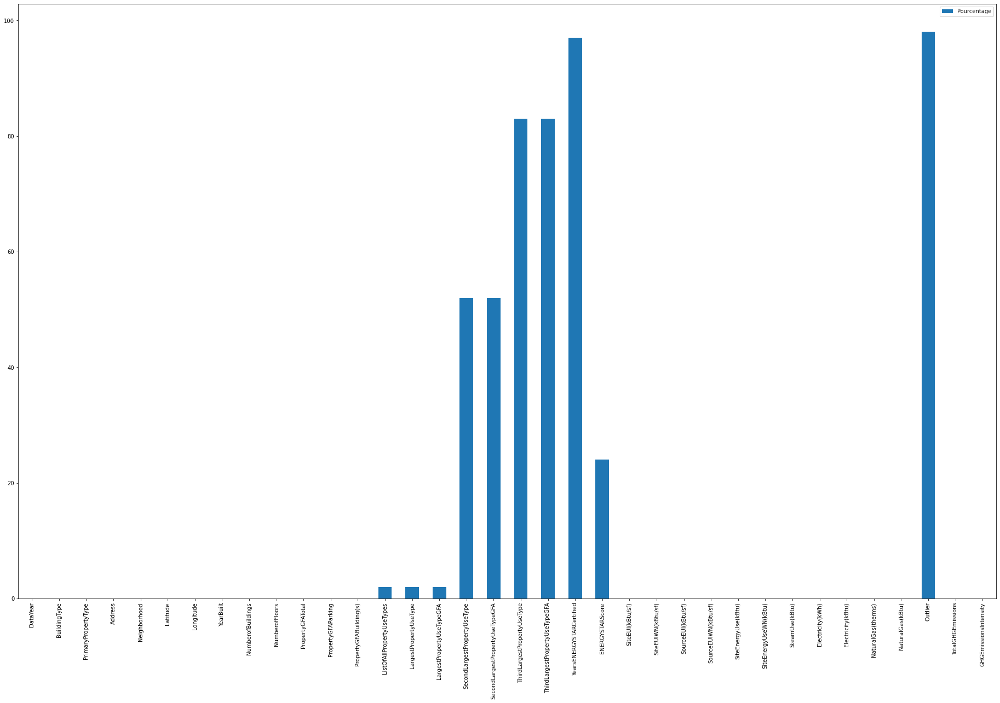

In [83]:
# Pourcentage de Valeurs Manquantes selon les différentes Variables :

plt.rcParams["figure.figsize"] = (32,20)
barchart = missing_df3.plot.bar(y='Pourcentage')

In [84]:
# Types de Variables Qualitatives et Quantitatives de la Dataframe Finale :

jugatsu.dtypes

DataYear                           int64  
BuildingType                       object 
PrimaryPropertyType                object 
Address                            object 
Neighborhood                       object 
Latitude                           float32
Longitude                          float32
YearBuilt                          int64  
NumberofBuildings                  int64  
NumberofFloors                     int64  
PropertyGFATotal                   int64  
PropertyGFAParking                 int64  
PropertyGFABuilding(s)             int64  
ListOfAllPropertyUseTypes          object 
LargestPropertyUseType             object 
LargestPropertyUseTypeGFA          float64
SecondLargestPropertyUseType       object 
SecondLargestPropertyUseTypeGFA    float64
ThirdLargestPropertyUseType        object 
ThirdLargestPropertyUseTypeGFA     float64
YearsENERGYSTARCertified           object 
ENERGYSTARScore                    float64
SiteEUI(kBtu/sf)                   float64
SiteEUIWN(k

In [85]:
# Quantification des Valeurs Dupliquées de la Dataframe Finale :

jugatsu.duplicated().sum()

0

<AxesSubplot:>

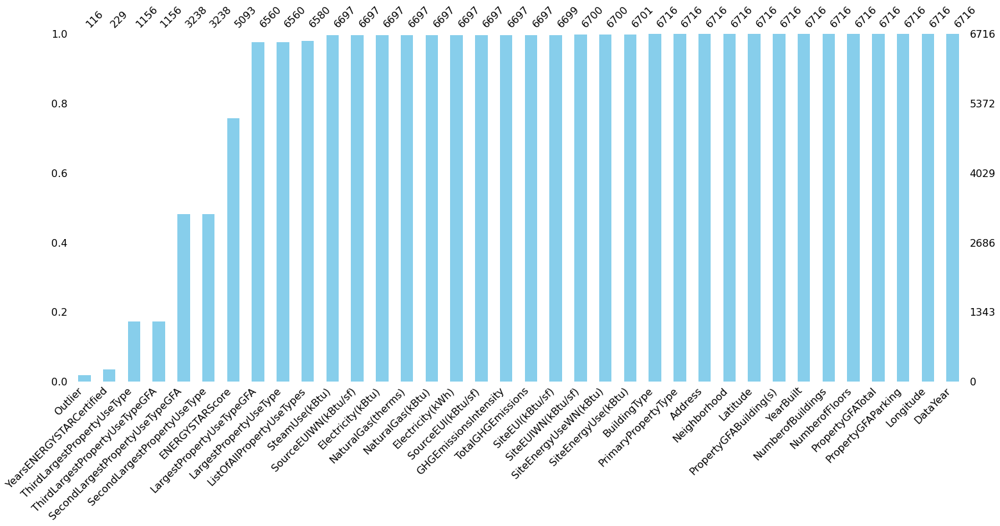

In [86]:
# Matrice de Remplissage des NaN de la Dataframe Finale :

msno.bar(jugatsu, sort = "ascending", color = "skyblue")

<AxesSubplot:>

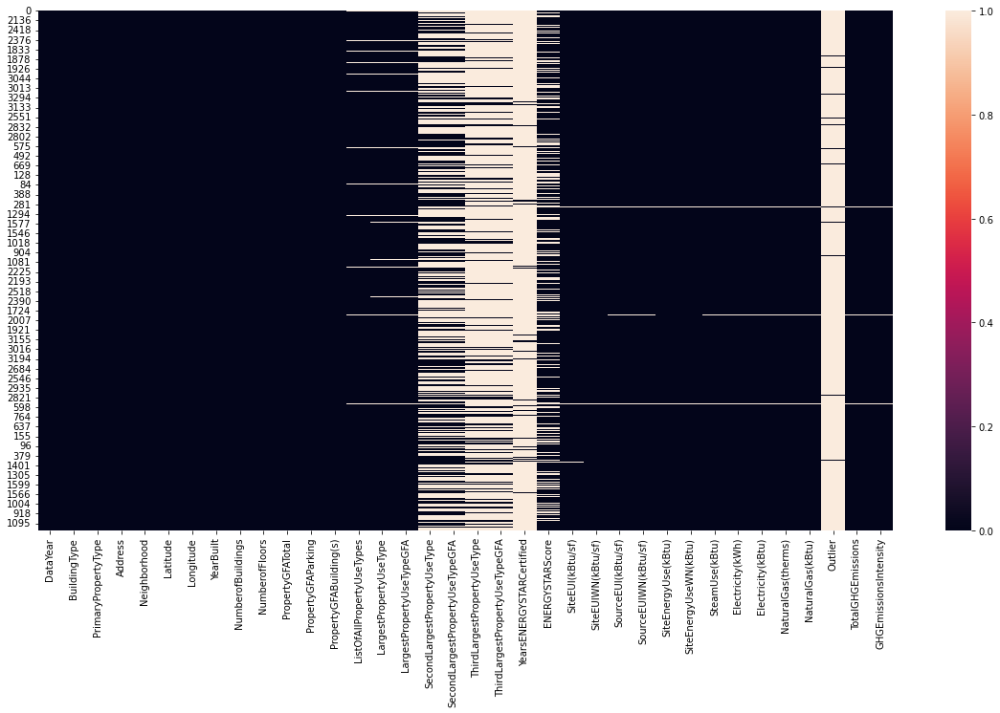

In [87]:
# Heatmap de Valeurs Manquantes de la Dataframe Finale :

fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(jugatsu.isnull())

# OUTLIERS

In [88]:
# Variable Outliers :

jugatsu = jugatsu[jugatsu['Outlier'].isnull()] 
jugatsu2 = jugatsu.drop(['Outlier', 'YearsENERGYSTARCertified'], axis=1)
jugatsu2.head(3)

,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,2015,NonResidential,Hotel,405 Olive Way,Downtown,47.612190,-122.337997,1927,1,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,249.43,2.64
2220,2015,Multifamily LR (1-4),Senior Care Community,1802 17Th Ave,Central,47.618053,-122.309799,1988,1,4,63998,0,63998,"Parking, Senior Care Community",Senior Care Community,63998.0,Parking,0.0,NaN,NaN,47.0,64.2,69.7,117.3,122.1,4107827.0,4458992.0,0.0,447664.0,1527492.0,25804.0,2580398.0,147.69,2.21
2221,2015,Multifamily LR (1-4),Low-Rise Multifamily,1720 E Denny Way,Central,47.618725,-122.309219,1920,1,3,24084,0,24084,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.0,26.3,30.4,62.2,73.7,632932.0,732772.0,0.0,116739.0,398331.0,2346.0,234618.0,15.24,0.56


In [89]:
# Filtrage à 90 % de nos données :

filled_rate = 0.90
filtered_rows=[]
jugatsu2 = jugatsu2[jugatsu2.count(axis='columns')/jugatsu2.shape[1]>filled_rate].reset_index(drop=True)
jugatsu2

,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,2015,Multifamily LR (1-4),Senior Care Community,1802 17Th Ave,Central,47.618053,-122.309799,1988,1,4,63998,0,63998,"Parking, Senior Care Community",Senior Care Community,63998.0,Parking,0.0,NaN,NaN,47.0,64.200000,69.700000,117.300000,122.100000,4107827.00,4458992.000,0.0,447664.0000,1.527492e+06,25804.000000,2.580398e+06,147.69,2.21
1,2015,Multifamily MR (5-9),Mid-Rise Multifamily,2201 E Madison St,Central,47.617958,-122.302879,2004,1,6,439604,156997,282607,"Multifamily Housing, Other",Multifamily Housing,186618.0,Other,53952.0,NaN,NaN,99.0,24.500000,25.900000,53.300000,55.800000,5903033.00,6234057.000,0.0,928689.0000,3.168818e+06,27343.000000,2.734346e+06,167.31,0.35
2,2015,NonResidential,Self-Storage Facility\n,1120 12Th Ave,Central,47.612465,-122.316299,1962,1,1,24248,0,24248,"Parking, Self-Storage Facility",Self-Storage Facility,21018.0,Parking,3230.0,NaN,NaN,NaN,5.200000,6.000000,16.200000,18.900000,108795.00,126687.000,0.0,31727.0000,1.082580e+05,5.000000,5.420000e+02,0.78,0.01
3,2015,Multifamily LR (1-4),Low-Rise Multifamily,12027 15Th Ave Ne,North,47.716427,-122.312920,1980,1,4,33034,0,33034,"Multifamily Housing, Parking",Multifamily Housing,30824.0,Parking,1114.0,NaN,NaN,94.0,20.100000,22.500000,63.100000,70.800000,619847.00,694579.000,0.0,181667.0000,6.198730e+05,0.000000,0.000000e+00,4.32,0.05
4,2015,NonResidential,Other,210 S Hudson St,Greater Duwamish,47.558918,-122.331558,2009,1,3,127065,84710,42355,"Office, Parking",Parking,84710.0,Office,42355.0,NaN,NaN,NaN,77.800000,83.500000,244.100000,262.200000,3293119.00,3537439.000,0.0,965158.0000,3.293256e+06,0.000000,0.000000e+00,22.96,0.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,2016,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,1982,1,2,40029,0,40029,"Non-Refrigerated Warehouse, Office",Office,31800.0,Non-Refrigerated Warehouse,8200.0,NaN,NaN,69.0,36.799999,39.400002,115.500000,123.699997,1471914.25,1575328.250,0.0,431393.4063,1.471914e+06,0.000000,0.000000e+00,10.26,0.26
3172,2016,NonResidential,Other,670 South Orcas Street,Greater Duwamish,47.551682,-122.324593,1970,1,1,26400,0,26400,"Non-Refrigerated Warehouse, Other - Recreation",Other - Recreation,20560.0,Non-Refrigerated Warehouse,7200.0,NaN,NaN,NaN,16.299999,16.299999,51.200001,51.200001,452612.50,452612.500,0.0,132653.0938,4.526120e+05,0.000000,0.000000e+00,3.16,0.12
3173,2016,NonResidential,Warehouse,707 S Orcas St,Greater Duwamish,47.550491,-122.323822,1968,1,1,27680,0,27680,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,25000.0,Office,2680.0,NaN,NaN,NaN,64.199997,69.300003,116.000000,121.300003,1778431.75,1918665.750,0.0,188282.4063,6.424200e+05,11360.120120,1.136012e+06,64.81,2.34
3174,2016,NonResidential,Small- and Mid-Sized Office,5700 Sixth Avenue South,Greater Duwamish,47.551449,-122.326347,1969,1,2,25872,0,25872,"Non-Refrigerated Warehouse, Office",Office,23272.0,Non-Refrigerated Warehouse,2600.0,NaN,NaN,NaN,69.099998,71.699997,158.500000,162.300003,1787119.00,1853911.875,0.0,312053.0000,1.064725e+06,7223.940430,7.223940e+05,45.79,1.77


In [90]:
# Localisation des Valeurs Négatives ou Nulles pour certaines Variables Quantitatives  :

quantitative_columns = ['PropertyGFATotal', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)','SiteEUI(kBtu/sf)', 'TotalGHGEmissions', 'GHGEmissionsIntensity']
for column in quantitative_columns:
    incoherent_values = jugatsu2[jugatsu2[column] <=0]
    if(incoherent_values.shape[0]>0):
        print(column)
        display(incoherent_values)
        jugatsu2.drop(incoherent_values.index)

SourceEUI(kBtu/sf)


,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
746,2015,NonResidential,Large Office,1218 3Rd Ave,Downtown,47.607655,-122.335510,1929,1,27,216571,13320,203251,"Office, Other - Technology/Science, Parking",Office,182604.0,Parking,13320.0,Other - Technology/Science,6246.0,NaN,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.00,0.00
976,2015,NonResidential,Retail Store,1525 4Th Ave,Downtown,47.610764,-122.337677,1920,1,2,57428,0,57428,"Non-Refrigerated Warehouse, Other, Retail Store",Retail Store,34617.0,Non-Refrigerated Warehouse,13028.0,Other,9783.0,NaN,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.00,0.00
1727,2016,Multifamily LR (1-4),Senior Care Community,(Id23682) 3204 Sw Morgan St,Delridge,47.545422,-122.373398,2008,1,3,144682,0,144682,"Restaurant, Senior Care Community",Senior Care Community,120513.0,Restaurant,24169.0,NaN,NaN,96.0,35.400002,36.900002,0.0,0.0,5121586.0,5333731.0,0.0,1.055629e+06,3601807.0,0.0,0.0,25.11,0.17
2274,2016,NonResidential,Mixed Use Property,657 South Weller Street,Downtown,47.597370,-122.324867,1909,1,3,49299,0,49299,"Multifamily Housing, Office, Restaurant",Office,24099.0,Multifamily Housing,23632.0,Restaurant,5320.0,NaN,89.199997,90.900002,0.0,0.0,4729846.5,4821852.0,0.0,3.879813e+05,1323792.0,0.0,0.0,9.23,0.19
2430,2016,Multifamily MR (5-9),Mid-Rise Multifamily,721 S. Lane St.,Downtown,47.596249,-122.322830,2002,1,5,228288,32295,195993,"Library, Multifamily Housing, Office, Other - Entertainment/Public Assembly, Parking, Restaurant",Multifamily Housing,80298.0,Parking,29050.0,Other - Entertainment/Public Assembly,16116.0,NaN,55.599998,58.500000,0.0,0.0,5974993.5,6284895.5,0.0,5.764793e+05,1966947.0,0.0,0.0,13.71,0.06
2442,2016,NonResidential,Supermarket / Grocery Store,2001 15Th Avenue West,Magnolia / Queen Anne,47.637180,-122.377342,2008,1,1,57176,0,57176,"Personal Services (Health/Beauty, Dry Cleaning, etc), Retail Store, Supermarket/Grocery Store",Supermarket/Grocery Store,39500.0,Retail Store,15000.0,"Personal Services (Health/Beauty, Dry Cleaning, etc)",5500.0,31.0,208.800003,214.100006,0.0,0.0,12525174.0,12843856.0,0.0,0.000000e+00,0.0,0.0,0.0,0.00,0.00
2479,2016,Multifamily MR (5-9),Mid-Rise Multifamily,526 Yale Avenue N,Lake Union,47.624062,-122.330269,1994,1,7,86525,23866,62659,"Multifamily Housing, Parking",Multifamily Housing,62659.0,Parking,23866.0,NaN,NaN,84.0,37.000000,38.900002,0.0,0.0,2321336.0,2436266.5,0.0,5.509018e+05,1879677.0,0.0,0.0,13.10,0.15
2481,2016,Multifamily LR (1-4),Other,2225 First Ave,Downtown,47.612942,-122.346382,1909,1,3,30700,0,30700,"Multifamily Housing, Other",Other,19034.0,Multifamily Housing,11666.0,NaN,NaN,NaN,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.00,0.00


SiteEnergyUse(kBtu)


,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
746,2015,NonResidential,Large Office,1218 3Rd Ave,Downtown,47.607655,-122.335510,1929,1,27,216571,13320,203251,"Office, Other - Technology/Science, Parking",Office,182604.0,Parking,13320.0,Other - Technology/Science,6246.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
976,2015,NonResidential,Retail Store,1525 4Th Ave,Downtown,47.610764,-122.337677,1920,1,2,57428,0,57428,"Non-Refrigerated Warehouse, Other, Retail Store",Retail Store,34617.0,Non-Refrigerated Warehouse,13028.0,Other,9783.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2481,2016,Multifamily LR (1-4),Other,2225 First Ave,Downtown,47.612942,-122.346382,1909,1,3,30700,0,30700,"Multifamily Housing, Other",Other,19034.0,Multifamily Housing,11666.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


SiteEUI(kBtu/sf)


,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
746,2015,NonResidential,Large Office,1218 3Rd Ave,Downtown,47.607655,-122.335510,1929,1,27,216571,13320,203251,"Office, Other - Technology/Science, Parking",Office,182604.0,Parking,13320.0,Other - Technology/Science,6246.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
976,2015,NonResidential,Retail Store,1525 4Th Ave,Downtown,47.610764,-122.337677,1920,1,2,57428,0,57428,"Non-Refrigerated Warehouse, Other, Retail Store",Retail Store,34617.0,Non-Refrigerated Warehouse,13028.0,Other,9783.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2481,2016,Multifamily LR (1-4),Other,2225 First Ave,Downtown,47.612942,-122.346382,1909,1,3,30700,0,30700,"Multifamily Housing, Other",Other,19034.0,Multifamily Housing,11666.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


TotalGHGEmissions


,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
746,2015,NonResidential,Large Office,1218 3Rd Ave,Downtown,47.607655,-122.335510,1929,1,27,216571,13320,203251,"Office, Other - Technology/Science, Parking",Office,182604.0,Parking,13320.0,Other - Technology/Science,6246.0,NaN,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
976,2015,NonResidential,Retail Store,1525 4Th Ave,Downtown,47.610764,-122.337677,1920,1,2,57428,0,57428,"Non-Refrigerated Warehouse, Other, Retail Store",Retail Store,34617.0,Non-Refrigerated Warehouse,13028.0,Other,9783.0,NaN,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2442,2016,NonResidential,Supermarket / Grocery Store,2001 15Th Avenue West,Magnolia / Queen Anne,47.637180,-122.377342,2008,1,1,57176,0,57176,"Personal Services (Health/Beauty, Dry Cleaning, etc), Retail Store, Supermarket/Grocery Store",Supermarket/Grocery Store,39500.0,Retail Store,15000.0,"Personal Services (Health/Beauty, Dry Cleaning, etc)",5500.0,31.0,208.800003,214.100006,0.0,0.0,12525174.0,12843856.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2481,2016,Multifamily LR (1-4),Other,2225 First Ave,Downtown,47.612942,-122.346382,1909,1,3,30700,0,30700,"Multifamily Housing, Other",Other,19034.0,Multifamily Housing,11666.0,NaN,NaN,NaN,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


GHGEmissionsIntensity


,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
17,2015,NonResidential,Other,1701 1St Ave S,Greater Duwamish,47.587875,-122.334579,1910,1,3,27690,0,27690,"Other, Parking",Other,24717.0,Parking,0.0,NaN,NaN,NaN,0.700000,0.700000,2.2,2.2,17150.0,17150.0,0.0,5026.0,17150.0,0.0,0.0,0.12,0.0
746,2015,NonResidential,Large Office,1218 3Rd Ave,Downtown,47.607655,-122.335510,1929,1,27,216571,13320,203251,"Office, Other - Technology/Science, Parking",Office,182604.0,Parking,13320.0,Other - Technology/Science,6246.0,NaN,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
976,2015,NonResidential,Retail Store,1525 4Th Ave,Downtown,47.610764,-122.337677,1920,1,2,57428,0,57428,"Non-Refrigerated Warehouse, Other, Retail Store",Retail Store,34617.0,Non-Refrigerated Warehouse,13028.0,Other,9783.0,NaN,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
2442,2016,NonResidential,Supermarket / Grocery Store,2001 15Th Avenue West,Magnolia / Queen Anne,47.637180,-122.377342,2008,1,1,57176,0,57176,"Personal Services (Health/Beauty, Dry Cleaning, etc), Retail Store, Supermarket/Grocery Store",Supermarket/Grocery Store,39500.0,Retail Store,15000.0,"Personal Services (Health/Beauty, Dry Cleaning, etc)",5500.0,31.0,208.800003,214.100006,0.0,0.0,12525174.0,12843856.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
2481,2016,Multifamily LR (1-4),Other,2225 First Ave,Downtown,47.612942,-122.346382,1909,1,3,30700,0,30700,"Multifamily Housing, Other",Other,19034.0,Multifamily Housing,11666.0,NaN,NaN,NaN,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0


In [91]:
# Suppression de Valeurs Négatives :

jugatsu2.drop(jugatsu2[jugatsu2['PropertyGFATotal'] <= 0].index, inplace = True)
jugatsu2.drop(jugatsu2[jugatsu2['SourceEUI(kBtu/sf)'] <= 0].index, inplace = True)
jugatsu2.drop(jugatsu2[jugatsu2['SiteEnergyUse(kBtu)'] <= 0].index, inplace = True)
jugatsu2.drop(jugatsu2[jugatsu2['SiteEUI(kBtu/sf)'] <= 0].index, inplace = True)
jugatsu2.drop(jugatsu2[jugatsu2['TotalGHGEmissions'] <= 0].index, inplace = True)
jugatsu2.drop(jugatsu2[jugatsu2['GHGEmissionsIntensity'] <= 0].index, inplace = True)

In [92]:
# Présentation des premières lignes de la dataframe finale : 

jugatsu2

,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,2015,Multifamily LR (1-4),Senior Care Community,1802 17Th Ave,Central,47.618053,-122.309799,1988,1,4,63998,0,63998,"Parking, Senior Care Community",Senior Care Community,63998.0,Parking,0.0,NaN,NaN,47.0,64.200000,69.700000,117.300000,122.100000,4107827.00,4458992.000,0.0,447664.0000,1.527492e+06,25804.000000,2.580398e+06,147.69,2.21
1,2015,Multifamily MR (5-9),Mid-Rise Multifamily,2201 E Madison St,Central,47.617958,-122.302879,2004,1,6,439604,156997,282607,"Multifamily Housing, Other",Multifamily Housing,186618.0,Other,53952.0,NaN,NaN,99.0,24.500000,25.900000,53.300000,55.800000,5903033.00,6234057.000,0.0,928689.0000,3.168818e+06,27343.000000,2.734346e+06,167.31,0.35
2,2015,NonResidential,Self-Storage Facility\n,1120 12Th Ave,Central,47.612465,-122.316299,1962,1,1,24248,0,24248,"Parking, Self-Storage Facility",Self-Storage Facility,21018.0,Parking,3230.0,NaN,NaN,NaN,5.200000,6.000000,16.200000,18.900000,108795.00,126687.000,0.0,31727.0000,1.082580e+05,5.000000,5.420000e+02,0.78,0.01
3,2015,Multifamily LR (1-4),Low-Rise Multifamily,12027 15Th Ave Ne,North,47.716427,-122.312920,1980,1,4,33034,0,33034,"Multifamily Housing, Parking",Multifamily Housing,30824.0,Parking,1114.0,NaN,NaN,94.0,20.100000,22.500000,63.100000,70.800000,619847.00,694579.000,0.0,181667.0000,6.198730e+05,0.000000,0.000000e+00,4.32,0.05
4,2015,NonResidential,Other,210 S Hudson St,Greater Duwamish,47.558918,-122.331558,2009,1,3,127065,84710,42355,"Office, Parking",Parking,84710.0,Office,42355.0,NaN,NaN,NaN,77.800000,83.500000,244.100000,262.200000,3293119.00,3537439.000,0.0,965158.0000,3.293256e+06,0.000000,0.000000e+00,22.96,0.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,2016,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,1982,1,2,40029,0,40029,"Non-Refrigerated Warehouse, Office",Office,31800.0,Non-Refrigerated Warehouse,8200.0,NaN,NaN,69.0,36.799999,39.400002,115.500000,123.699997,1471914.25,1575328.250,0.0,431393.4063,1.471914e+06,0.000000,0.000000e+00,10.26,0.26
3172,2016,NonResidential,Other,670 South Orcas Street,Greater Duwamish,47.551682,-122.324593,1970,1,1,26400,0,26400,"Non-Refrigerated Warehouse, Other - Recreation",Other - Recreation,20560.0,Non-Refrigerated Warehouse,7200.0,NaN,NaN,NaN,16.299999,16.299999,51.200001,51.200001,452612.50,452612.500,0.0,132653.0938,4.526120e+05,0.000000,0.000000e+00,3.16,0.12
3173,2016,NonResidential,Warehouse,707 S Orcas St,Greater Duwamish,47.550491,-122.323822,1968,1,1,27680,0,27680,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,25000.0,Office,2680.0,NaN,NaN,NaN,64.199997,69.300003,116.000000,121.300003,1778431.75,1918665.750,0.0,188282.4063,6.424200e+05,11360.120120,1.136012e+06,64.81,2.34
3174,2016,NonResidential,Small- and Mid-Sized Office,5700 Sixth Avenue South,Greater Duwamish,47.551449,-122.326347,1969,1,2,25872,0,25872,"Non-Refrigerated Warehouse, Office",Office,23272.0,Non-Refrigerated Warehouse,2600.0,NaN,NaN,NaN,69.099998,71.699997,158.500000,162.300003,1787119.00,1853911.875,0.0,312053.0000,1.064725e+06,7223.940430,7.223940e+05,45.79,1.77


# Type de Bâtiments à choisir :

In [93]:
# Listage des Type des Bâtiments :

jugatsu2['BuildingType'].unique()

array(['Multifamily LR (1-4)', 'Multifamily MR (5-9)', 'NonResidential',
       'Nonresidential COS', 'Campus', 'Multifamily HR (10+)',
       'SPS-District K-12'], dtype=object)

In [94]:
# Type des Bâtiments :

building_types = sorted(jugatsu2['BuildingType'].unique())
primary_property_types = sorted(jugatsu2['PrimaryPropertyType'].unique())

In [95]:
# Visualisation des Types de Bâtiments :

building_types

['Campus',
 'Multifamily HR (10+)',
 'Multifamily LR (1-4)',
 'Multifamily MR (5-9)',
 'NonResidential',
 'Nonresidential COS',
 'SPS-District K-12']

In [96]:
# Nombre de Types de Bâtiments :

len(building_types)

7

In [97]:
# Visualisation des Types de Bâtiments :

primary_property_types

['College/University',
 'Distribution Center',
 'Distribution Center\n',
 'High-Rise Multifamily',
 'Hospital',
 'Hotel',
 'K-12 School',
 'Laboratory',
 'Large Office',
 'Low-Rise Multifamily',
 'Medical Office',
 'Mid-Rise Multifamily',
 'Mixed Use Property',
 'Non-Refrigerated Warehouse',
 'Other',
 'Refrigerated Warehouse',
 'Residence Hall',
 'Residence Hall/Dormitory',
 'Restaurant',
 'Restaurant\n',
 'Retail Store',
 'Self-Storage Facility',
 'Self-Storage Facility\n',
 'Senior Care Community',
 'Small- and Mid-Sized Office',
 'Supermarket / Grocery Store',
 'Supermarket/Grocery Store',
 'University',
 'Warehouse',
 'Worship Facility']

In [98]:
# Nombre de Types de Bâtiments :

len(primary_property_types)

30

In [99]:
# Suppression des Doublons :

import re
jugatsu2['PrimaryPropertyType'] = [re.compile(r'[\n\r\t]').sub("", item) for index, item in jugatsu2.PrimaryPropertyType.iteritems()]
jugatsu2['PrimaryPropertyType'] = [re.compile(r' / ').sub("/", item) for index, item in jugatsu2.PrimaryPropertyType.iteritems()]

In [100]:
# Présentation "Building_Type" après suppression des Doublons :

building_types = sorted(jugatsu2['BuildingType'].unique())
building_types

['Campus',
 'Multifamily HR (10+)',
 'Multifamily LR (1-4)',
 'Multifamily MR (5-9)',
 'NonResidential',
 'Nonresidential COS',
 'SPS-District K-12']

In [101]:
# Présentation "Primary_Property_Type" après suppression des Doublons :

primary_property_types = sorted(jugatsu2['PrimaryPropertyType'].unique())
primary_property_types

['College/University',
 'Distribution Center',
 'High-Rise Multifamily',
 'Hospital',
 'Hotel',
 'K-12 School',
 'Laboratory',
 'Large Office',
 'Low-Rise Multifamily',
 'Medical Office',
 'Mid-Rise Multifamily',
 'Mixed Use Property',
 'Non-Refrigerated Warehouse',
 'Other',
 'Refrigerated Warehouse',
 'Residence Hall',
 'Residence Hall/Dormitory',
 'Restaurant',
 'Retail Store',
 'Self-Storage Facility',
 'Senior Care Community',
 'Small- and Mid-Sized Office',
 'Supermarket/Grocery Store',
 'University',
 'Warehouse',
 'Worship Facility']

In [102]:
# Elimination de la Catégorie "Multifamily" :

jugatsu3= jugatsu2[~jugatsu2['BuildingType'].str.contains("Multifamily") & ~jugatsu2['PrimaryPropertyType'].str.contains("Multifamily")]
jugatsu3

,DataYear,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
2,2015,NonResidential,Self-Storage Facility,1120 12Th Ave,Central,47.612465,-122.316299,1962,1,1,24248,0,24248,"Parking, Self-Storage Facility",Self-Storage Facility,21018.0,Parking,3230.0,NaN,NaN,NaN,5.200000,6.000000,16.200000,18.900000,108795.00,126687.000,0.0,31727.0000,1.082580e+05,5.000000,5.420000e+02,0.78,0.01
4,2015,NonResidential,Other,210 S Hudson St,Greater Duwamish,47.558918,-122.331558,2009,1,3,127065,84710,42355,"Office, Parking",Parking,84710.0,Office,42355.0,NaN,NaN,NaN,77.800000,83.500000,244.100000,262.200000,3293119.00,3537439.000,0.0,965158.0000,3.293256e+06,0.000000,0.000000e+00,22.96,0.07
6,2015,NonResidential,Small- and Mid-Sized Office,1943 1St Ave S,Greater Duwamish,47.584621,-122.334702,1910,1,3,49052,0,49052,"Office, Retail Store",Office,32393.0,Retail Store,10057.0,NaN,NaN,90.0,43.900000,42.000000,137.800000,132.000000,1863468.00,1784423.000,0.0,546151.0000,1.863545e+06,0.000000,0.000000e+00,12.99,0.10
7,2015,NonResidential,Small- and Mid-Sized Office,66 S Hanford St,Greater Duwamish,47.575943,-122.336243,1937,1,2,39036,0,39036,"Office, Other",Office,27636.0,Other,13611.0,NaN,NaN,NaN,34.900000,39.600000,81.400000,86.400000,1437569.00,1633213.000,0.0,259224.0000,8.845090e+05,5531.000000,5.530970e+05,35.54,0.81
8,2015,NonResidential,Small- and Mid-Sized Office,3201 1St Ave S,Greater Duwamish,47.575264,-122.334724,1923,1,1,26310,0,26310,"Non-Refrigerated Warehouse, Office, Social/Meeting Hall",Office,24000.0,Non-Refrigerated Warehouse,8874.0,Social/Meeting Hall,1000.0,93.0,22.600000,22.600000,62.700000,62.700000,764906.00,764906.000,0.0,185143.0000,6.317330e+05,1332.000000,1.331990e+05,11.48,0.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,2016,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,1982,1,2,40029,0,40029,"Non-Refrigerated Warehouse, Office",Office,31800.0,Non-Refrigerated Warehouse,8200.0,NaN,NaN,69.0,36.799999,39.400002,115.500000,123.699997,1471914.25,1575328.250,0.0,431393.4063,1.471914e+06,0.000000,0.000000e+00,10.26,0.26
3172,2016,NonResidential,Other,670 South Orcas Street,Greater Duwamish,47.551682,-122.324593,1970,1,1,26400,0,26400,"Non-Refrigerated Warehouse, Other - Recreation",Other - Recreation,20560.0,Non-Refrigerated Warehouse,7200.0,NaN,NaN,NaN,16.299999,16.299999,51.200001,51.200001,452612.50,452612.500,0.0,132653.0938,4.526120e+05,0.000000,0.000000e+00,3.16,0.12
3173,2016,NonResidential,Warehouse,707 S Orcas St,Greater Duwamish,47.550491,-122.323822,1968,1,1,27680,0,27680,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,25000.0,Office,2680.0,NaN,NaN,NaN,64.199997,69.300003,116.000000,121.300003,1778431.75,1918665.750,0.0,188282.4063,6.424200e+05,11360.120120,1.136012e+06,64.81,2.34
3174,2016,NonResidential,Small- and Mid-Sized Office,5700 Sixth Avenue South,Greater Duwamish,47.551449,-122.326347,1969,1,2,25872,0,25872,"Non-Refrigerated Warehouse, Office",Office,23272.0,Non-Refrigerated Warehouse,2600.0,NaN,NaN,NaN,69.099998,71.699997,158.500000,162.300003,1787119.00,1853911.875,0.0,312053.0000,1.064725e+06,7223.940430,7.223940e+05,45.79,1.77


In [103]:
# Préparation pour la représentation en "Pie" :

building_type_pie = jugatsu3.groupby(by='BuildingType')['PrimaryPropertyType'].nunique()
building_type_pie

BuildingType
Campus                7 
NonResidential        23
Nonresidential COS    8 
SPS-District K-12     2 
Name: PrimaryPropertyType, dtype: int64

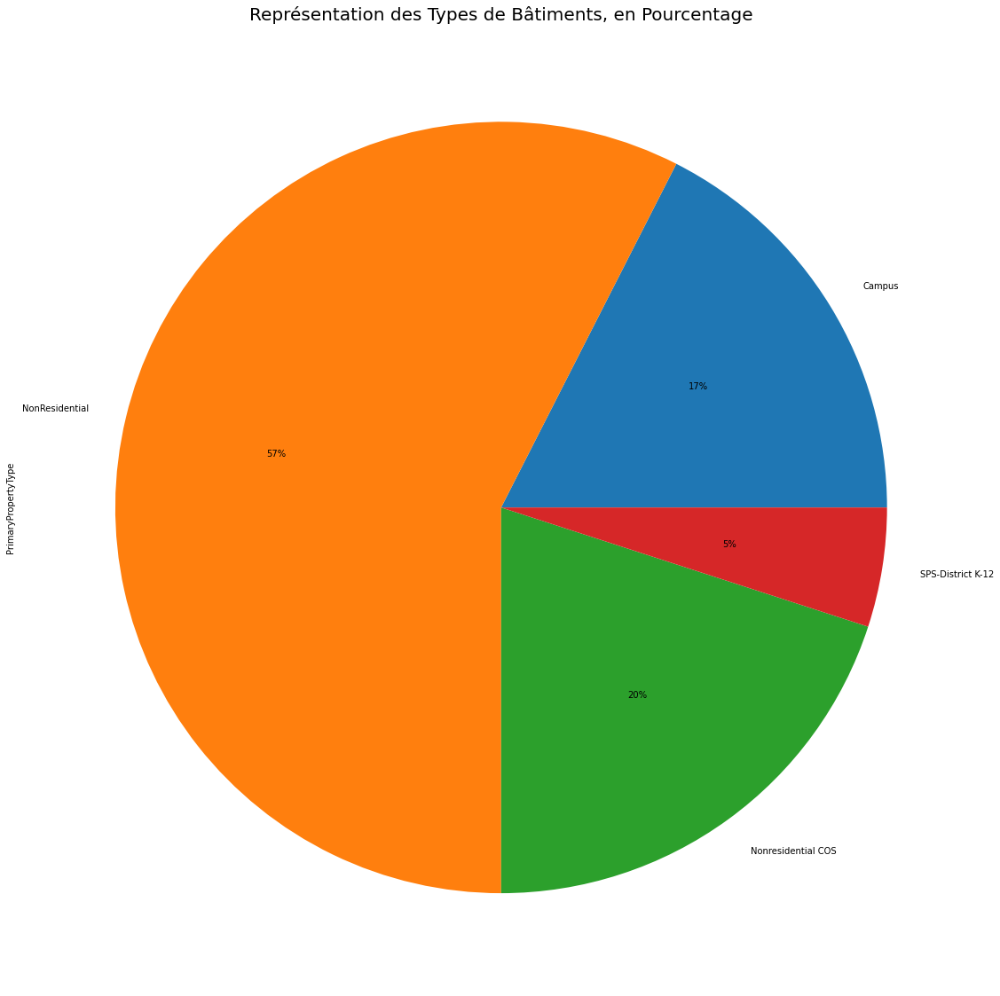

In [104]:
# Représentation des Types de Bâtiments, en Pourcentage :

building_type_pie.groupby(['BuildingType']).sum().plot(kind='pie', y='OSEBuildingID',autopct='%1.0f%%')
plt.title('Représentation des Types de Bâtiments, en Pourcentage', fontsize = 20)
plt.show()

In [105]:
# Visualisation de la Catégorie "NonResidential" :

jugatsu3.loc[(jugatsu3['BuildingType']=="NonResidential"),'PrimaryPropertyType'].value_counts()

Small- and Mid-Sized Office    334
Large Office                   280
Mixed Use Property             194
Other                          177
Warehouse                      79 
Non-Refrigerated Warehouse     78 
Retail Store                   68 
Hotel                          65 
Distribution Center            55 
Worship Facility               45 
Medical Office                 35 
Supermarket/Grocery Store      33 
Senior Care Community          21 
Refrigerated Warehouse         12 
Hospital                       10 
Restaurant                     9  
Self-Storage Facility          8  
Residence Hall                 6  
Laboratory                     5  
Residence Hall/Dormitory       4  
K-12 School                    3  
College/University             3  
University                     3  
Name: PrimaryPropertyType, dtype: int64

Text(0.5, 1.0, 'Distribution des Années de Construction des Bâtiments')

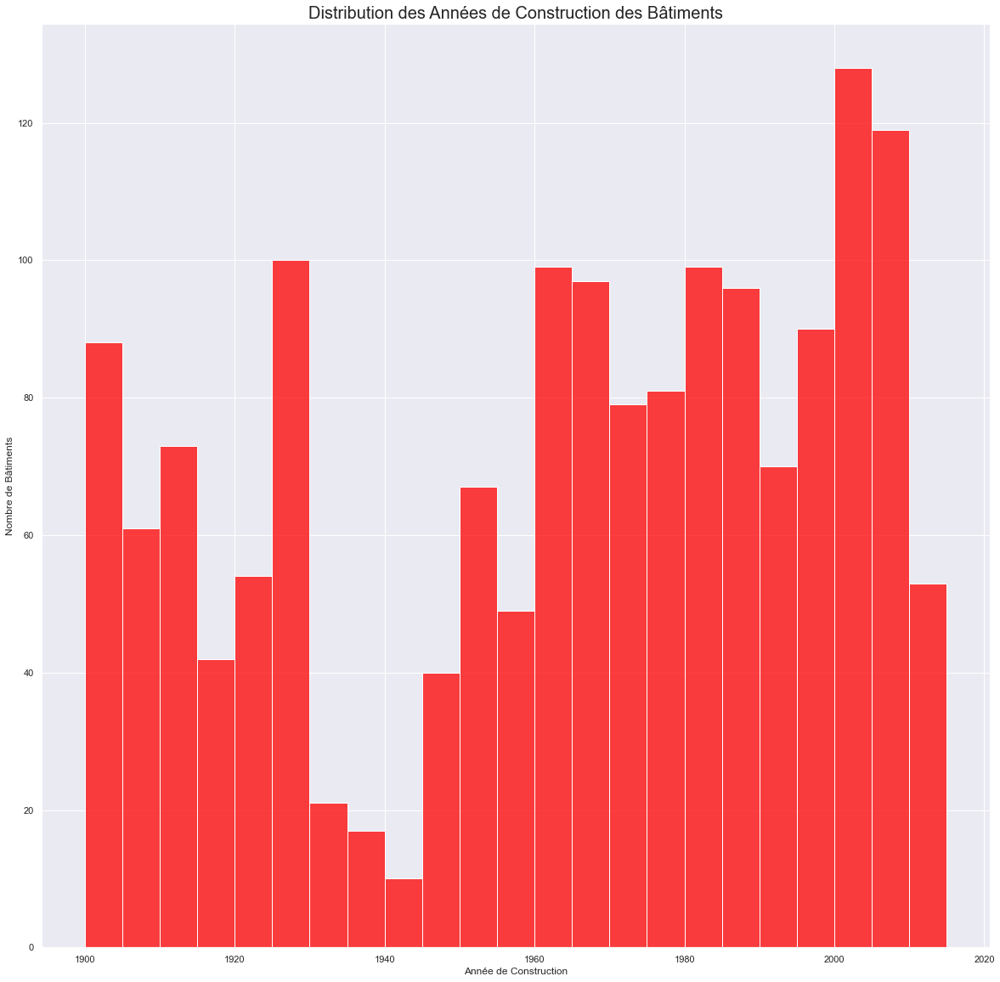

In [106]:
# Histogramme d'Années de Construction des Bâtiments : 

fig = plt.figure(figsize=(20,20))
sns.set_theme(style="darkgrid")
ax = sns.histplot(data=jugatsu3, x='YearBuilt', bins=int((jugatsu3.YearBuilt.max() - jugatsu3.YearBuilt.min())/5), color=['red'])
ax.set_xlabel("Année de Construction")
ax.set_ylabel("Nombre de Bâtiments")
plt.title(f"Distribution des Années de Construction des Bâtiments",fontsize = 20)

/var/folders/_5/v63wfks92ynb3p2nthszhh2m0000gn/T/ipykernel_38184/3710382989.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jugatsu3['BuildingAge'] = jugatsu3['DataYear'] - jugatsu3['YearBuilt']


<Figure size 1440x1440 with 0 Axes>

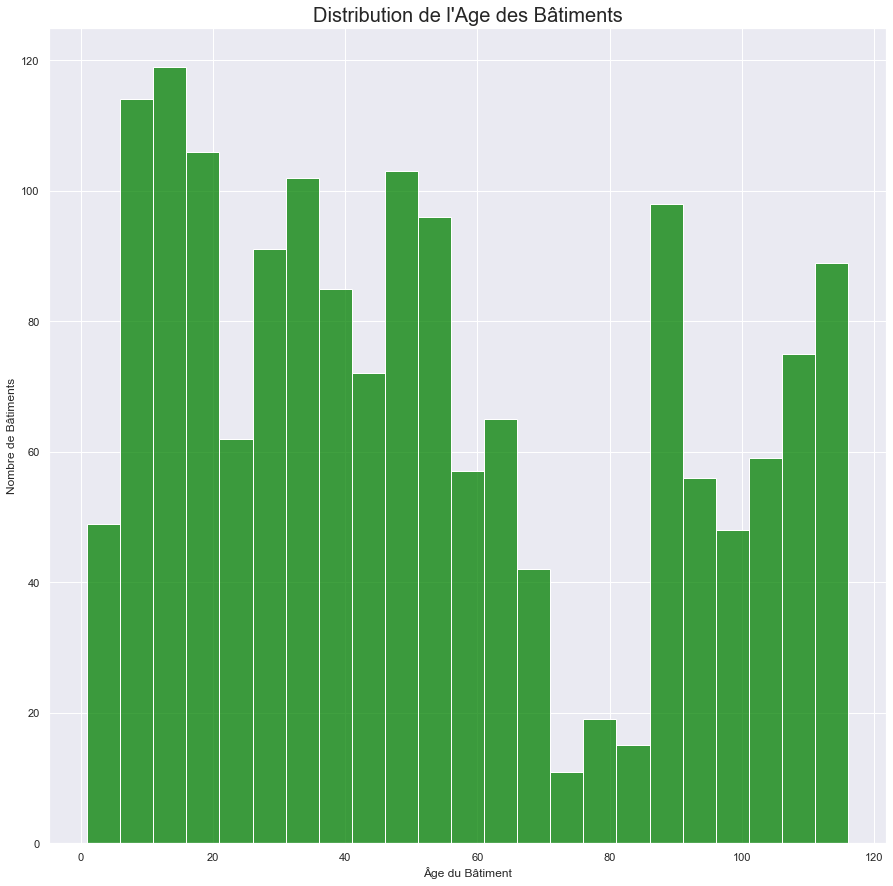

In [107]:
# Histogramme d'Âge des Bâtiments : 

fig = plt.figure(figsize=(20,20))
sns.set_theme(style="darkgrid")
jugatsu3['BuildingAge'] = jugatsu3['DataYear'] - jugatsu3['YearBuilt']
fig = plt.figure(figsize=(15,15))
ax = sns.histplot(data=jugatsu3, x='BuildingAge', bins=int((jugatsu3.BuildingAge.max() - jugatsu3.BuildingAge.min())/5),color=['green'])
ax.set_xlabel("Âge du Bâtiment")
ax.set_ylabel("Nombre de Bâtiments")
plt.title(f"Distribution de l'Age des Bâtiments", fontsize = 20)
plt.show()

In [108]:
# Effacement des NaN de la dataframe selon certaines variables :

jugatsu4 = jugatsu3.dropna(subset = ['SiteEnergyUseWN(kBtu)', 'SiteEUIWN(kBtu/sf)', 'SiteEUI(kBtu/sf)', 'NumberofFloors','LargestPropertyUseTypeGFA','LargestPropertyUseType'])
jugatsu4.shape

(1633, 35)

In [109]:
# Effacement des Colonnes Inutiles de la dataframe :

jugatsu5 = jugatsu4.drop(['Electricity(kWh)', 'NaturalGas(therms)'], axis=1)
jugatsu5.shape

(1633, 33)

In [110]:
# Création d'une colonne "BuildingAge" :

jugatsu5['BuildingAge'] = jugatsu5['DataYear'] - jugatsu5['YearBuilt']
jugatsu5[['BuildingAge','DataYear','YearBuilt']]

,BuildingAge,DataYear,YearBuilt
2,53,2015,1962
4,6,2015,2009
6,105,2015,1910
7,78,2015,1937
8,92,2015,1923
...,...,...,...
3171,34,2016,1982
3172,46,2016,1970
3173,48,2016,1968
3174,47,2016,1969


In [111]:
jugatsu5.columns.tolist()

['DataYear',
 'BuildingType',
 'PrimaryPropertyType',
 'Address',
 'Neighborhood',
 'Latitude',
 'Longitude',
 'YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kBtu)',
 'NaturalGas(kBtu)',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity',
 'BuildingAge']

In [112]:
# Visualisation du dataset :

jugatsu6 = jugatsu5.reindex(columns=['DataYear','YearBuilt','BuildingAge','BuildingType','PrimaryPropertyType','Address','Neighborhood','Latitude','Longitude','ENERGYSTARScore','ListOfAllPropertyUseTypes','PropertyGFATotal','PropertyGFAParking','PropertyGFABuilding(s)','LargestPropertyUseType','LargestPropertyUseTypeGFA','SecondLargestPropertyUseType','SecondLargestPropertyUseTypeGFA','ThirdLargestPropertyUseType','ThirdLargestPropertyUseTypeGFA','NumberofBuildings','NumberofFloors','SiteEnergyUse(kBtu)','SiteEnergyUseWN(kBtu)','TotalGHGEmissions','GHGEmissionsIntensity','SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(kBtu)'])
jugatsu6

,DataYear,YearBuilt,BuildingAge,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,ENERGYSTARScore,ListOfAllPropertyUseTypes,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,NumberofBuildings,NumberofFloors,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu)
2,2015,1962,53,NonResidential,Self-Storage Facility,1120 12Th Ave,Central,47.612465,-122.316299,NaN,"Parking, Self-Storage Facility",24248,0,24248,Self-Storage Facility,21018.0,Parking,3230.0,NaN,NaN,1,1,108795.00,126687.000,0.78,0.01,0.0,1.082580e+05,5.420000e+02
4,2015,2009,6,NonResidential,Other,210 S Hudson St,Greater Duwamish,47.558918,-122.331558,NaN,"Office, Parking",127065,84710,42355,Parking,84710.0,Office,42355.0,NaN,NaN,1,3,3293119.00,3537439.000,22.96,0.07,0.0,3.293256e+06,0.000000e+00
6,2015,1910,105,NonResidential,Small- and Mid-Sized Office,1943 1St Ave S,Greater Duwamish,47.584621,-122.334702,90.0,"Office, Retail Store",49052,0,49052,Office,32393.0,Retail Store,10057.0,NaN,NaN,1,3,1863468.00,1784423.000,12.99,0.10,0.0,1.863545e+06,0.000000e+00
7,2015,1937,78,NonResidential,Small- and Mid-Sized Office,66 S Hanford St,Greater Duwamish,47.575943,-122.336243,NaN,"Office, Other",39036,0,39036,Office,27636.0,Other,13611.0,NaN,NaN,1,2,1437569.00,1633213.000,35.54,0.81,0.0,8.845090e+05,5.530970e+05
8,2015,1923,92,NonResidential,Small- and Mid-Sized Office,3201 1St Ave S,Greater Duwamish,47.575264,-122.334724,93.0,"Non-Refrigerated Warehouse, Office, Social/Meeting Hall",26310,0,26310,Office,24000.0,Non-Refrigerated Warehouse,8874.0,Social/Meeting Hall,1000.0,1,1,764906.00,764906.000,11.48,0.33,0.0,6.317330e+05,1.331990e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,2016,1982,34,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,69.0,"Non-Refrigerated Warehouse, Office",40029,0,40029,Office,31800.0,Non-Refrigerated Warehouse,8200.0,NaN,NaN,1,2,1471914.25,1575328.250,10.26,0.26,0.0,1.471914e+06,0.000000e+00
3172,2016,1970,46,NonResidential,Other,670 South Orcas Street,Greater Duwamish,47.551682,-122.324593,NaN,"Non-Refrigerated Warehouse, Other - Recreation",26400,0,26400,Other - Recreation,20560.0,Non-Refrigerated Warehouse,7200.0,NaN,NaN,1,1,452612.50,452612.500,3.16,0.12,0.0,4.526120e+05,0.000000e+00
3173,2016,1968,48,NonResidential,Warehouse,707 S Orcas St,Greater Duwamish,47.550491,-122.323822,NaN,"Non-Refrigerated Warehouse, Office",27680,0,27680,Non-Refrigerated Warehouse,25000.0,Office,2680.0,NaN,NaN,1,1,1778431.75,1918665.750,64.81,2.34,0.0,6.424200e+05,1.136012e+06
3174,2016,1969,47,NonResidential,Small- and Mid-Sized Office,5700 Sixth Avenue South,Greater Duwamish,47.551449,-122.326347,NaN,"Non-Refrigerated Warehouse, Office",25872,0,25872,Office,23272.0,Non-Refrigerated Warehouse,2600.0,NaN,NaN,1,2,1787119.00,1853911.875,45.79,1.77,0.0,1.064725e+06,7.223940e+05


In [113]:
jugatsu6.columns.tolist()

['DataYear',
 'YearBuilt',
 'BuildingAge',
 'BuildingType',
 'PrimaryPropertyType',
 'Address',
 'Neighborhood',
 'Latitude',
 'Longitude',
 'ENERGYSTARScore',
 'ListOfAllPropertyUseTypes',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'NumberofBuildings',
 'NumberofFloors',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity',
 'SteamUse(kBtu)',
 'Electricity(kBtu)',
 'NaturalGas(kBtu)']

# VI ANALYSE UNIVARIEE :

# - BuildingType :

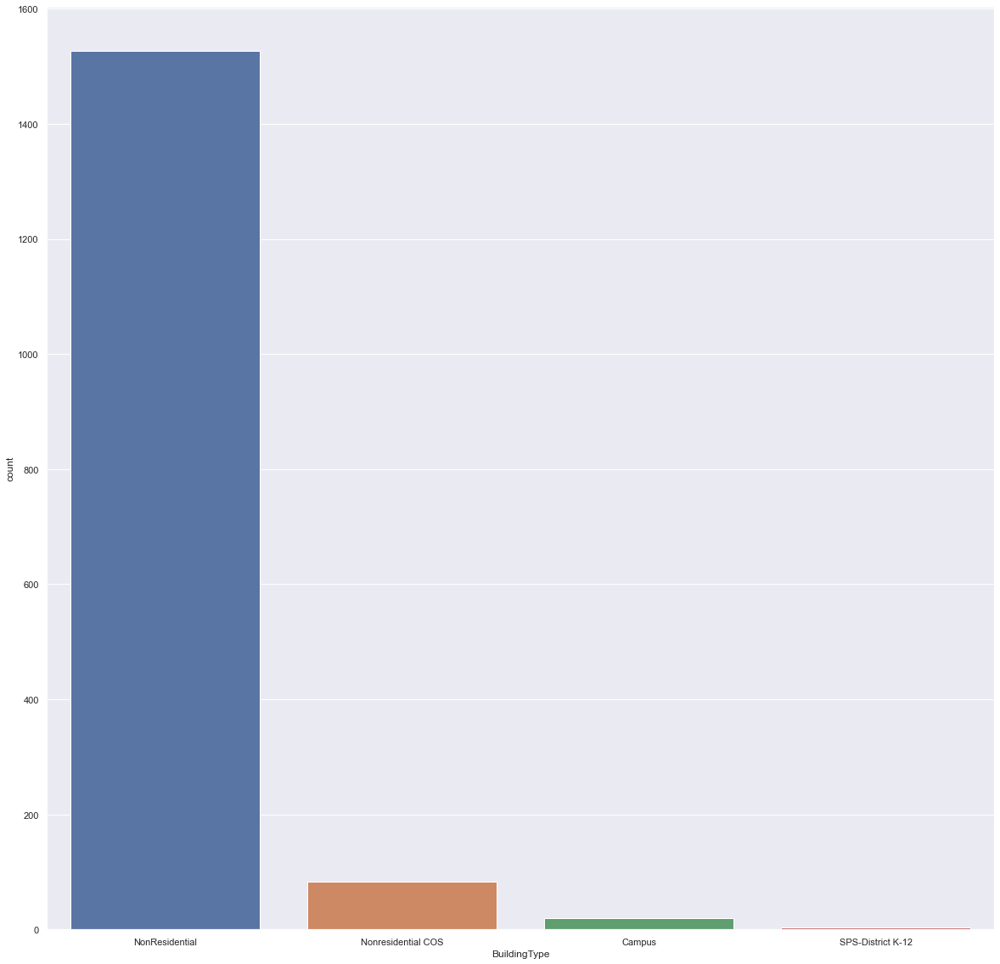

In [114]:
# Histogramme "BuildingType" :

sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,20))
ax = sns.countplot(x="BuildingType", data=jugatsu6)
plt.show()

# - LargestPropertyUseType :

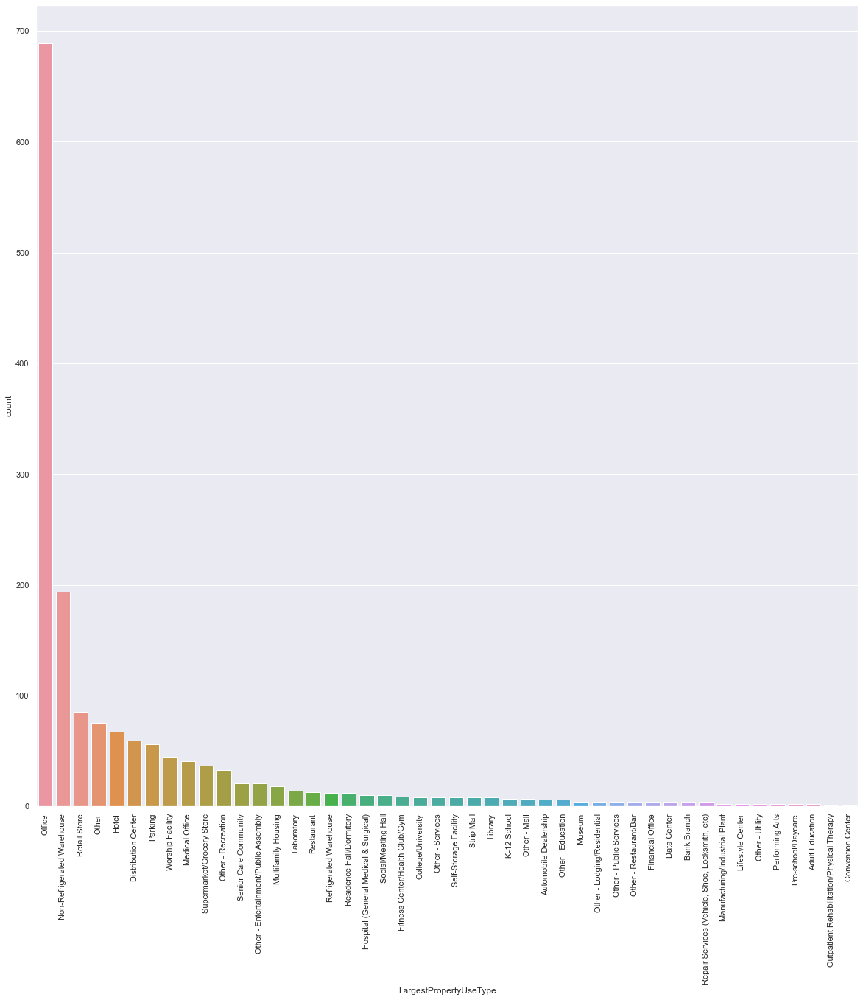

In [115]:
# Histogramme "LargestPropertyUseType" :

large_to_small = jugatsu6.groupby('LargestPropertyUseType').size().sort_values().index[::-1]
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,20))
ax = sns.countplot(x="LargestPropertyUseType", data=jugatsu6, order=large_to_small)
plt.xticks(rotation = 'vertical')
plt.show()

# - PrimaryPropertyType :

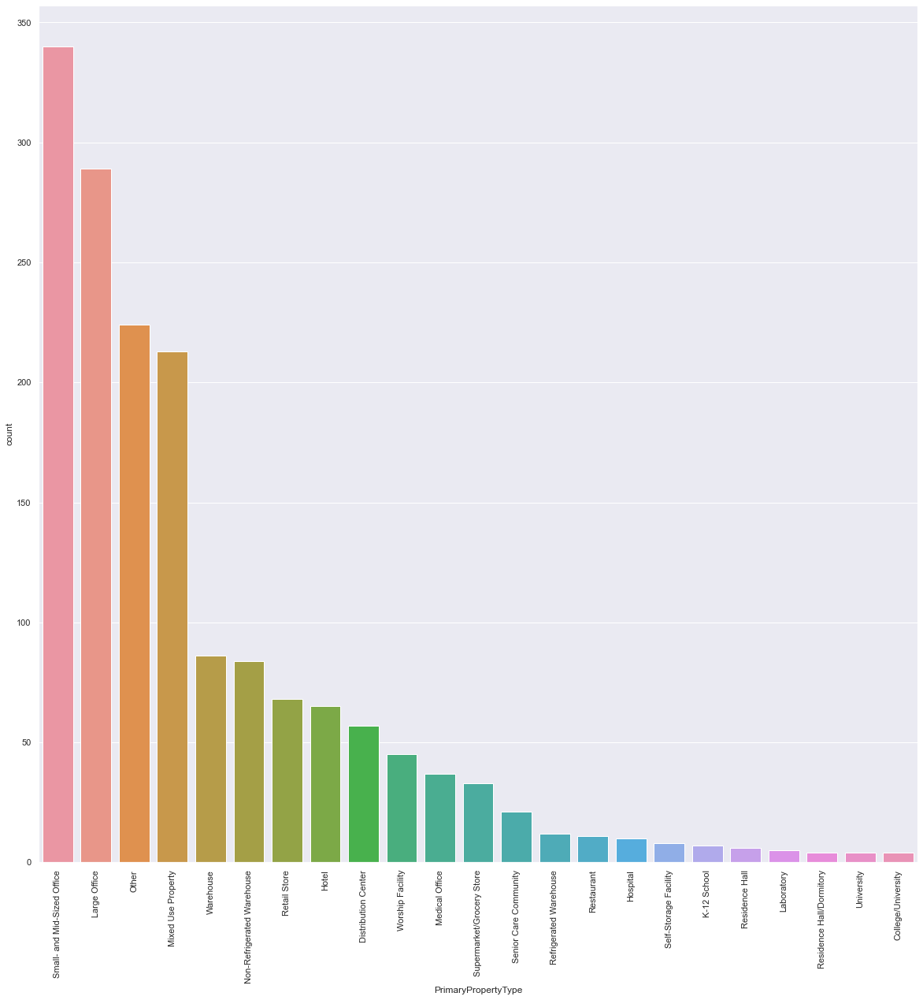

In [116]:
# Histogramme "PrimaryPropertyType" :

large_to_small = jugatsu6.groupby('PrimaryPropertyType').size().sort_values().index[::-1]
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,20))
ax = sns.countplot(x="PrimaryPropertyType", data=jugatsu6, order = large_to_small)
plt.xticks(rotation = 'vertical')
plt.show()

# - NumberofFloors :

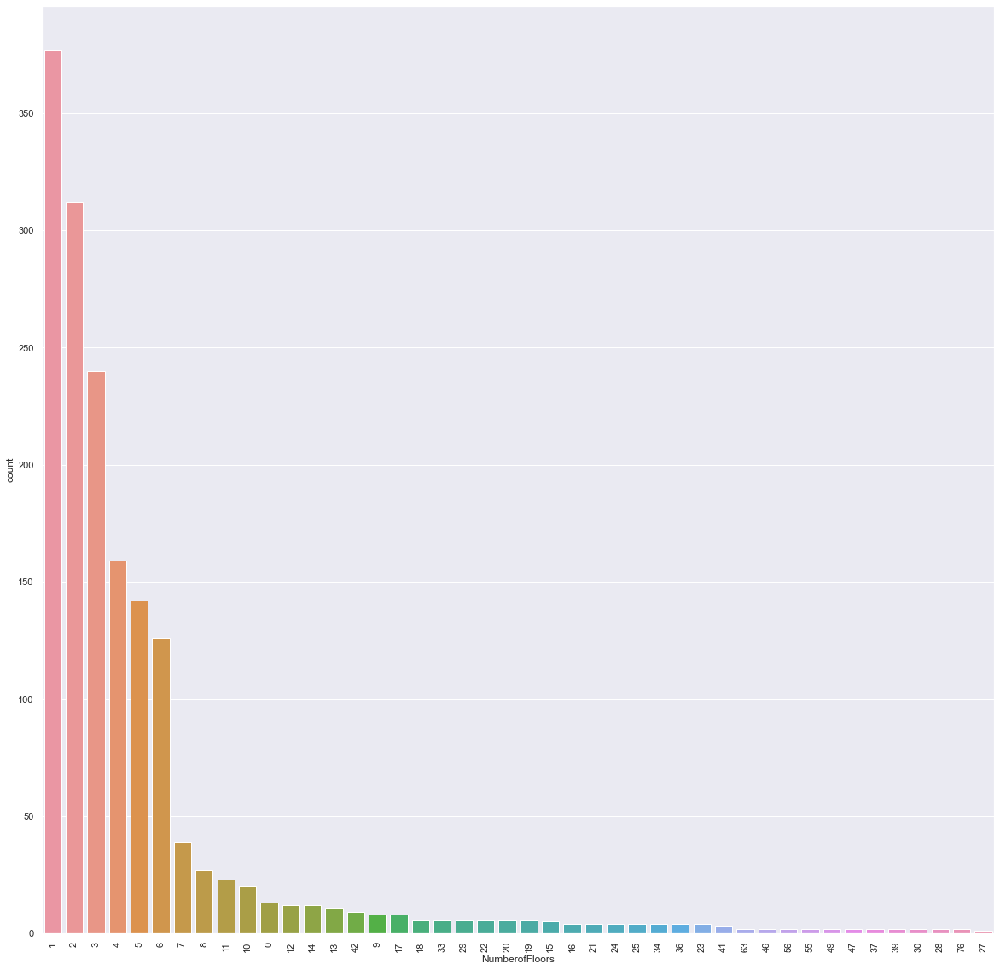

In [117]:
# Histogramme "NumberofFloors" :

large_to_small = jugatsu6.groupby('NumberofFloors').size().sort_values().index[::-1]
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,20))
ax = sns.countplot(x="NumberofFloors", data=jugatsu6, order = large_to_small)
plt.xticks(rotation = 'vertical')
plt.show()

# - Neighborhood :

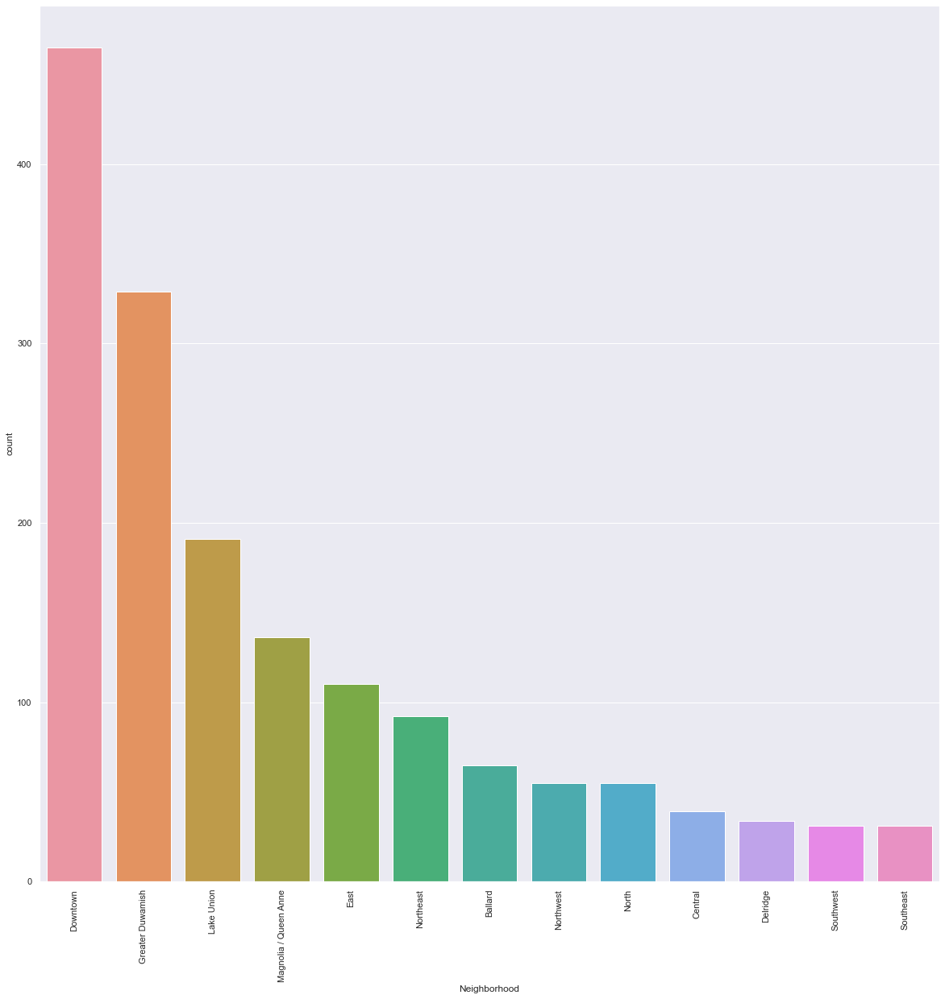

In [118]:
# Histogramme "Neighborhood" :

large_to_small = jugatsu6.groupby('Neighborhood').size().sort_values().index[::-1]
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,20))
ax = sns.countplot(x="Neighborhood", data=jugatsu6, order = large_to_small)
plt.xticks(rotation = 'vertical')
plt.show()

# - SiteEnergyUseWN(kBtu) : 

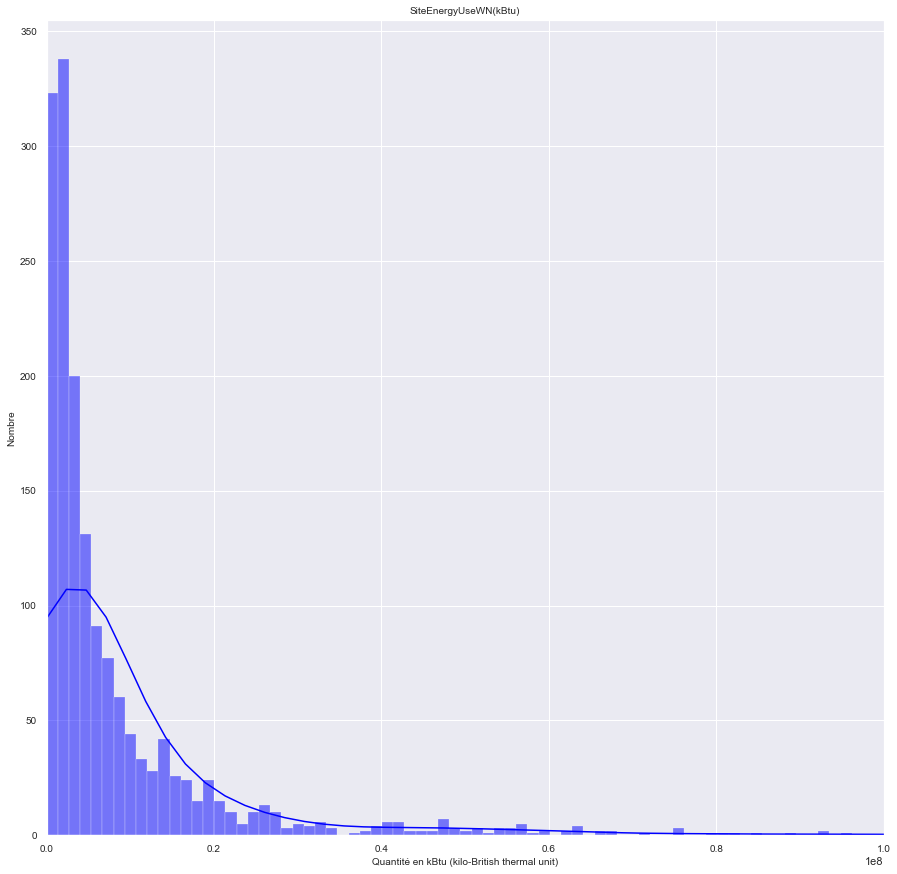

In [119]:
# Histogramme SiteEnergyUseWN(kBtu) :

plt.figure(figsize=(15,15))
sns.histplot(data=jugatsu6['SiteEnergyUseWN(kBtu)'], kde = True, color = 'blue')
plt.xlabel('Quantité en kBtu (kilo-British thermal unit)', fontsize=10)
plt.ylabel('Nombre', fontsize=10)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlim(0, 100000000)
plt.title('SiteEnergyUseWN(kBtu)', fontsize =10)
plt.show()

# - GHGEmissionsIntensity :

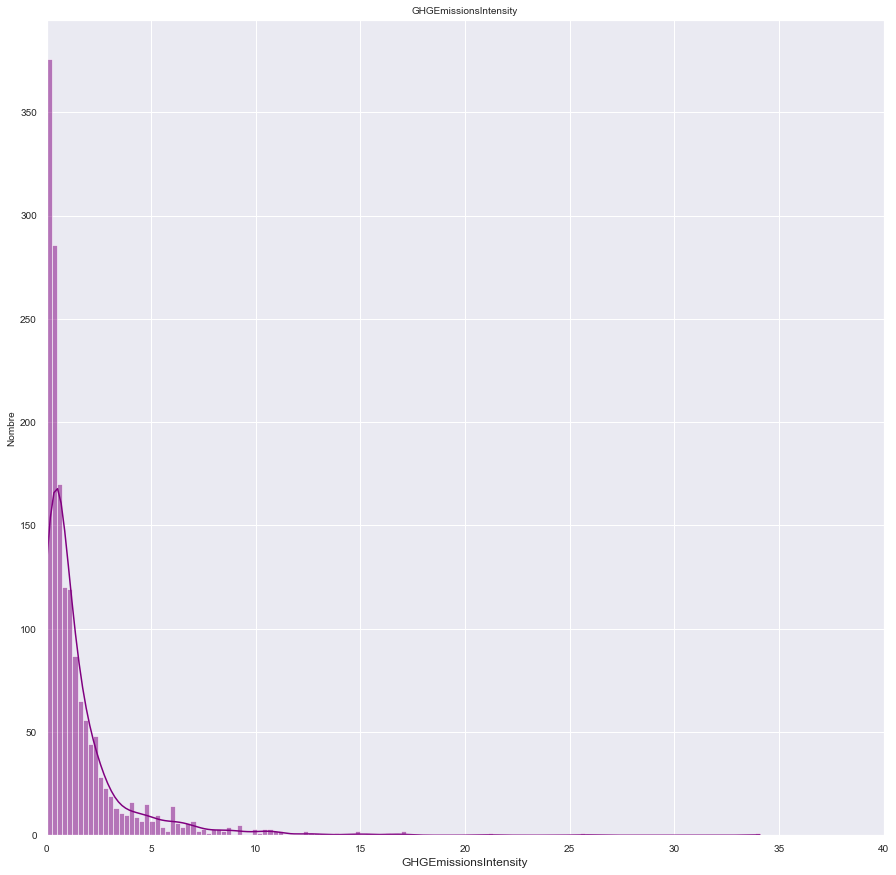

In [120]:
# Histogramme GHGEmissionsIntensity :

plt.figure(figsize=(15,15))
sns.histplot(data=jugatsu6['GHGEmissionsIntensity'], kde = True, color = 'purple')
plt.ylabel('Nombre', fontsize=10)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlim(0, 40)
plt.title('GHGEmissionsIntensity', fontsize =10)
plt.show()

# - TotalGHGEmissions :

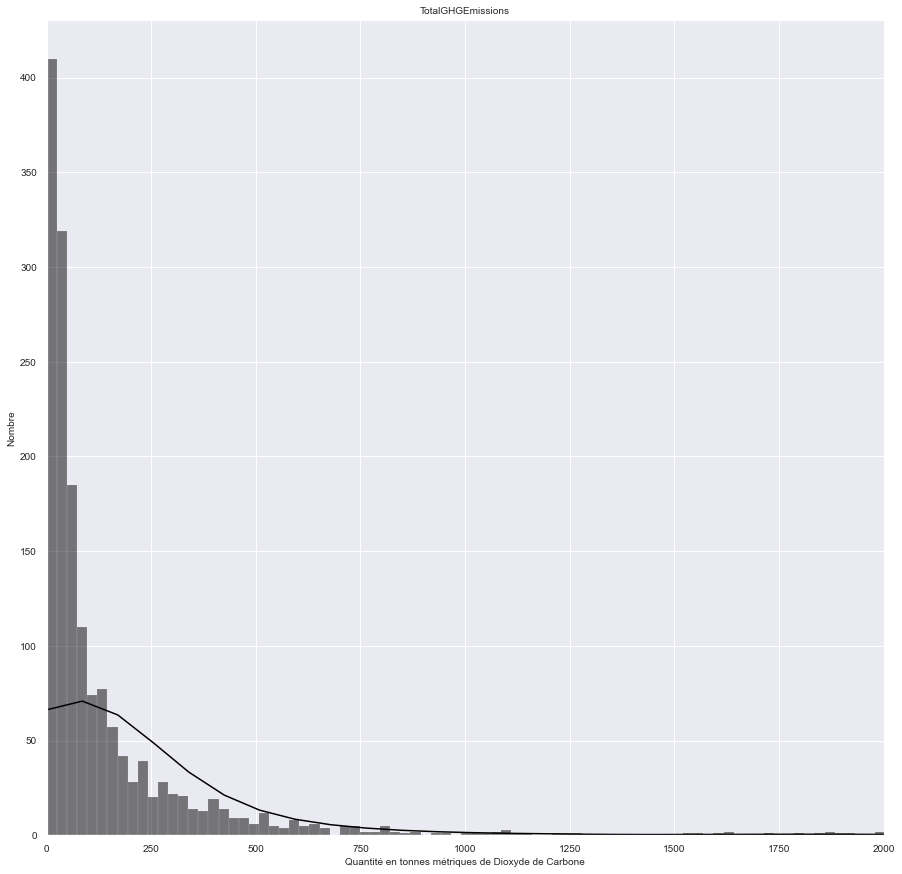

In [121]:
# Histogramme TotalGHGEmissions :

plt.figure(figsize=(15,15))
sns.histplot(data=jugatsu6['TotalGHGEmissions'], kde = True, color = 'black')
plt.xlabel('Quantité en tonnes métriques de Dioxyde de Carbone', fontsize=10)
plt.ylabel('Nombre', fontsize=10)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlim(0, 2000)
plt.title('TotalGHGEmissions', fontsize =10)
plt.show()

# - ENERGYSTARScore :

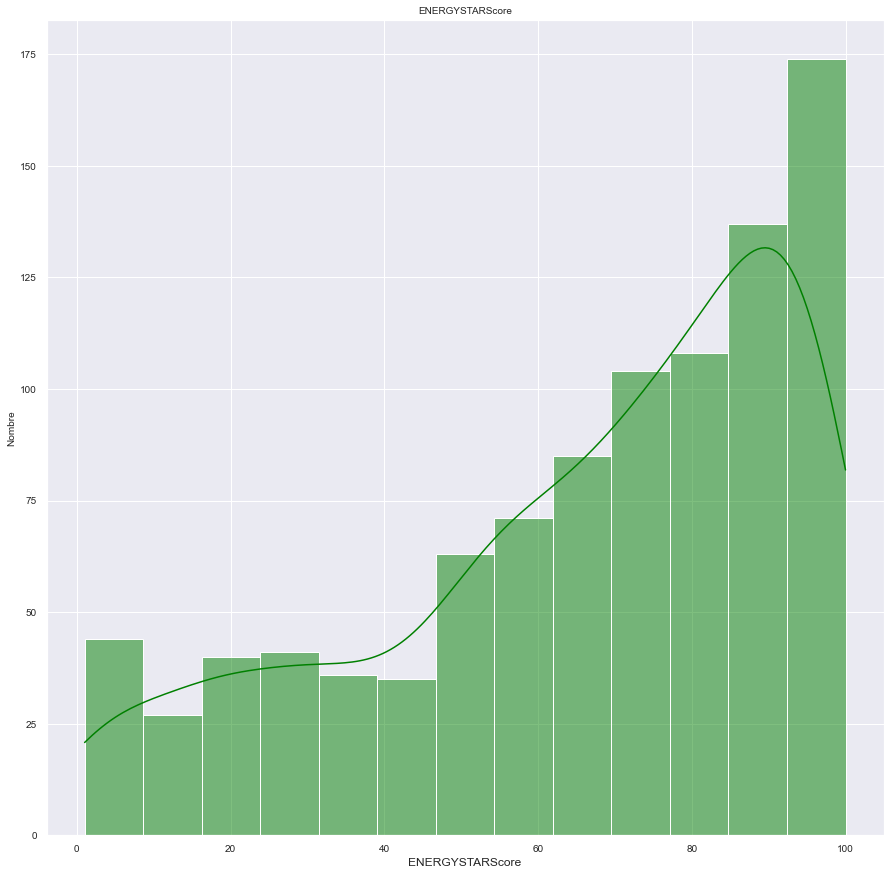

In [122]:
# Histogramme ENERGYSTARScore :

plt.figure(figsize=(15,15))
sns.histplot(data=jugatsu6['ENERGYSTARScore'], kde = True, color = 'green')
plt.ylabel('Nombre', fontsize=10)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.title('ENERGYSTARScore', fontsize =10)
plt.show()

# VII ANALYSE BIVARIEE :

In [123]:
# Détermination des Types de Bâtiments les plus récurrents de notre dataframe d'étude :

jugatsu6['PrimaryPropertyType'].value_counts()

Small- and Mid-Sized Office    340
Large Office                   289
Other                          224
Mixed Use Property             213
Warehouse                      86 
Non-Refrigerated Warehouse     84 
Retail Store                   68 
Hotel                          65 
Distribution Center            57 
Worship Facility               45 
Medical Office                 37 
Supermarket/Grocery Store      33 
Senior Care Community          21 
Refrigerated Warehouse         12 
Restaurant                     11 
Hospital                       10 
Self-Storage Facility          8  
K-12 School                    7  
Residence Hall                 6  
Laboratory                     5  
Residence Hall/Dormitory       4  
University                     4  
College/University             4  
Name: PrimaryPropertyType, dtype: int64

# - Boxplot Variables Quantitatives / Type de Bâtiments :

# "Small- and Mid-Sized Office"

In [124]:
# Création de la Dataframe "Small- and Mid-Sized Office" :

lrm = jugatsu6[(jugatsu6['PrimaryPropertyType'] == 'Small- and Mid-Sized Office')]
lrm

,DataYear,YearBuilt,BuildingAge,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,ENERGYSTARScore,ListOfAllPropertyUseTypes,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,NumberofBuildings,NumberofFloors,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu)
6,2015,1910,105,NonResidential,Small- and Mid-Sized Office,1943 1St Ave S,Greater Duwamish,47.584621,-122.334702,90.0,"Office, Retail Store",49052,0,49052,Office,32393.0,Retail Store,10057.0,NaN,NaN,1,3,1.863468e+06,1.784423e+06,12.99,0.10,0.0,1863545.0,0.0
7,2015,1937,78,NonResidential,Small- and Mid-Sized Office,66 S Hanford St,Greater Duwamish,47.575943,-122.336243,NaN,"Office, Other",39036,0,39036,Office,27636.0,Other,13611.0,NaN,NaN,1,2,1.437569e+06,1.633213e+06,35.54,0.81,0.0,884509.0,553097.0
8,2015,1923,92,NonResidential,Small- and Mid-Sized Office,3201 1St Ave S,Greater Duwamish,47.575264,-122.334724,93.0,"Non-Refrigerated Warehouse, Office, Social/Meeting Hall",26310,0,26310,Office,24000.0,Non-Refrigerated Warehouse,8874.0,Social/Meeting Hall,1000.0,1,1,7.649060e+05,7.649060e+05,11.48,0.33,0.0,631733.0,133199.0
44,2015,1913,102,NonResidential,Small- and Mid-Sized Office,830 4Th Ave S,Greater Duwamish,47.594982,-122.328545,70.0,"Office, Parking",53840,12870,40970,Office,42800.0,Parking,10400.0,NaN,NaN,1,4,2.827818e+06,3.062345e+06,43.84,0.63,0.0,2304926.0,522988.0
49,2015,1907,108,NonResidential,Small- and Mid-Sized Office,1423 10Th Ave E,East,47.613567,-122.320045,94.0,"Office, Other",36000,0,36000,Office,27600.0,Other,8400.0,NaN,NaN,1,2,1.066901e+06,1.119314e+06,19.11,0.43,0.0,813850.0,253085.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3141,2016,1957,59,NonResidential,Small- and Mid-Sized Office,2517 Eastlake Ave E,Lake Union,47.642429,-122.326180,99.0,"Office, Parking",21183,0,21183,Office,13945.0,Parking,7238.0,NaN,NaN,1,2,3.615421e+05,3.615421e+05,2.52,0.12,0.0,361542.0,0.0
3155,2016,2006,10,NonResidential,Small- and Mid-Sized Office,600 N. 36Th Street,Lake Union,47.651779,-122.350998,NaN,"Multifamily Housing, Office, Parking, Retail Store",39926,12400,27526,Office,24335.0,Parking,12400.0,Retail Store,2575.0,1,4,1.010968e+06,1.039085e+06,14.49,0.36,0.0,849654.0,161314.0
3158,2016,1985,31,NonResidential,Small- and Mid-Sized Office,936 N 34Th St,Lake Union,47.649040,-122.346092,94.0,"Office, Parking",31417,8110,23307,Office,26295.0,Parking,12890.0,NaN,NaN,1,3,1.126157e+06,1.214409e+06,28.09,0.89,0.0,687472.0,438685.0
3171,2016,1982,34,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,69.0,"Non-Refrigerated Warehouse, Office",40029,0,40029,Office,31800.0,Non-Refrigerated Warehouse,8200.0,NaN,NaN,1,2,1.471914e+06,1.575328e+06,10.26,0.26,0.0,1471914.0,0.0


In [125]:
# Melting de la dataframe "Small- and Mid-Sized Office" :

lrm_melted = pd.melt(lrm)
lrm_melted.rename(columns = {'variable' : 'Variable', 'value' : 'Value'}, inplace = True)
lrm_melted

,Variable,Value
0,DataYear,2015
1,DataYear,2015
2,DataYear,2015
3,DataYear,2015
4,DataYear,2015
...,...,...
9855,NaturalGas(kBtu),0.0
9856,NaturalGas(kBtu),161314.0
9857,NaturalGas(kBtu),438685.0
9858,NaturalGas(kBtu),0.0


In [126]:
# Création de la Dataframe "Small- and Mid-Sized Office / SiteEnergyUseWN(kBtu)" :

supenergy = lrm_melted[lrm_melted['Variable']=='SiteEnergyUseWN(kBtu)']

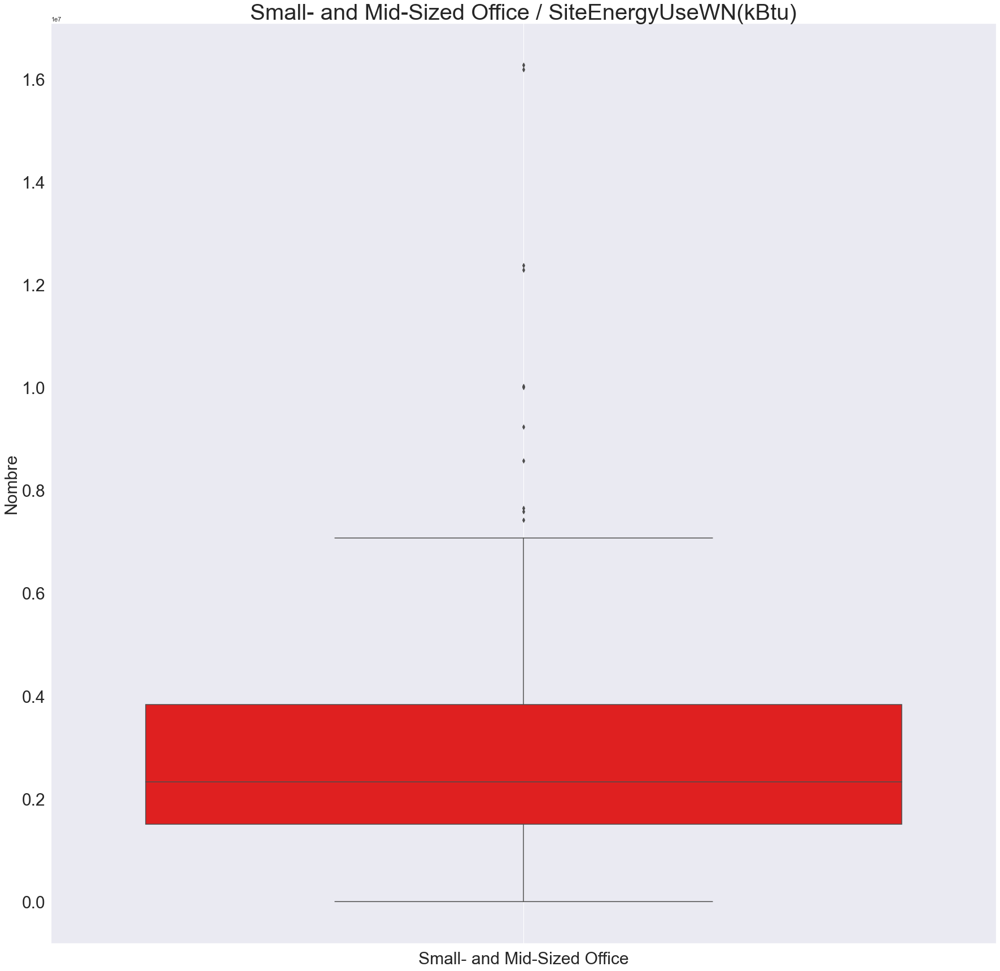

In [127]:
# Boxplot "Small- and Mid-Sized Office / SiteEnergyUseWN(kBtu)" :

plt.figure(figsize=(30,30))
x = 'PrimaryPropertyType'
y = 'SiteEnergyUseWN(kBtu)'
sns.boxplot(y= "Value", data = supenergy, color = 'Red')
plt.yticks(fontsize = 30)
plt.xlabel('Small- and Mid-Sized Office',fontsize = 30)
plt.ylabel('Nombre',fontsize = 30)
plt.grid()
plt.title('Small- and Mid-Sized Office / SiteEnergyUseWN(kBtu)', fontsize = 40)
plt.show()

In [128]:
# Création de la Dataframe "Small- and Mid-Sized Office / GHGEmissionsIntensity" :

supint = lrm_melted[lrm_melted['Variable']=='GHGEmissionsIntensity']

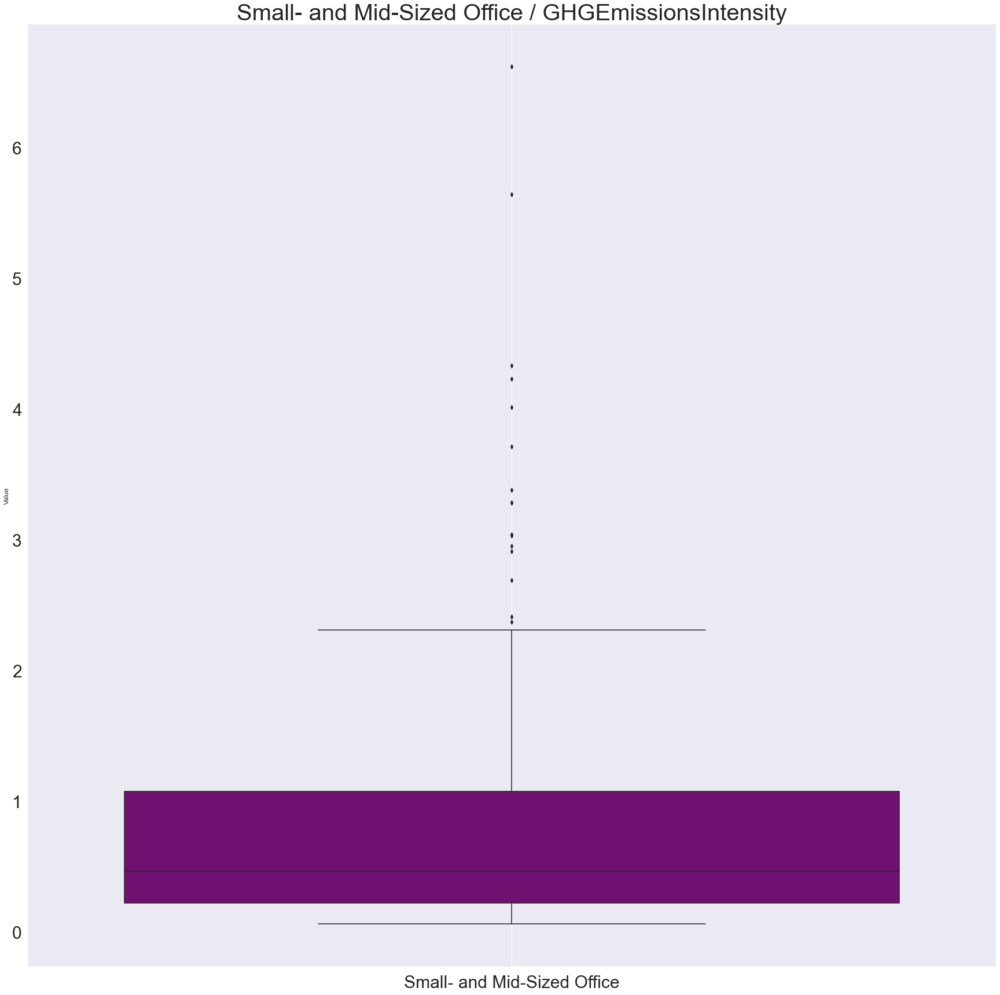

In [129]:
# Boxplot "Small- and Mid-Sized Office / GHGEmissionsIntensity" :

plt.figure(figsize=(30,30))
x = 'PrimaryPropertyType'
y = 'GHGEmissionsIntensity'
sns.boxplot(y= "Value", data = supint, color = 'purple')
plt.yticks(fontsize = 30)
plt.xlabel('Small- and Mid-Sized Office',fontsize = 30)
plt.grid()
plt.title('Small- and Mid-Sized Office / GHGEmissionsIntensity', fontsize = 40)
plt.show()

In [130]:
# Création de la Dataframe "Small- and Mid-Sized Office / TotalGHGEmissions" :

supgaz = lrm_melted[lrm_melted['Variable']=='TotalGHGEmissions']

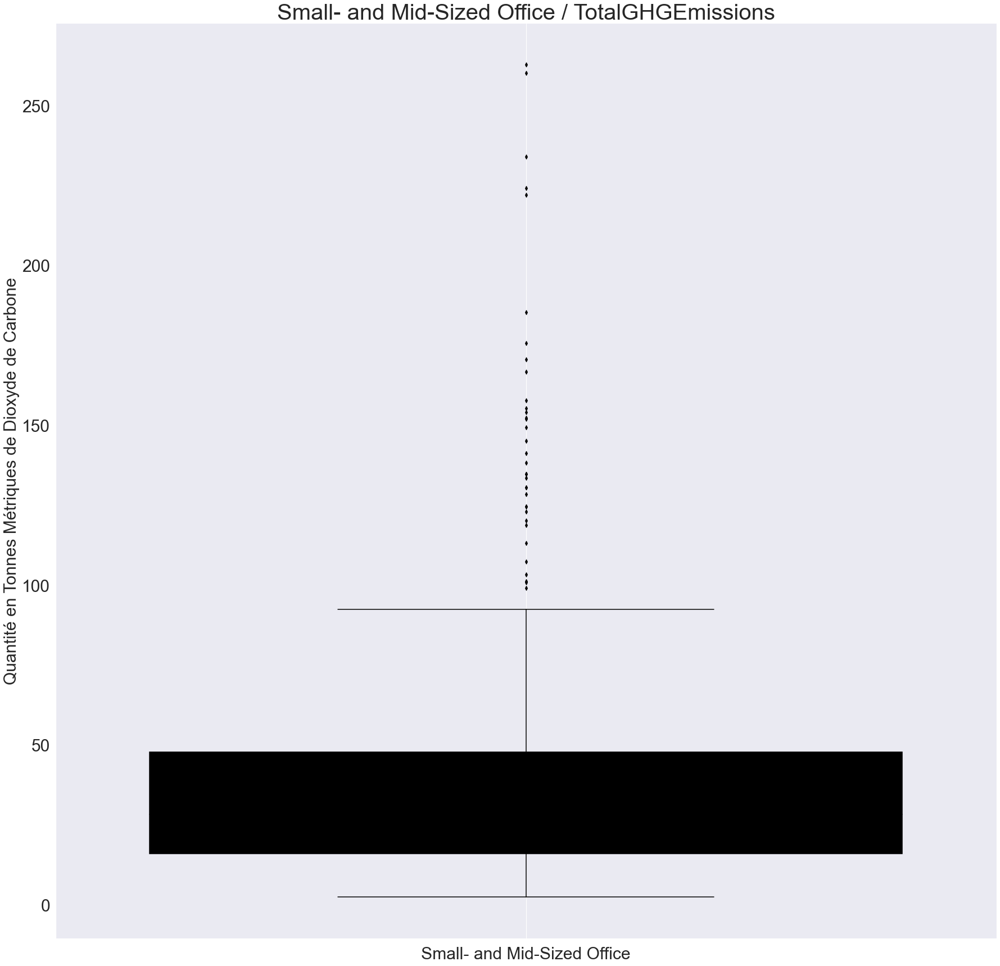

In [131]:
# Boxplot "Small- and Mid-Sized Office / TotalGHGEmissions" :

plt.figure(figsize=(30,30))
x = 'PrimaryPropertyType'
y = 'TotalGHGEmissions'
sns.boxplot(y= "Value", data = supgaz, color = 'black')
plt.yticks(fontsize = 30)
plt.xlabel('Small- and Mid-Sized Office',fontsize = 30)
plt.ylabel('Quantité en Tonnes Métriques de Dioxyde de Carbone',fontsize = 30)
plt.grid()
plt.title('Small- and Mid-Sized Office / TotalGHGEmissions', fontsize = 40)
plt.show()

In [132]:
# Création de la Dataframe "Small- and Mid-Sized Office / ENERGYSTARScore" :

supscore = lrm_melted[lrm_melted['Variable']=='ENERGYSTARScore']

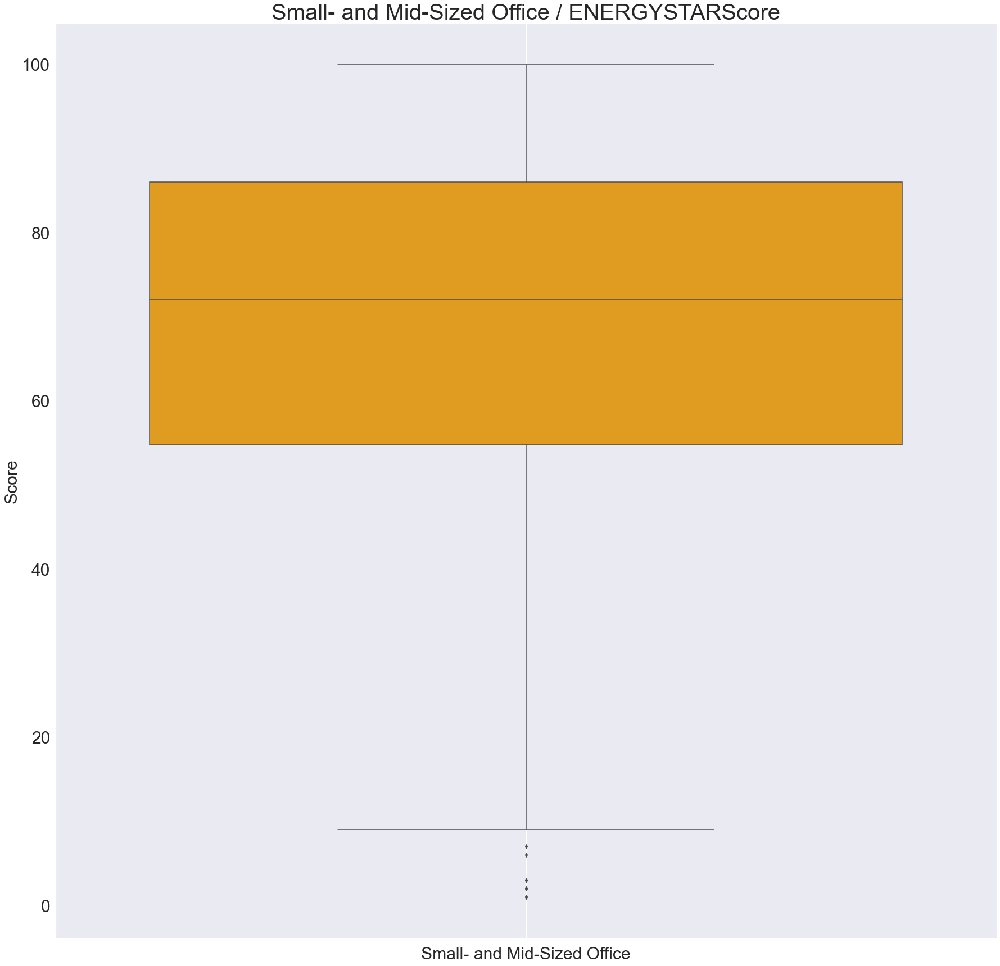

In [133]:
# Boxplot "Small- and Mid-Sized Office / ENERGYSTARScore" :

plt.figure(figsize=(30,30))
x = 'PrimaryPropertyType'
y = 'ENERGYSTARScore'
sns.boxplot(y= "Value", data = supscore, color = 'orange')
plt.yticks(fontsize = 30)
plt.xlabel('Small- and Mid-Sized Office',fontsize = 30)
plt.ylabel('Score',fontsize = 30)
plt.grid()
plt.title('Small- and Mid-Sized Office / ENERGYSTARScore', fontsize = 40)
plt.show()

# Droites de Régression :

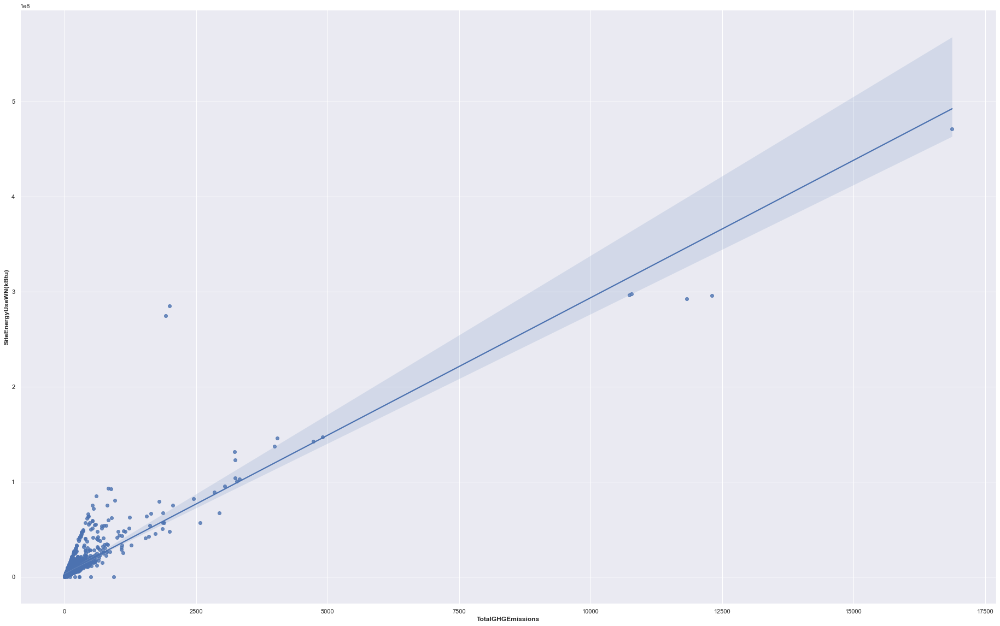

In [134]:
# "Regplot" entre "SiteEnergyUseWN(kBtu)" et "TotalGHGEmissions" :

sns.regplot(data=jugatsu6, x='TotalGHGEmissions', y='SiteEnergyUseWN(kBtu)')
plt.xlabel('TotalGHGEmissions', fontweight='bold')
plt.ylabel('SiteEnergyUseWN(kBtu)', fontweight='bold')
plt.show()

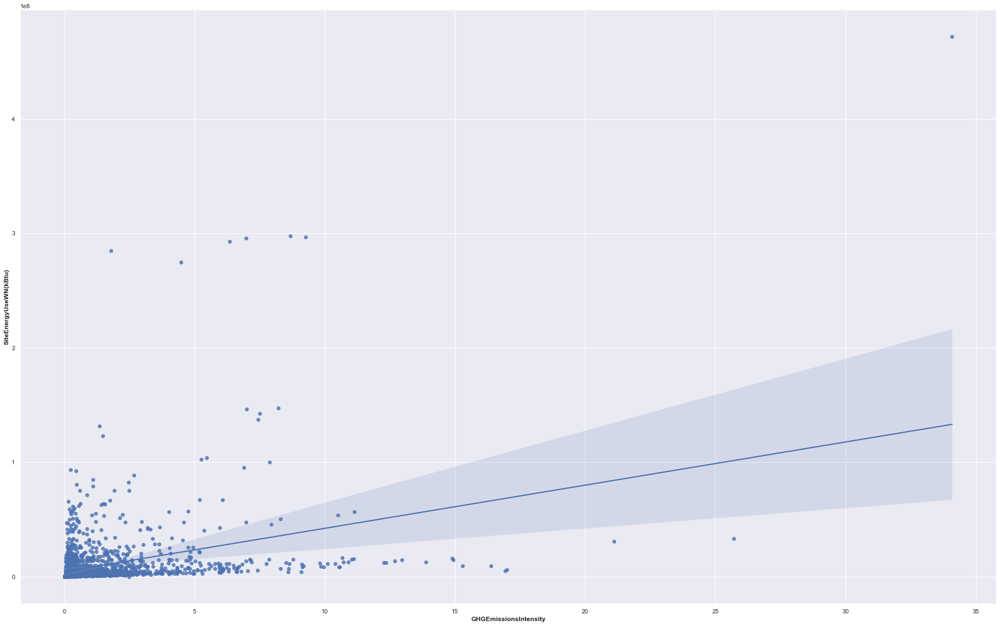

In [135]:
# "Regplot" entre "SiteEnergyUseWN(kBtu)" et "GHGEmissionsIntensity" :

sns.regplot(data=jugatsu6, x='GHGEmissionsIntensity', y='SiteEnergyUseWN(kBtu)')
plt.xlabel('GHGEmissionsIntensity', fontweight='bold')
plt.ylabel('SiteEnergyUseWN(kBtu)', fontweight='bold')
plt.show()

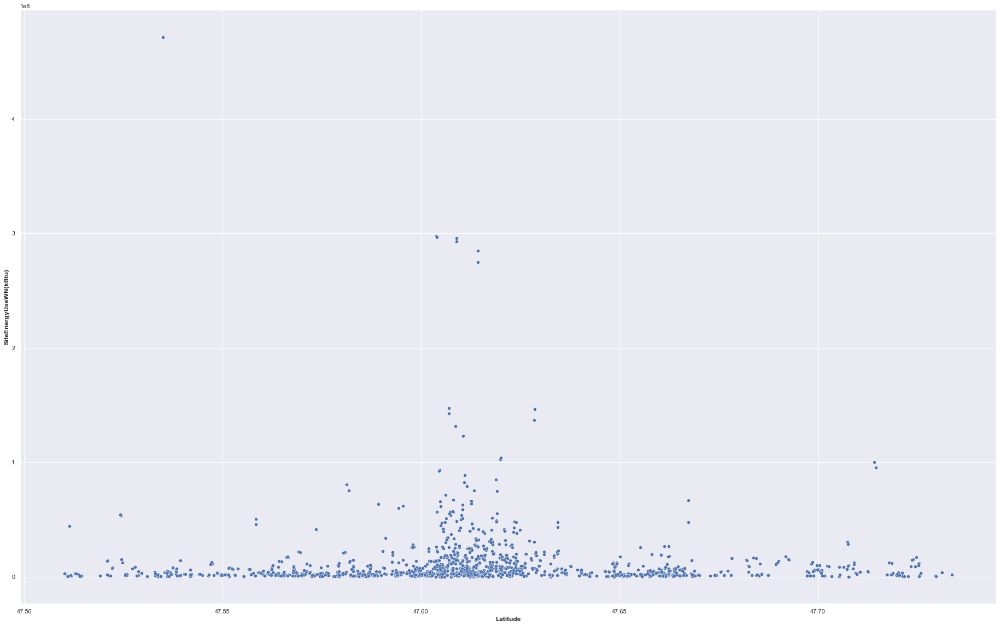

In [136]:
# Distribution des Latitudes des Bâtiments selon "SiteEnergyUseWN(kBtu)" :

sns.scatterplot(data=jugatsu6, x='Latitude', y='SiteEnergyUseWN(kBtu)')
plt.xlabel('Latitude', fontweight='bold')
plt.ylabel('SiteEnergyUseWN(kBtu)', fontweight='bold')
plt.show()

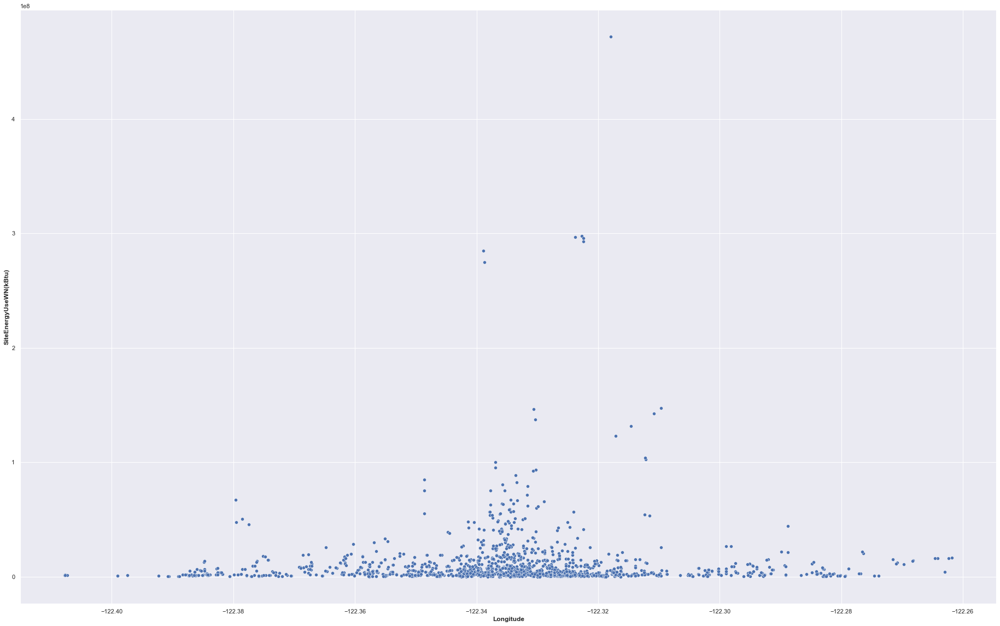

In [137]:
# Distribution des Longitudes des Bâtiments selon "SiteEnergyUseWN(kBtu)" :

sns.scatterplot(data=jugatsu6, x='Longitude', y='SiteEnergyUseWN(kBtu)')
plt.xlabel('Longitude', fontweight='bold')
plt.ylabel('SiteEnergyUseWN(kBtu)', fontweight='bold')
plt.show()

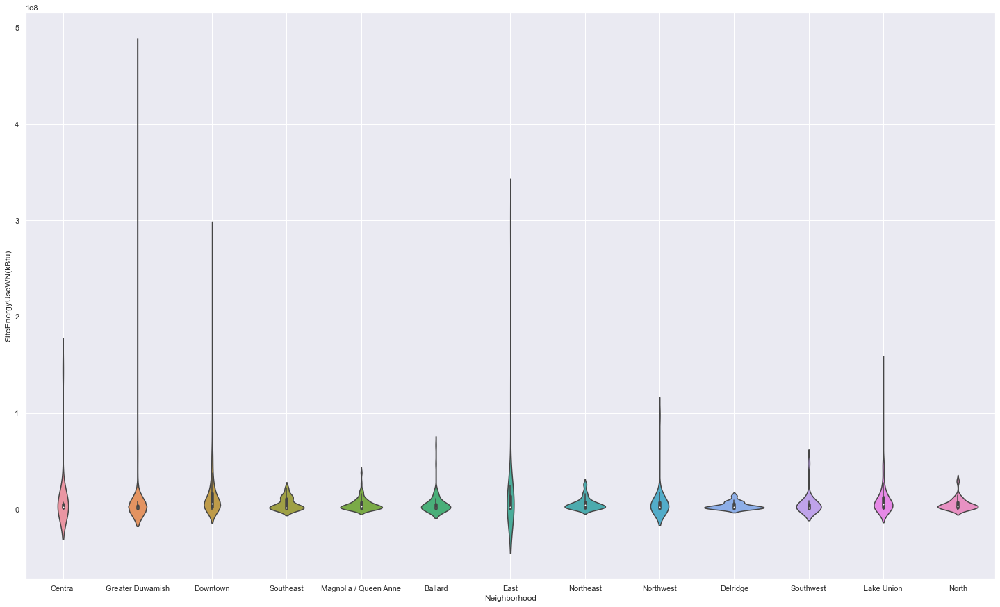

In [138]:
# Répartition de la consommation d'énergie en fonction du Type de Voisinage :

plt.figure(figsize=[25, 15])
sns.violinplot(data=jugatsu6, x='Neighborhood', y='SiteEnergyUseWN(kBtu)')
plt.grid(True)
plt.show()

# VIII ANALYSE MULTIVARIEE :

# - MATRICE DE CORRELATION :

In [139]:
# Correlation, selon Pearson :

t = jugatsu6.corr(method ='kendall')

In [140]:
# Graphique Correlation, selon Pearson :

t.style.background_gradient(cmap='coolwarm')

,DataYear,YearBuilt,BuildingAge,Latitude,Longitude,ENERGYSTARScore,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,NumberofBuildings,NumberofFloors,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu)
DataYear,1.000000,0.012745,0.003269,0.004066,0.003906,0.030984,0.002861,-0.006870,0.002460,0.005639,-0.001850,0.006766,-0.042880,-0.001305,0.010284,0.008245,0.011858,0.118409,-0.007056,0.004700,0.011711
YearBuilt,0.012745,1.000000,-0.994309,0.114787,0.017979,0.047548,0.216213,0.357830,0.161302,0.223703,0.177142,0.076716,-0.003629,0.105765,0.206093,0.196692,0.130337,-0.058531,-0.114730,0.224809,0.040493
BuildingAge,0.003269,-0.994309,1.000000,-0.114700,-0.018085,-0.046655,-0.215873,-0.357672,-0.160974,-0.223343,-0.176838,-0.076563,0.003207,-0.105578,-0.205646,-0.196421,-0.129944,0.061035,0.114484,-0.224513,-0.040266
Latitude,0.004066,0.114787,-0.114700,1.000000,-0.187772,0.014006,0.038559,0.152831,0.003153,0.031210,0.032644,-0.041222,-0.053633,0.099092,0.067492,0.064299,0.035072,-0.001810,-0.052781,0.077178,0.014129
Longitude,0.003906,0.017979,-0.018085,-0.187772,1.000000,-0.061932,-0.048960,-0.087049,-0.045921,-0.028810,-0.060928,0.016584,0.044126,-0.115051,-0.034699,-0.031173,-0.016696,0.034822,-0.010856,-0.039698,0.038532
ENERGYSTARScore,0.030984,0.047548,-0.046655,0.014006,-0.061932,1.000000,0.161396,0.103399,0.158754,0.168796,0.136635,0.056591,-0.035546,0.160526,-0.037871,-0.048074,-0.053112,-0.234303,0.037941,-0.020253,-0.098048
PropertyGFATotal,0.002861,0.216213,-0.215873,0.038559,-0.048960,0.161396,1.000000,0.418005,0.901152,0.786970,0.529438,0.372542,0.068035,0.485635,0.598799,0.580886,0.420587,-0.096588,0.185063,0.620749,0.077682
PropertyGFAParking,-0.006870,0.357830,-0.357672,0.152831,-0.087049,0.103399,0.418005,1.000000,0.283354,0.358705,0.398042,0.202124,0.008948,0.404477,0.315204,0.298117,0.171073,-0.170472,0.016203,0.355283,-0.052694
PropertyGFABuilding(s),0.002460,0.161302,-0.160974,0.003153,-0.045921,0.158754,0.901152,0.283354,1.000000,0.775673,0.484953,0.358088,0.070739,0.458926,0.586679,0.570898,0.429999,-0.073530,0.200151,0.596349,0.090809
LargestPropertyUseTypeGFA,0.005639,0.223703,-0.223343,0.031210,-0.028810,0.168796,0.786970,0.358705,0.775673,1.000000,0.401741,0.275771,0.073119,0.448859,0.579096,0.562754,0.411012,-0.081672,0.177714,0.595703,0.073859


In [141]:
# Création de la Matrice de Correlation :

corr_matrix = t.corr()

In [142]:
# Mise en place d'un Masque permettant de cacher le haut du Triangle :

mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)]= True

/var/folders/_5/v63wfks92ynb3p2nthszhh2m0000gn/T/ipykernel_38184/837946498.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr_matrix, dtype=np.bool)


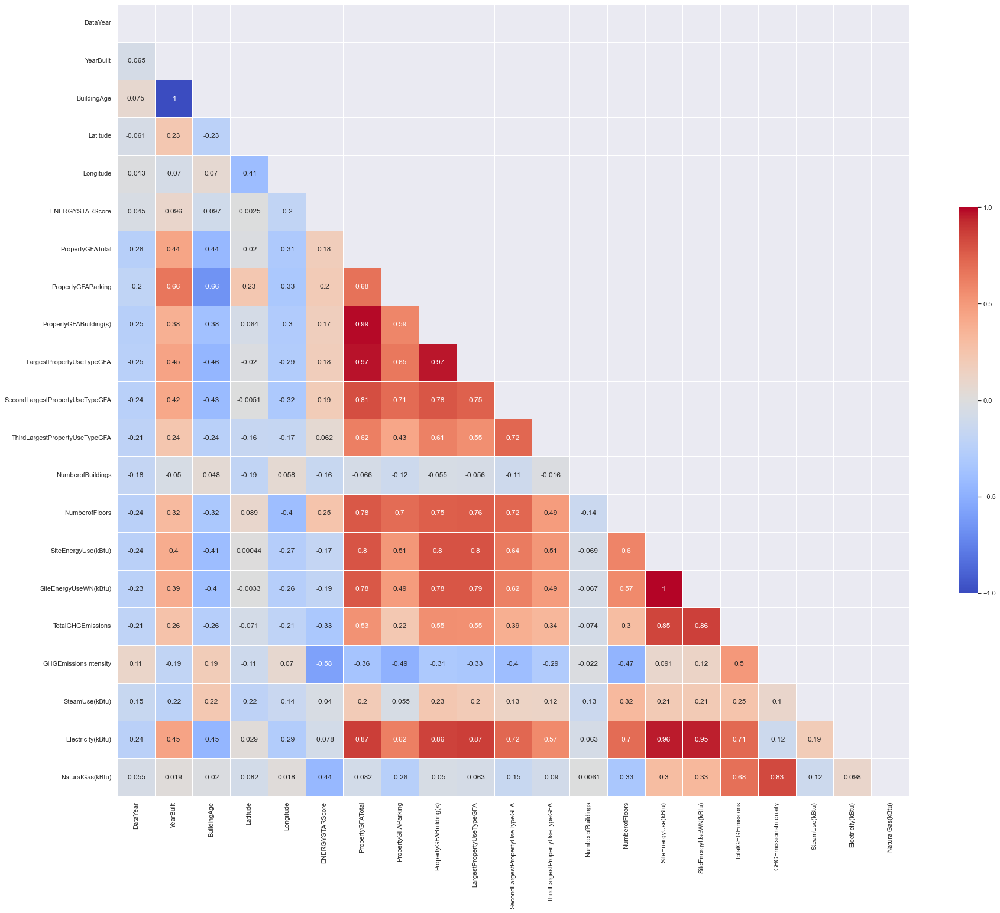

In [143]:
# Heatmap de Correlation :

f, ax = plt.subplots(figsize=(30, 30))
heatmap = sns.heatmap(corr_matrix, mask = mask, square = True, linewidths = .5, cmap = 'coolwarm', cbar_kws = {"shrink": .4, "ticks" : [-1, -.5, 0, 0.5, 1]}, vmin = -1, vmax = 1, annot = True, annot_kws = {"size": 12})   
ax.set_yticklabels(corr_matrix.columns, rotation = 0)
ax.set_xticklabels(corr_matrix.columns)
sns.set_style({"xtick.bottom": True}, {"ytick.left": True})

In [144]:
# Tableau de Corrélations :

threshold = 0.7
corr_pairs = t.unstack().sort_values(kind="quicksort")
strong_corr = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > threshold)])
               .reset_index().rename(columns={0:'corr_coeff'}))
strong_corr = strong_corr[(strong_corr.index%2 == 0) & (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
12,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),0.956508
10,PropertyGFATotal,PropertyGFABuilding(s),0.901152
8,SiteEnergyUse(kBtu),Electricity(kBtu),0.817577
6,PropertyGFATotal,LargestPropertyUseTypeGFA,0.786970
4,SiteEnergyUseWN(kBtu),Electricity(kBtu),0.783001
2,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,0.775673
0,YearBuilt,BuildingAge,-0.994309


In [145]:
# Correlation suivant les Colonnes :

corr = jugatsu6.corr()
corr_columns = corr.columns[((corr < 1) & (corr > 0.7)).any(axis=0)]
corr_columns

Index(['PropertyGFATotal', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'NumberofFloors', 'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)',
       'TotalGHGEmissions', 'SteamUse(kBtu)', 'Electricity(kBtu)',
       'NaturalGas(kBtu)'],
      dtype='object')

# Scatterplot ou Distribution :

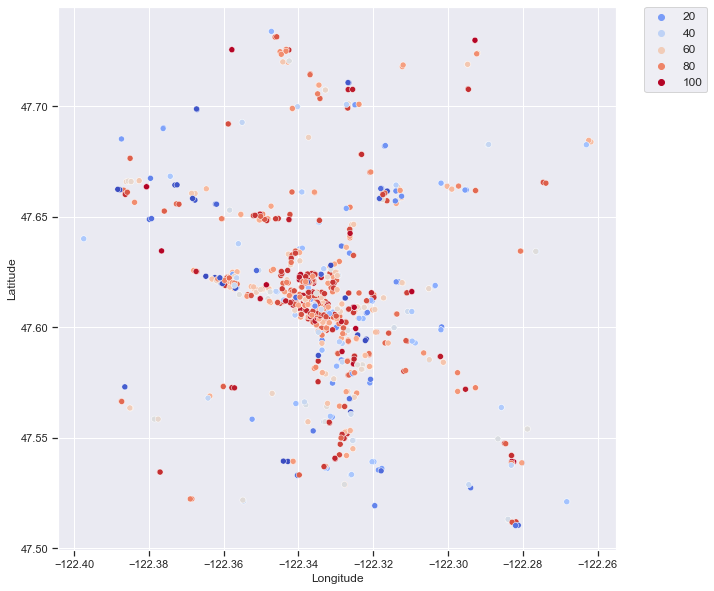

In [146]:
# Affichage des Coordonnées Géographiques des Bâtiments, selon la variable "ENERGYSTARScore" :

plt.figure(figsize=(10, 10)) 
sns.color_palette('coolwarm', as_cmap=True)
sns.scatterplot(x='Longitude', y='Latitude', data=jugatsu6,
                hue=jugatsu6['ENERGYSTARScore'], palette='coolwarm')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.show()

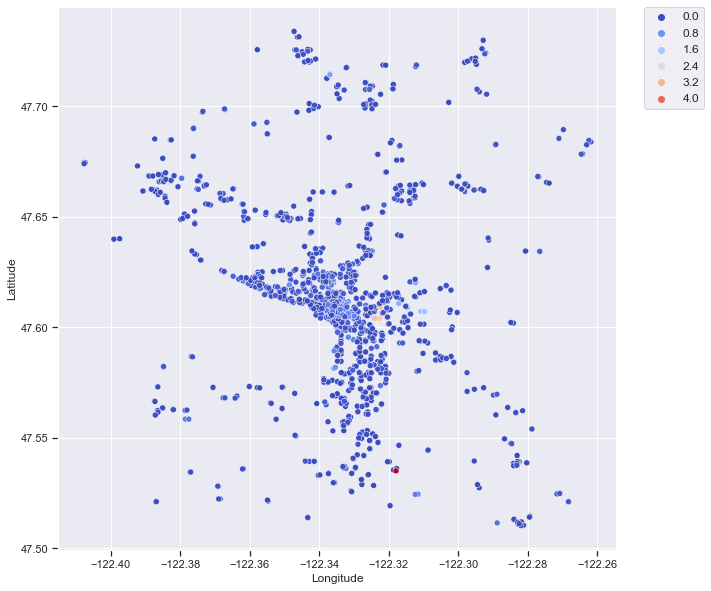

In [147]:
# Affichage des Coordonnées Géographiques des Bâtiments, selon la variable "SiteEnergyUseWN(kBtu)" :

plt.figure(figsize=(10, 10)) 
sns.color_palette('coolwarm', as_cmap=True)
sns.scatterplot(x='Longitude', y='Latitude', data=jugatsu6,
                hue=jugatsu6['SiteEnergyUseWN(kBtu)'], palette='coolwarm')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.show()

# - FEATURE ENGINEERING :

In [148]:
# Création de Variables :

jugatsu6['TotalUseTypeNumber'] = [str(word).count(",") + 1 for word in jugatsu6['ListOfAllPropertyUseTypes'].str.split(',')]
jugatsu6.drop('ListOfAllPropertyUseTypes', axis=1)

,DataYear,YearBuilt,BuildingAge,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,ENERGYSTARScore,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,NumberofBuildings,NumberofFloors,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalUseTypeNumber
2,2015,1962,53,NonResidential,Self-Storage Facility,1120 12Th Ave,Central,47.612465,-122.316299,NaN,24248,0,24248,Self-Storage Facility,21018.0,Parking,3230.0,NaN,NaN,1,1,108795.00,126687.000,0.78,0.01,0.0,1.082580e+05,5.420000e+02,2
4,2015,2009,6,NonResidential,Other,210 S Hudson St,Greater Duwamish,47.558918,-122.331558,NaN,127065,84710,42355,Parking,84710.0,Office,42355.0,NaN,NaN,1,3,3293119.00,3537439.000,22.96,0.07,0.0,3.293256e+06,0.000000e+00,2
6,2015,1910,105,NonResidential,Small- and Mid-Sized Office,1943 1St Ave S,Greater Duwamish,47.584621,-122.334702,90.0,49052,0,49052,Office,32393.0,Retail Store,10057.0,NaN,NaN,1,3,1863468.00,1784423.000,12.99,0.10,0.0,1.863545e+06,0.000000e+00,2
7,2015,1937,78,NonResidential,Small- and Mid-Sized Office,66 S Hanford St,Greater Duwamish,47.575943,-122.336243,NaN,39036,0,39036,Office,27636.0,Other,13611.0,NaN,NaN,1,2,1437569.00,1633213.000,35.54,0.81,0.0,8.845090e+05,5.530970e+05,2
8,2015,1923,92,NonResidential,Small- and Mid-Sized Office,3201 1St Ave S,Greater Duwamish,47.575264,-122.334724,93.0,26310,0,26310,Office,24000.0,Non-Refrigerated Warehouse,8874.0,Social/Meeting Hall,1000.0,1,1,764906.00,764906.000,11.48,0.33,0.0,6.317330e+05,1.331990e+05,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,2016,1982,34,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,69.0,40029,0,40029,Office,31800.0,Non-Refrigerated Warehouse,8200.0,NaN,NaN,1,2,1471914.25,1575328.250,10.26,0.26,0.0,1.471914e+06,0.000000e+00,2
3172,2016,1970,46,NonResidential,Other,670 South Orcas Street,Greater Duwamish,47.551682,-122.324593,NaN,26400,0,26400,Other - Recreation,20560.0,Non-Refrigerated Warehouse,7200.0,NaN,NaN,1,1,452612.50,452612.500,3.16,0.12,0.0,4.526120e+05,0.000000e+00,2
3173,2016,1968,48,NonResidential,Warehouse,707 S Orcas St,Greater Duwamish,47.550491,-122.323822,NaN,27680,0,27680,Non-Refrigerated Warehouse,25000.0,Office,2680.0,NaN,NaN,1,1,1778431.75,1918665.750,64.81,2.34,0.0,6.424200e+05,1.136012e+06,2
3174,2016,1969,47,NonResidential,Small- and Mid-Sized Office,5700 Sixth Avenue South,Greater Duwamish,47.551449,-122.326347,NaN,25872,0,25872,Office,23272.0,Non-Refrigerated Warehouse,2600.0,NaN,NaN,1,2,1787119.00,1853911.875,45.79,1.77,0.0,1.064725e+06,7.223940e+05,2


In [149]:
# Création de Nouvelles Variables :

gfa_features = ['PropertyGFATotal', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA','PropertyGFAParking']

jugatsu6[['TotalUseTypeNumber'] + gfa_features].head(10)

,TotalUseTypeNumber,PropertyGFATotal,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,PropertyGFAParking
2,2,24248,24248,21018.0,3230.0,0
4,2,127065,42355,84710.0,42355.0,84710
6,2,49052,49052,32393.0,10057.0,0
7,2,39036,39036,27636.0,13611.0,0
8,3,26310,26310,24000.0,8874.0,0
9,2,42000,42000,38000.0,4000.0,0
13,3,27000,27000,9000.0,9000.0,0
14,3,20747,20747,11815.0,5120.0,0
15,3,41276,41276,24300.0,13284.0,0
16,2,24430,24430,15667.0,8690.0,0


In [150]:
# Calcule de Ratios :

jugatsu6['GFABuildingRate'] = (round((jugatsu6['PropertyGFABuilding(s)'].fillna(0) /jugatsu6['PropertyGFATotal'].fillna(0)),5))
jugatsu6['GFAParkingRate'] = (round((jugatsu6['PropertyGFAParking'].fillna(0) /jugatsu6['PropertyGFATotal'].fillna(0)),5))

In [151]:
# Remplacement des NAN :

jugatsu6['LargestPropertyUseType'] = jugatsu6['LargestPropertyUseType'].fillna("Unknown")
jugatsu6['NumberofFloors'] = jugatsu6['NumberofFloors'].fillna(1)

In [152]:
# Calcul des Ratios :

jugatsu6['GFAPerBuilding'] = round((jugatsu6['PropertyGFATotal'] / jugatsu6['NumberofBuildings']),3)
jugatsu6['GFAPerFloor'] = round((jugatsu6['PropertyGFATotal'] / jugatsu6['NumberofFloors']),3)
jugatsu6['EnergyUsePerFloor'] = round((jugatsu6['SiteEnergyUseWN(kBtu)'] / jugatsu6['NumberofFloors']),3)
jugatsu6['EnergyUsePerBuilding'] = round((jugatsu6['SiteEnergyUseWN(kBtu)'] / jugatsu6['NumberofBuildings']),3)
jugatsu6['ENERGYSTARScorePerFloor'] = round((jugatsu6['ENERGYSTARScore'] / jugatsu6['NumberofFloors']),3)
jugatsu6['TotalGHGEmissionsPerFloor'] = round((jugatsu6['TotalGHGEmissions'] / jugatsu6['NumberofFloors']),3)
jugatsu6['GHGEmissionsIntensityPerFloor'] = round((jugatsu6['GHGEmissionsIntensity'] / jugatsu6['NumberofFloors']),3)

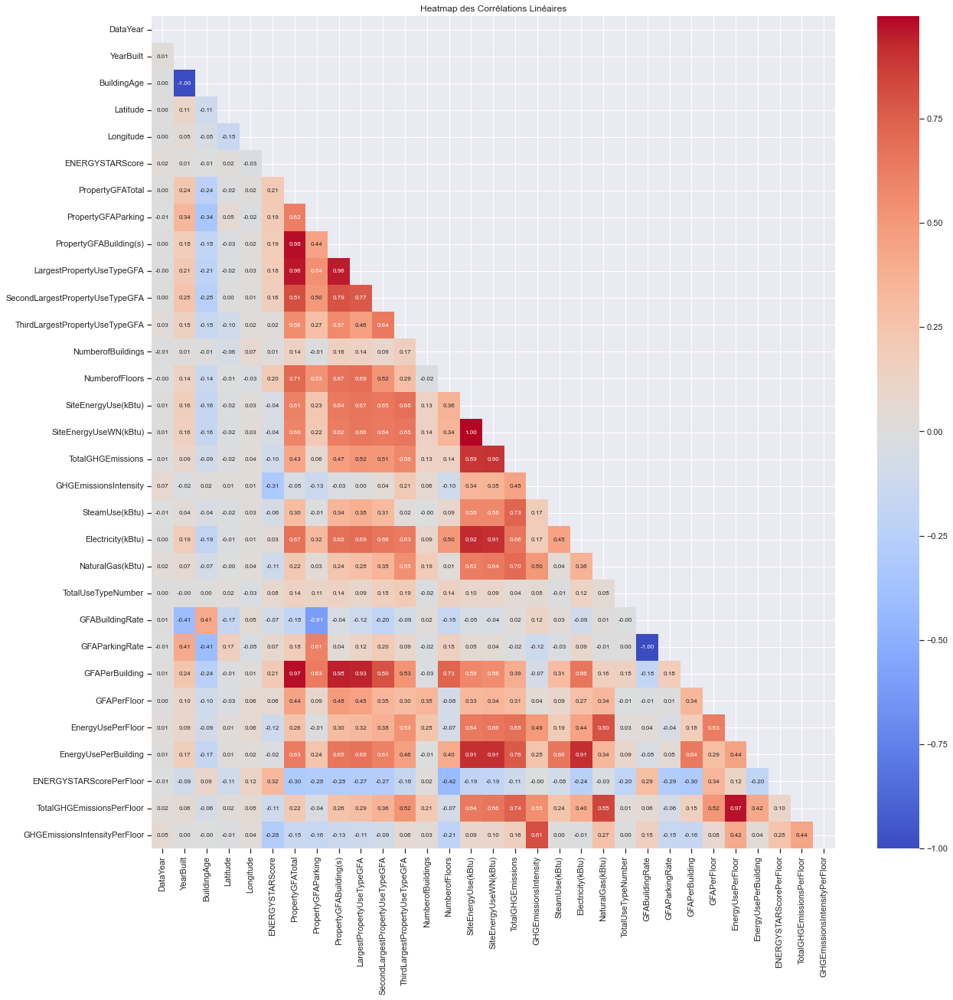

In [153]:
# Heatmap de Corrélation :

corr = jugatsu6.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(20,20))
ax = sns.heatmap(corr, annot=True, fmt=".2f", annot_kws={'size':8}, 
                 mask=mask, center=0, cmap="coolwarm")
plt.title("Heatmap des Corrélations Linéaires")
plt.grid()
plt.show()

In [154]:
# Tableau de Corrélations :

threshold = 0.7
corr_pairs = corr.unstack().sort_values(kind="quicksort")
strong_corr = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > threshold)])
               .reset_index().rename(columns={0:'corr_coeff'}))
strong_corr = strong_corr[(strong_corr.index%2 == 0) & (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
58,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),0.995347
56,PropertyGFABuilding(s),PropertyGFATotal,0.979109
54,PropertyGFATotal,GFAPerBuilding,0.974811
52,EnergyUsePerFloor,TotalGHGEmissionsPerFloor,0.970221
50,PropertyGFATotal,LargestPropertyUseTypeGFA,0.960660
48,LargestPropertyUseTypeGFA,PropertyGFABuilding(s),0.955271
46,GFAPerBuilding,PropertyGFABuilding(s),0.946838
44,GFAPerBuilding,LargestPropertyUseTypeGFA,0.933002
42,Electricity(kBtu),SiteEnergyUse(kBtu),0.921232
40,EnergyUsePerBuilding,Electricity(kBtu),0.914227


In [155]:
# Variance Inflation Factor :

from statsmodels.stats.outliers_influence import variance_inflation_factor

strong_corr_features = list(set(list(strong_corr['level_0'].values) + list(strong_corr['level_1'].values)))
X = jugatsu6[strong_corr_features].replace([np.inf, -np.inf], np.nan)
X = X.dropna()

vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                   for i in range(len(X.columns))]
vif_data[vif_data['VIF'] > 5]

,feature,VIF
0,EnergyUsePerBuilding,1.964527e+01
2,TotalGHGEmissions,4.618366e+10
3,TotalGHGEmissionsPerFloor,4.399823e+01
4,LargestPropertyUseTypeGFA,1.872800e+01
5,SiteEnergyUseWN(kBtu),1.518373e+02
6,GFAParkingRate,7.223797e+05
7,SteamUse(kBtu),1.883162e+10
8,GFABuildingRate,1.497317e+07
10,Electricity(kBtu),9.986869e+08
11,GFAPerBuilding,3.662514e+01


In [156]:
# Binarité Latitude / Longitude :

jugatsu6['Latitude_Binaire'] = pd.cut(jugatsu6['Latitude'], bins=10, labels=False)
jugatsu6['Longitude_Binaire'] = pd.cut(jugatsu6['Longitude'], bins=10, labels=False)
jugatsu6['Latitude_Longitude_Binaire'] = jugatsu6['Latitude_Binaire'].astype(str) + jugatsu6['Longitude_Binaire'].astype(str)

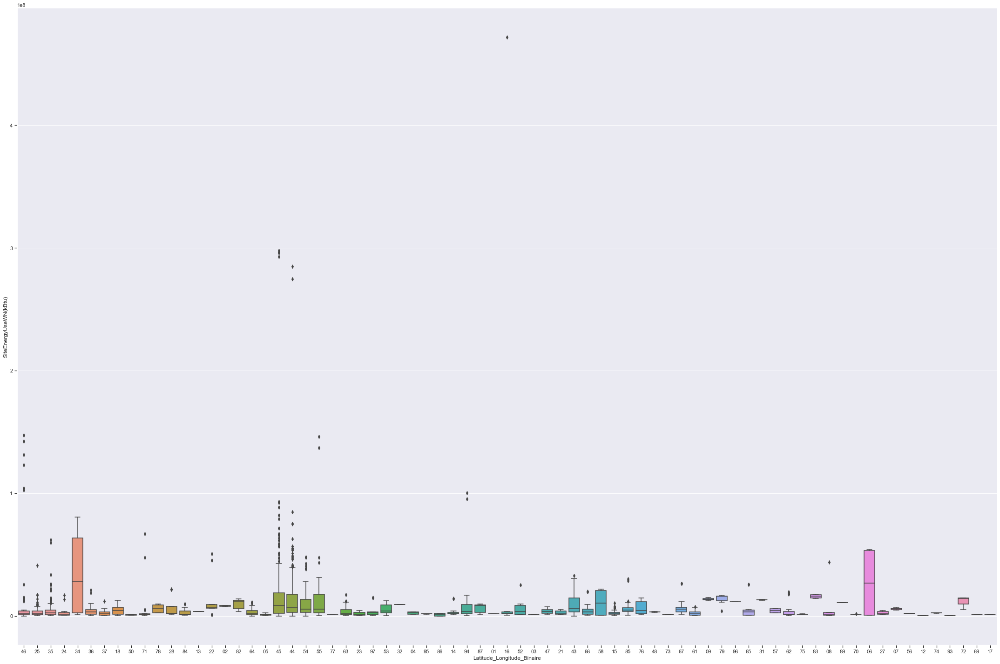

In [157]:
# Répartition de l'Energie suivant la Latitude et la Longitude :

sns.catplot(x='Latitude_Longitude_Binaire', kind='box', height=20, aspect=30/20, y='SiteEnergyUseWN(kBtu)', data=jugatsu6)
plt.show()

In [158]:
# Test de Transformation de la Variable Cible "SiteEnergyUseWN(kBtu)" en Log1p, Log2p et Log10p :

Test_base_1 = np.log1p(jugatsu6['SiteEnergyUseWN(kBtu)'])
Test_base_2 = np.log2(1 + jugatsu6['SiteEnergyUseWN(kBtu)'])
Test_base_10 = np.log10(1 + jugatsu6['SiteEnergyUseWN(kBtu)'])

In [159]:
# Constitution du Dataframe de Travail :

dflog1 = pd.DataFrame({'Test1p': Test_base_1, 'Test2p': Test_base_2, 'Test10p': Test_base_10})
dflog1

,Test1p,Test2p,Test10p
2,11.749483,16.950920,5.102735
4,15.078914,21.754274,6.548689
6,14.394606,20.767027,6.251498
7,14.306060,20.639282,6.213043
8,13.547510,19.544925,5.883609
...,...,...,...
3171,14.269975,20.587222,6.197371
3172,13.022794,18.787920,5.655728
3173,14.467141,20.871673,6.283000
3174,14.432809,20.822142,6.268089


/Users/sylvaincarlevato/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/sylvaincarlevato/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/sylvaincarlevato/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figur

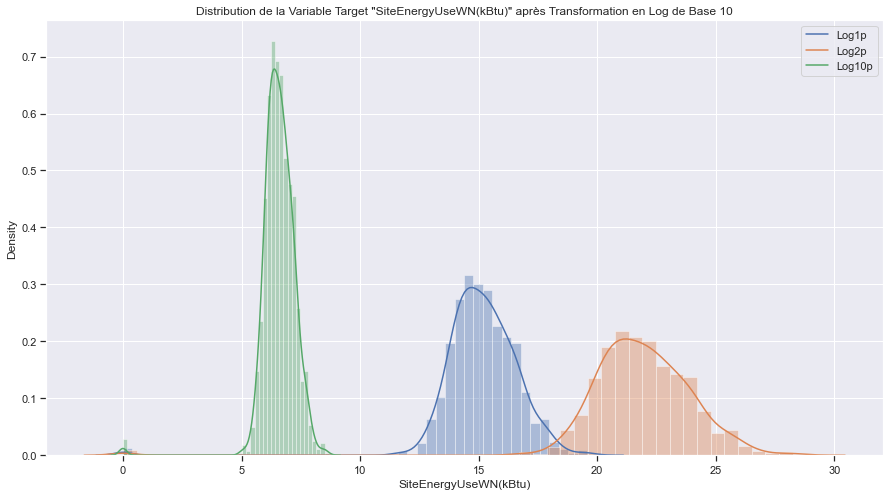

In [160]:
# Visualisation des 3 Tests de Transformation Logarithmique :

plt.figure(figsize=(15, 8))
plt.title('Distribution de la Variable Target "SiteEnergyUseWN(kBtu)" après Transformation en Log de Base 10')
sns.distplot(Test_base_1)
sns.distplot(Test_base_2)
sns.distplot(Test_base_10)
ax = plt.gca()
ax.legend(['Log1p', 'Log2p', 'Log10p'])
plt.show()

In [161]:
# Ajout d'une Nouvelle Variable 'SiteEnergyUseWNLog' :

jugatsu6['SiteEnergyUseWNLog'] = np.log10( 1 + jugatsu6['SiteEnergyUseWN(kBtu)'])

In [162]:
# Test de Transformation de la Variable Cible "TotalGHGEmissions" en Log1p, Log2p et Log10p :

Test_base_1prime = np.log1p(jugatsu6['TotalGHGEmissions'])
Test_base_2prime = np.log2(1 + jugatsu6['TotalGHGEmissions'])
Test_base_10prime = np.log10(1 + jugatsu6['TotalGHGEmissions'])

In [163]:
# Dataframe "Log" :

dflog2 = pd.DataFrame({'Test1p': Test_base_1prime, 'Test2p': Test_base_2prime, 'Test10p': Test_base_10prime})
dflog2

,Test1p,Test2p,Test10p
2,0.576613,0.831877,0.250420
4,3.176386,4.582556,1.379487
6,2.638343,3.806324,1.145818
7,3.598408,5.191405,1.562769
8,2.524127,3.641546,1.096215
...,...,...,...
3171,2.421257,3.493135,1.051538
3172,1.425515,2.056584,0.619093
3173,4.186772,6.040235,1.818292
3174,3.845670,5.548128,1.670153


/Users/sylvaincarlevato/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/sylvaincarlevato/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/sylvaincarlevato/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figur

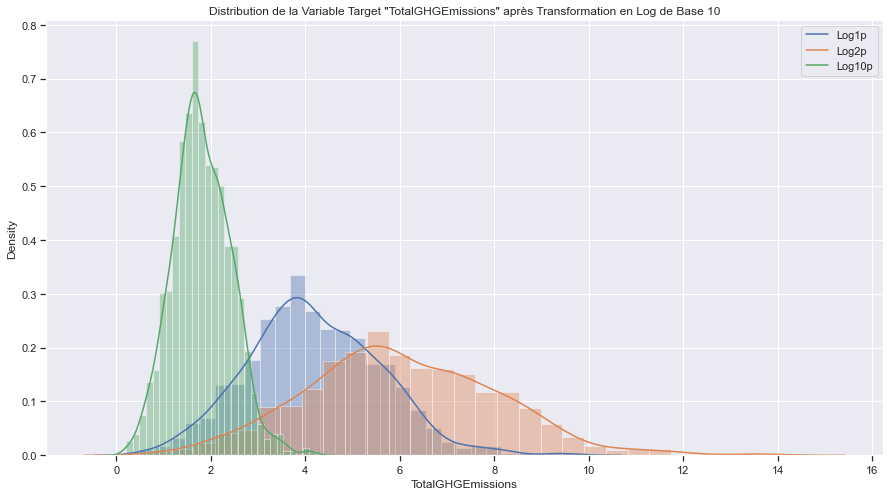

In [164]:
# Visualisation des 3 Tests de Transformation Logarithmique :

plt.figure(figsize=(15, 8))
plt.title('Distribution de la Variable Target "TotalGHGEmissions" après Transformation en Log de Base 10')
sns.distplot(Test_base_1prime)
sns.distplot(Test_base_2prime)
sns.distplot(Test_base_10prime)
ax = plt.gca()
ax.legend(['Log1p', 'Log2p', 'Log10p'])
plt.show()

In [165]:
# Ajout d'une Nouvelle Variable 'TotalGHGEmissionsLog' :

jugatsu6['TotalGHGEmissionsLog'] = np.log10(1 + jugatsu6['TotalGHGEmissions'])

# - ENCODAGE : GET DUMMIES

In [166]:
# Rappel de la Dataframe de Travail :

jugatsu6

,DataYear,YearBuilt,BuildingAge,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,ENERGYSTARScore,ListOfAllPropertyUseTypes,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,NumberofBuildings,NumberofFloors,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalUseTypeNumber,GFABuildingRate,GFAParkingRate,GFAPerBuilding,GFAPerFloor,EnergyUsePerFloor,EnergyUsePerBuilding,ENERGYSTARScorePerFloor,TotalGHGEmissionsPerFloor,GHGEmissionsIntensityPerFloor,Latitude_Binaire,Longitude_Binaire,Latitude_Longitude_Binaire,SiteEnergyUseWNLog,TotalGHGEmissionsLog
2,2015,1962,53,NonResidential,Self-Storage Facility,1120 12Th Ave,Central,47.612465,-122.316299,NaN,"Parking, Self-Storage Facility",24248,0,24248,Self-Storage Facility,21018.0,Parking,3230.0,NaN,NaN,1,1,108795.00,126687.000,0.78,0.01,0.0,1.082580e+05,5.420000e+02,2,1.00000,0.00000,24248.0,24248.000,126687.000,126687.000,NaN,0.780,0.010,4,6,46,5.102735,0.250420
4,2015,2009,6,NonResidential,Other,210 S Hudson St,Greater Duwamish,47.558918,-122.331558,NaN,"Office, Parking",127065,84710,42355,Parking,84710.0,Office,42355.0,NaN,NaN,1,3,3293119.00,3537439.000,22.96,0.07,0.0,3.293256e+06,0.000000e+00,2,0.33333,0.66667,127065.0,42355.000,1179146.333,3537439.000,NaN,7.653,0.023,2,5,25,6.548689,1.379487
6,2015,1910,105,NonResidential,Small- and Mid-Sized Office,1943 1St Ave S,Greater Duwamish,47.584621,-122.334702,90.0,"Office, Retail Store",49052,0,49052,Office,32393.0,Retail Store,10057.0,NaN,NaN,1,3,1863468.00,1784423.000,12.99,0.10,0.0,1.863545e+06,0.000000e+00,2,1.00000,0.00000,49052.0,16350.667,594807.667,1784423.000,30.0,4.330,0.033,3,5,35,6.251498,1.145818
7,2015,1937,78,NonResidential,Small- and Mid-Sized Office,66 S Hanford St,Greater Duwamish,47.575943,-122.336243,NaN,"Office, Other",39036,0,39036,Office,27636.0,Other,13611.0,NaN,NaN,1,2,1437569.00,1633213.000,35.54,0.81,0.0,8.845090e+05,5.530970e+05,2,1.00000,0.00000,39036.0,19518.000,816606.500,1633213.000,NaN,17.770,0.405,2,4,24,6.213043,1.562769
8,2015,1923,92,NonResidential,Small- and Mid-Sized Office,3201 1St Ave S,Greater Duwamish,47.575264,-122.334724,93.0,"Non-Refrigerated Warehouse, Office, Social/Meeting Hall",26310,0,26310,Office,24000.0,Non-Refrigerated Warehouse,8874.0,Social/Meeting Hall,1000.0,1,1,764906.00,764906.000,11.48,0.33,0.0,6.317330e+05,1.331990e+05,3,1.00000,0.00000,26310.0,26310.000,764906.000,764906.000,93.0,11.480,0.330,2,5,25,5.883609,1.096215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,2016,1982,34,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,69.0,"Non-Refrigerated Warehouse, Office",40029,0,40029,Office,31800.0,Non-Refrigerated Warehouse,8200.0,NaN,NaN,1,2,1471914.25,1575328.250,10.26,0.26,0.0,1.471914e+06,0.000000e+00,2,1.00000,0.00000,40029.0,20014.500,787664.125,1575328.250,34.5,5.130,0.130,1,5,15,6.197371,1.051538
3172,2016,1970,46,NonResidential,Other,670 South Orcas Street,Greater Duwamish,47.551682,-122.324593,NaN,"Non-Refrigerated Warehouse, Other - Recreation",26400,0,26400,Other - Recreation,20560.0,Non-Refrigerated Warehouse,7200.0,NaN,NaN,1,1,452612.50,452612.500,3.16,0.12,0.0,4.526120e+05,0.000000e+00,2,1.00000,0.00000,26400.0,26400.000,452612.500,452612.500,NaN,3.160,0.120,1,5,15,5.655728,0.619093
3173,2016,1968,48,NonResidential,Warehouse,707 S Orcas St,Greater Duwamish,47.550491,-122.323822,NaN,"Non-Refrigerated Warehouse, Office",27680,0,27680,Non-Refrigerated Warehouse,25000.0,Office,2680.0,NaN,NaN,1,1,1778431.75,1918665.750,64.81,2.34,0.0,6.424200e+05,1.136012e+06,2,1.00000,0.00000,27680.0,27680.000,1918665.750,1

In [167]:
# Dataframe de Type de Propriété :

dataprop = jugatsu6['PrimaryPropertyType']

In [168]:
# GET DUMMIES "PrimaryPropertyType" :

df1 = pd.get_dummies(dataprop, columns=["PrimaryPropertyType"])
df1

,College/University,Distribution Center,Hospital,Hotel,K-12 School,Laboratory,Large Office,Medical Office,Mixed Use Property,Non-Refrigerated Warehouse,Other,Refrigerated Warehouse,Residence Hall,Residence Hall/Dormitory,Restaurant,Retail Store,Self-Storage Facility,Senior Care Community,Small- and Mid-Sized Office,Supermarket/Grocery Store,University,Warehouse,Worship Facility
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3172,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3173,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3174,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [169]:
# Dataframe de Voisinage :

dataneigh = jugatsu6['Neighborhood']

In [170]:
# GET DUMMIES "Neighborhood" :

df2 = pd.get_dummies(dataneigh, columns=["Neighborhood"])
df2

,Ballard,Central,Delridge,Downtown,East,Greater Duwamish,Lake Union,Magnolia / Queen Anne,North,Northeast,Northwest,Southeast,Southwest
2,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,0,0,0,0,0,1,0,0,0,0,0,0,0
3172,0,0,0,0,0,1,0,0,0,0,0,0,0
3173,0,0,0,0,0,1,0,0,0,0,0,0,0
3174,0,0,0,0,0,1,0,0,0,0,0,0,0


In [171]:
# Dataframe de "ListOfAllPropertyUseTypes" :

datapropuse = jugatsu6['ListOfAllPropertyUseTypes']

In [172]:
# GET DUMMIES "Neighborhood" :

df3 = pd.get_dummies(datapropuse, columns=["ListOfAllPropertyUseTypes"])
df3

,"Adult Education, Bank Branch, Office, Parking","Adult Education, Fitness Center/Health Club/Gym, Office, Other - Restaurant/Bar, Parking, Retail Store","Adult Education, Parking","Automobile Dealership, Office","Automobile Dealership, Parking","Bank Branch, Bar/Nightclub, Office, Parking","Bank Branch, Financial Office","Bank Branch, Medical Office, Parking, Retail Store","Bank Branch, Multifamily Housing, Office, Other, Retail Store","Bank Branch, Office","Bank Branch, Office, Other, Parking, Restaurant","Bank Branch, Office, Parking","Bank Branch, Office, Parking, Restaurant","Bank Branch, Other, Parking","Bank Branch, Parking","Bank Branch, Parking, Senior Care Community","Bank Branch, Retail Store","Bank Branch, Senior Care Community","Bar/Nightclub, Food Sales, Museum, Retail Store, Supermarket/Grocery Store","Bar/Nightclub, Office, Personal Services (Health/Beauty, Dry Cleaning, etc)","College/University, Medical Office","College/University, Office, Restaurant","College/University, Parking","College/University, Restaurant","Convenience Store without Gas Station, Data Center, Financial Office, Fitness Center/Health Club/Gym, Office, Other, Parking, Personal Services (Health/Beauty, Dry Cleaning, etc), Restaurant","Convenience Store without Gas Station, Food Service, Office","Convenience Store without Gas Station, Laboratory, Parking","Convenience Store without Gas Station, Office, Parking","Convention Center, Parking","Courthouse, Other","Data Center, Distribution Center, Office, Other","Data Center, Distribution Center, Office, Other, Parking","Data Center, Distribution Center, Office, Parking, Retail Store","Data Center, Financial Office, Office, Other, Parking, Restaurant","Data Center, Financial Office, Office, Parking, Restaurant","Data Center, Laboratory","Data Center, Laboratory, Museum, Office, Other, Parking","Data Center, Library, Non-Refrigerated Warehouse, Office, Other - Entertainment/Public Assembly, Other - Recreation, Other - Services, Restaurant, Social/Meeting Hall","Data Center, Library, Parking","Data Center, Medical Office, Non-Refrigerated Warehouse, Office, Other, Parking","Data Center, Medical Office, Office, Parking, Restaurant","Data Center, Multifamily Housing, Office, Other, Parking","Data Center, Non-Refrigerated Warehouse, Office","Data Center, Non-Refrigerated Warehouse, Office, Retail Store","Data Center, Non-Refrigerated Warehouse, Other, Refrigerated Warehouse, Repair Services (Vehicle, Shoe, Locksmith, etc), Restaurant","Data Center, Office","Data Center, Office, Other","Data Center, Office, Other, Other - Entertainment/Public Assembly","Data Center, Office, Other, Parking","Data Center, Office, Other, Parking, Restaurant","Data Center, Office, Other, Restaurant","Data Center, Office, Parking","Data Center, Office, Parking, Performing Arts, Restaurant, Retail Store","Data Center, Office, Parking, Restaurant","Data Center, Office, Parking, Restaurant, Retail Store","Data Center, Office, Restaurant","Data Center, Office, Retail Store","Data Center, Parking","Distribution Center, Non-Refrigerated Warehouse","Distribution Center, Non-Refrigerated Warehouse, Office","Distribution Center, Non-Refrigerated Warehouse, Office, Other - Education, Parking","Distribution Center, Non-Refrigerated Warehouse, Office, Retail Store","Distribution Center, Non-Refrigerated Warehouse, Refrigerated Warehouse","Distribution Center, Non-Refrigerated Warehouse, Supermarket/Grocery Store","Distribution Center, Office","Distribution Center, Office, Other","Distribution Center, Office, Other, Other - Recreation, Parking","Distribution Center, Office, Parking","Distribution Center, Office, Refrigerated Warehouse","Distribution Center, Office, Retail Store","Distribution Center, Parking","Enclosed Mall, Manufacturing/Industrial Plant, Office, Other - Restaurant/Bar","Enclosed Mall, Office","Energy/Power Station, Laboratory, Manufacturing/Industrial Plant, Non-Refrigerated Warehouse, Office","Fast Food Restaurant, 

In [173]:
# Binarisation :

import sklearn
from sklearn.preprocessing import Binarizer

In [174]:
# Colonnes à "Binariser" :

A = [1, 0, 0]
B = [0, 1, 0]
C = [0, 0, 1]
cols_a_binariser = ['SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)']
jugatsu6[cols_a_binariser] = Binarizer().fit_transform(jugatsu6[cols_a_binariser])
jugatsu7 = jugatsu6[cols_a_binariser]
jugatsu7

,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu)
2,0.0,1.0,1.0
4,0.0,1.0,0.0
6,0.0,1.0,0.0
7,0.0,1.0,1.0
8,0.0,1.0,1.0
...,...,...,...
3171,0.0,1.0,0.0
3172,0.0,1.0,0.0
3173,0.0,1.0,1.0
3174,0.0,1.0,1.0


In [175]:
# Présentation des Colonnes "Binarisées" :

jugatsu8 = jugatsu7.rename(columns={"SteamUse(kBtu)": "usage_steam_A", "Electricity(kBtu)": "usage_elec_B", "NaturalGas(kBtu)":"usage_gas_C"})
jugatsu8

,usage_steam_A,usage_elec_B,usage_gas_C
2,0.0,1.0,1.0
4,0.0,1.0,0.0
6,0.0,1.0,0.0
7,0.0,1.0,1.0
8,0.0,1.0,1.0
...,...,...,...
3171,0.0,1.0,0.0
3172,0.0,1.0,0.0
3173,0.0,1.0,1.0
3174,0.0,1.0,1.0


# V GEOLOCALISATION :

In [176]:
# Visualisation de notre dataframe d'étude :

jugatsu6

,DataYear,YearBuilt,BuildingAge,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,ENERGYSTARScore,ListOfAllPropertyUseTypes,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,NumberofBuildings,NumberofFloors,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalUseTypeNumber,GFABuildingRate,GFAParkingRate,GFAPerBuilding,GFAPerFloor,EnergyUsePerFloor,EnergyUsePerBuilding,ENERGYSTARScorePerFloor,TotalGHGEmissionsPerFloor,GHGEmissionsIntensityPerFloor,Latitude_Binaire,Longitude_Binaire,Latitude_Longitude_Binaire,SiteEnergyUseWNLog,TotalGHGEmissionsLog
2,2015,1962,53,NonResidential,Self-Storage Facility,1120 12Th Ave,Central,47.612465,-122.316299,NaN,"Parking, Self-Storage Facility",24248,0,24248,Self-Storage Facility,21018.0,Parking,3230.0,NaN,NaN,1,1,108795.00,126687.000,0.78,0.01,0.0,1.0,1.0,2,1.00000,0.00000,24248.0,24248.000,126687.000,126687.000,NaN,0.780,0.010,4,6,46,5.102735,0.250420
4,2015,2009,6,NonResidential,Other,210 S Hudson St,Greater Duwamish,47.558918,-122.331558,NaN,"Office, Parking",127065,84710,42355,Parking,84710.0,Office,42355.0,NaN,NaN,1,3,3293119.00,3537439.000,22.96,0.07,0.0,1.0,0.0,2,0.33333,0.66667,127065.0,42355.000,1179146.333,3537439.000,NaN,7.653,0.023,2,5,25,6.548689,1.379487
6,2015,1910,105,NonResidential,Small- and Mid-Sized Office,1943 1St Ave S,Greater Duwamish,47.584621,-122.334702,90.0,"Office, Retail Store",49052,0,49052,Office,32393.0,Retail Store,10057.0,NaN,NaN,1,3,1863468.00,1784423.000,12.99,0.10,0.0,1.0,0.0,2,1.00000,0.00000,49052.0,16350.667,594807.667,1784423.000,30.0,4.330,0.033,3,5,35,6.251498,1.145818
7,2015,1937,78,NonResidential,Small- and Mid-Sized Office,66 S Hanford St,Greater Duwamish,47.575943,-122.336243,NaN,"Office, Other",39036,0,39036,Office,27636.0,Other,13611.0,NaN,NaN,1,2,1437569.00,1633213.000,35.54,0.81,0.0,1.0,1.0,2,1.00000,0.00000,39036.0,19518.000,816606.500,1633213.000,NaN,17.770,0.405,2,4,24,6.213043,1.562769
8,2015,1923,92,NonResidential,Small- and Mid-Sized Office,3201 1St Ave S,Greater Duwamish,47.575264,-122.334724,93.0,"Non-Refrigerated Warehouse, Office, Social/Meeting Hall",26310,0,26310,Office,24000.0,Non-Refrigerated Warehouse,8874.0,Social/Meeting Hall,1000.0,1,1,764906.00,764906.000,11.48,0.33,0.0,1.0,1.0,3,1.00000,0.00000,26310.0,26310.000,764906.000,764906.000,93.0,11.480,0.330,2,5,25,5.883609,1.096215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,2016,1982,34,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,69.0,"Non-Refrigerated Warehouse, Office",40029,0,40029,Office,31800.0,Non-Refrigerated Warehouse,8200.0,NaN,NaN,1,2,1471914.25,1575328.250,10.26,0.26,0.0,1.0,0.0,2,1.00000,0.00000,40029.0,20014.500,787664.125,1575328.250,34.5,5.130,0.130,1,5,15,6.197371,1.051538
3172,2016,1970,46,NonResidential,Other,670 South Orcas Street,Greater Duwamish,47.551682,-122.324593,NaN,"Non-Refrigerated Warehouse, Other - Recreation",26400,0,26400,Other - Recreation,20560.0,Non-Refrigerated Warehouse,7200.0,NaN,NaN,1,1,452612.50,452612.500,3.16,0.12,0.0,1.0,0.0,2,1.00000,0.00000,26400.0,26400.000,452612.500,452612.500,NaN,3.160,0.120,1,5,15,5.655728,0.619093
3173,2016,1968,48,NonResidential,Warehouse,707 S Orcas St,Greater Duwamish,47.550491,-122.323822,NaN,"Non-Refrigerated Warehouse, Office",27680,0,27680,Non-Refrigerated Warehouse,25000.0,Office,2680.0,NaN,NaN,1,1,1778431.75,1918665.750,64.81,2.34,0.0,1.0,1.0,2,1.00000,0.00000,27680.0,27680.000,1918665.750,1918665.750,NaN,64.810,2.340,1,5,15,6.283000,1.818292
3174,2016,1969,47,NonResidential,Small- and Mid-Sized Office,5700 Sixth Avenue South,Greate

In [177]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [178]:
# Importation des Libraries :

import pandas as pd
import requests
from xml.etree import ElementTree
import numpy as np
import folium

In [179]:
jugatsumap = jugatsu6[["Latitude", "Longitude", "TotalGHGEmissions","GHGEmissionsIntensity","SiteEnergyUseWN(kBtu)","ENERGYSTARScore"]]
jugatsumap

,Latitude,Longitude,TotalGHGEmissions,GHGEmissionsIntensity,SiteEnergyUseWN(kBtu),ENERGYSTARScore
2,47.612465,-122.316299,0.78,0.01,126687.000,NaN
4,47.558918,-122.331558,22.96,0.07,3537439.000,NaN
6,47.584621,-122.334702,12.99,0.10,1784423.000,90.0
7,47.575943,-122.336243,35.54,0.81,1633213.000,NaN
8,47.575264,-122.334724,11.48,0.33,764906.000,93.0
...,...,...,...,...,...,...
3171,47.553162,-122.326157,10.26,0.26,1575328.250,69.0
3172,47.551682,-122.324593,3.16,0.12,452612.500,NaN
3173,47.550491,-122.323822,64.81,2.34,1918665.750,NaN
3174,47.551449,-122.326347,45.79,1.77,1853911.875,NaN


In [180]:
# Préparation de la map :

map1 = folium.Map(location=[jugatsumap.Latitude.mean(), jugatsumap.Longitude.mean()], zoom_start=14, control_scale=True)

In [181]:
# Préparation de la map selon la Variable ENERGYSTARScore :

for index, location_info in jugatsumap.iterrows():
    folium.Marker([location_info["Latitude"], location_info["Longitude"]], popup=location_info["ENERGYSTARScore"], icon=folium.Icon(color ='purple')).add_to(map1)

In [182]:
# Visualisation de la map :

map1

In [183]:
# Préparation de la map :

map2 = folium.Map(location=[jugatsumap.Latitude.mean(), jugatsumap.Longitude.mean()], zoom_start=14, control_scale=True)

In [184]:
# Préparation de la map selon la Variable SiteEnergyUseWN(kBtu) :

for index, location_info in jugatsumap.iterrows():
    folium.Marker([location_info["Latitude"], location_info["Longitude"]], popup=location_info["SiteEnergyUseWN(kBtu)"], icon=folium.Icon(color ='green')).add_to(map2)

In [185]:
# Visualisation de la map :

map2

In [186]:
# Préparation de la map :

map3 = folium.Map(location=[jugatsumap.Latitude.mean(), jugatsumap.Longitude.mean()], zoom_start=14, control_scale=True)

In [187]:
# Préparation de la map selon la Variable GHGEmissionsIntensity :

for index, location_info in jugatsumap.iterrows():
    folium.Marker([location_info["Latitude"], location_info["Longitude"]], popup=location_info["GHGEmissionsIntensity"], icon=folium.Icon(color ='blue')).add_to(map3)

In [188]:
# Visualisation de la map :

map3

In [189]:
# Préparation de la map :

map4 = folium.Map(location=[jugatsumap.Latitude.mean(), jugatsumap.Longitude.mean()], zoom_start=14, control_scale=True)

In [190]:
# Préparation de la map selon la Variable TotalGHGEmissions :

for index, location_info in jugatsumap.iterrows():
    folium.Marker([location_info["Latitude"], location_info["Longitude"]], popup=location_info["TotalGHGEmissions"], icon=folium.Icon(color ='yellow')).add_to(map4)

/var/folders/_5/v63wfks92ynb3p2nthszhh2m0000gn/T/ipykernel_38184/781946077.py:4: UserWarning: color argument of Icon should be one of: {'beige', 'lightgray', 'blue', 'pink', 'darkblue', 'orange', 'gray', 'lightred', 'lightgreen', 'green', 'cadetblue', 'darkred', 'darkgreen', 'darkpurple', 'lightblue', 'red', 'black', 'purple', 'white'}.
  folium.Marker([location_info["Latitude"], location_info["Longitude"]], popup=location_info["TotalGHGEmissions"], icon=folium.Icon(color ='yellow')).add_to(map4)


In [191]:
# Visualisation de la map :

map4

# IX FINALISATION DE LA DATAFRAME UTILE A LA MODELISATION : 

In [192]:
# Rappel des Variables de la Dataframe Finale :

jugatsu6.columns.tolist()

['DataYear',
 'YearBuilt',
 'BuildingAge',
 'BuildingType',
 'PrimaryPropertyType',
 'Address',
 'Neighborhood',
 'Latitude',
 'Longitude',
 'ENERGYSTARScore',
 'ListOfAllPropertyUseTypes',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'NumberofBuildings',
 'NumberofFloors',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity',
 'SteamUse(kBtu)',
 'Electricity(kBtu)',
 'NaturalGas(kBtu)',
 'TotalUseTypeNumber',
 'GFABuildingRate',
 'GFAParkingRate',
 'GFAPerBuilding',
 'GFAPerFloor',
 'EnergyUsePerFloor',
 'EnergyUsePerBuilding',
 'ENERGYSTARScorePerFloor',
 'TotalGHGEmissionsPerFloor',
 'GHGEmissionsIntensityPerFloor',
 'Latitude_Binaire',
 'Longitude_Binaire',
 'Latitude_Longitude_Binaire',
 'SiteEnergyUseWNLog',
 'TotalGHGEm

In [193]:
jugatsu6

,DataYear,YearBuilt,BuildingAge,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,ENERGYSTARScore,ListOfAllPropertyUseTypes,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,NumberofBuildings,NumberofFloors,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalUseTypeNumber,GFABuildingRate,GFAParkingRate,GFAPerBuilding,GFAPerFloor,EnergyUsePerFloor,EnergyUsePerBuilding,ENERGYSTARScorePerFloor,TotalGHGEmissionsPerFloor,GHGEmissionsIntensityPerFloor,Latitude_Binaire,Longitude_Binaire,Latitude_Longitude_Binaire,SiteEnergyUseWNLog,TotalGHGEmissionsLog
2,2015,1962,53,NonResidential,Self-Storage Facility,1120 12Th Ave,Central,47.612465,-122.316299,NaN,"Parking, Self-Storage Facility",24248,0,24248,Self-Storage Facility,21018.0,Parking,3230.0,NaN,NaN,1,1,108795.00,126687.000,0.78,0.01,0.0,1.0,1.0,2,1.00000,0.00000,24248.0,24248.000,126687.000,126687.000,NaN,0.780,0.010,4,6,46,5.102735,0.250420
4,2015,2009,6,NonResidential,Other,210 S Hudson St,Greater Duwamish,47.558918,-122.331558,NaN,"Office, Parking",127065,84710,42355,Parking,84710.0,Office,42355.0,NaN,NaN,1,3,3293119.00,3537439.000,22.96,0.07,0.0,1.0,0.0,2,0.33333,0.66667,127065.0,42355.000,1179146.333,3537439.000,NaN,7.653,0.023,2,5,25,6.548689,1.379487
6,2015,1910,105,NonResidential,Small- and Mid-Sized Office,1943 1St Ave S,Greater Duwamish,47.584621,-122.334702,90.0,"Office, Retail Store",49052,0,49052,Office,32393.0,Retail Store,10057.0,NaN,NaN,1,3,1863468.00,1784423.000,12.99,0.10,0.0,1.0,0.0,2,1.00000,0.00000,49052.0,16350.667,594807.667,1784423.000,30.0,4.330,0.033,3,5,35,6.251498,1.145818
7,2015,1937,78,NonResidential,Small- and Mid-Sized Office,66 S Hanford St,Greater Duwamish,47.575943,-122.336243,NaN,"Office, Other",39036,0,39036,Office,27636.0,Other,13611.0,NaN,NaN,1,2,1437569.00,1633213.000,35.54,0.81,0.0,1.0,1.0,2,1.00000,0.00000,39036.0,19518.000,816606.500,1633213.000,NaN,17.770,0.405,2,4,24,6.213043,1.562769
8,2015,1923,92,NonResidential,Small- and Mid-Sized Office,3201 1St Ave S,Greater Duwamish,47.575264,-122.334724,93.0,"Non-Refrigerated Warehouse, Office, Social/Meeting Hall",26310,0,26310,Office,24000.0,Non-Refrigerated Warehouse,8874.0,Social/Meeting Hall,1000.0,1,1,764906.00,764906.000,11.48,0.33,0.0,1.0,1.0,3,1.00000,0.00000,26310.0,26310.000,764906.000,764906.000,93.0,11.480,0.330,2,5,25,5.883609,1.096215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,2016,1982,34,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,69.0,"Non-Refrigerated Warehouse, Office",40029,0,40029,Office,31800.0,Non-Refrigerated Warehouse,8200.0,NaN,NaN,1,2,1471914.25,1575328.250,10.26,0.26,0.0,1.0,0.0,2,1.00000,0.00000,40029.0,20014.500,787664.125,1575328.250,34.5,5.130,0.130,1,5,15,6.197371,1.051538
3172,2016,1970,46,NonResidential,Other,670 South Orcas Street,Greater Duwamish,47.551682,-122.324593,NaN,"Non-Refrigerated Warehouse, Other - Recreation",26400,0,26400,Other - Recreation,20560.0,Non-Refrigerated Warehouse,7200.0,NaN,NaN,1,1,452612.50,452612.500,3.16,0.12,0.0,1.0,0.0,2,1.00000,0.00000,26400.0,26400.000,452612.500,452612.500,NaN,3.160,0.120,1,5,15,5.655728,0.619093
3173,2016,1968,48,NonResidential,Warehouse,707 S Orcas St,Greater Duwamish,47.550491,-122.323822,NaN,"Non-Refrigerated Warehouse, Office",27680,0,27680,Non-Refrigerated Warehouse,25000.0,Office,2680.0,NaN,NaN,1,1,1778431.75,1918665.750,64.81,2.34,0.0,1.0,1.0,2,1.00000,0.00000,27680.0,27680.000,1918665.750,1918665.750,NaN,64.810,2.340,1,5,15,6.283000,1.818292
3174,2016,1969,47,NonResidential,Small- and Mid-Sized Office,5700 Sixth Avenue South,Greate

In [194]:
# Visualisation du dataset :

jugatsu7 = jugatsu6.reindex(columns=['DataYear','YearBuilt','BuildingAge','BuildingType','PrimaryPropertyType','Address','Neighborhood','Latitude','Longitude','Latitude_Binaire','Longitude_Binaire','Latitude_Longitude_Binaire','ENERGYSTARScore','ListOfAllPropertyUseTypes','PropertyGFATotal','PropertyGFAParking','PropertyGFABuilding(s)','LargestPropertyUseType','LargestPropertyUseTypeGFA','SecondLargestPropertyUseType','SecondLargestPropertyUseTypeGFA','ThirdLargestPropertyUseType','ThirdLargestPropertyUseTypeGFA','NumberofBuildings','NumberofFloors','SiteEnergyUse(kBtu)','SiteEnergyUseWN(kBtu)','SiteEnergyUseWNLog','TotalGHGEmissions','TotalGHGEmissionsLog','GHGEmissionsIntensity','SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(kBtu)','TotalUseTypeNumber','GFABuildingRate','GFAParkingRate','GFAPerBuilding','GFAPerFloor','EnergyUsePerFloor','EnergyUsePerBuilding','ENERGYSTARScorePerFloor','TotalGHGEmissionsPerFloor','GHGEmissionsIntensityPerFloor'])
jugatsu7.fillna(0)

,DataYear,YearBuilt,BuildingAge,BuildingType,PrimaryPropertyType,Address,Neighborhood,Latitude,Longitude,Latitude_Binaire,Longitude_Binaire,Latitude_Longitude_Binaire,ENERGYSTARScore,ListOfAllPropertyUseTypes,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,NumberofBuildings,NumberofFloors,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SiteEnergyUseWNLog,TotalGHGEmissions,TotalGHGEmissionsLog,GHGEmissionsIntensity,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalUseTypeNumber,GFABuildingRate,GFAParkingRate,GFAPerBuilding,GFAPerFloor,EnergyUsePerFloor,EnergyUsePerBuilding,ENERGYSTARScorePerFloor,TotalGHGEmissionsPerFloor,GHGEmissionsIntensityPerFloor
2,2015,1962,53,NonResidential,Self-Storage Facility,1120 12Th Ave,Central,47.612465,-122.316299,4,6,46,0.0,"Parking, Self-Storage Facility",24248,0,24248,Self-Storage Facility,21018.0,Parking,3230.0,0,0.0,1,1,108795.00,126687.000,5.102735,0.78,0.250420,0.01,0.0,1.0,1.0,2,1.00000,0.00000,24248.0,24248.000,126687.000,126687.000,0.0,0.780,0.010
4,2015,2009,6,NonResidential,Other,210 S Hudson St,Greater Duwamish,47.558918,-122.331558,2,5,25,0.0,"Office, Parking",127065,84710,42355,Parking,84710.0,Office,42355.0,0,0.0,1,3,3293119.00,3537439.000,6.548689,22.96,1.379487,0.07,0.0,1.0,0.0,2,0.33333,0.66667,127065.0,42355.000,1179146.333,3537439.000,0.0,7.653,0.023
6,2015,1910,105,NonResidential,Small- and Mid-Sized Office,1943 1St Ave S,Greater Duwamish,47.584621,-122.334702,3,5,35,90.0,"Office, Retail Store",49052,0,49052,Office,32393.0,Retail Store,10057.0,0,0.0,1,3,1863468.00,1784423.000,6.251498,12.99,1.145818,0.10,0.0,1.0,0.0,2,1.00000,0.00000,49052.0,16350.667,594807.667,1784423.000,30.0,4.330,0.033
7,2015,1937,78,NonResidential,Small- and Mid-Sized Office,66 S Hanford St,Greater Duwamish,47.575943,-122.336243,2,4,24,0.0,"Office, Other",39036,0,39036,Office,27636.0,Other,13611.0,0,0.0,1,2,1437569.00,1633213.000,6.213043,35.54,1.562769,0.81,0.0,1.0,1.0,2,1.00000,0.00000,39036.0,19518.000,816606.500,1633213.000,0.0,17.770,0.405
8,2015,1923,92,NonResidential,Small- and Mid-Sized Office,3201 1St Ave S,Greater Duwamish,47.575264,-122.334724,2,5,25,93.0,"Non-Refrigerated Warehouse, Office, Social/Meeting Hall",26310,0,26310,Office,24000.0,Non-Refrigerated Warehouse,8874.0,Social/Meeting Hall,1000.0,1,1,764906.00,764906.000,5.883609,11.48,1.096215,0.33,0.0,1.0,1.0,3,1.00000,0.00000,26310.0,26310.000,764906.000,764906.000,93.0,11.480,0.330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3171,2016,1982,34,NonResidential,Small- and Mid-Sized Office,5506 6Th Ave S.,Greater Duwamish,47.553162,-122.326157,1,5,15,69.0,"Non-Refrigerated Warehouse, Office",40029,0,40029,Office,31800.0,Non-Refrigerated Warehouse,8200.0,0,0.0,1,2,1471914.25,1575328.250,6.197371,10.26,1.051538,0.26,0.0,1.0,0.0,2,1.00000,0.00000,40029.0,20014.500,787664.125,1575328.250,34.5,5.130,0.130
3172,2016,1970,46,NonResidential,Other,670 South Orcas Street,Greater Duwamish,47.551682,-122.324593,1,5,15,0.0,"Non-Refrigerated Warehouse, Other - Recreation",26400,0,26400,Other - Recreation,20560.0,Non-Refrigerated Warehouse,7200.0,0,0.0,1,1,452612.50,452612.500,5.655728,3.16,0.619093,0.12,0.0,1.0,0.0,2,1.00000,0.00000,26400.0,26400.000,452612.500,452612.500,0.0,3.160,0.120
3173,2016,1968,48,NonResidential,Warehouse,707 S Orcas St,Greater Duwamish,47.550491,-122.323822,1,5,15,0.0,"Non-Refrigerated Warehouse, Office",27680,0,27680,Non-Refrigerated Warehouse,25000.0,Office,2680.0,0,0.0,1,1,1778431.75,1918665.750,6.283000,64.81,1.818292,2.34,0.0,1.0,1.0,2,1.00000,0.00000,27680.0,27680.000,1918665.750,1918665.750,0.0,64.810,2.340
3174,2016,1969,47,NonResidential,Small- and Mid-Sized Office,5700 Sixth Avenue South,Greater Duwamish,47.

In [195]:
# Décompte :

count_nan = jugatsu7.isnull().sum()

print('Number of NaN values present: ' + str(count_nan))

Number of NaN values present: DataYear                           0  
YearBuilt                          0  
BuildingAge                        0  
BuildingType                       0  
PrimaryPropertyType                0  
Address                            0  
Neighborhood                       0  
Latitude                           0  
Longitude                          0  
Latitude_Binaire                   0  
Longitude_Binaire                  0  
Latitude_Longitude_Binaire         0  
ENERGYSTARScore                    668
ListOfAllPropertyUseTypes          0  
PropertyGFATotal                   0  
PropertyGFAParking                 0  
PropertyGFABuilding(s)             0  
LargestPropertyUseType             0  
LargestPropertyUseTypeGFA          0  
SecondLargestPropertyUseType       0  
SecondLargestPropertyUseTypeGFA    0  
ThirdLargestPropertyUseType        961
ThirdLargestPropertyUseTypeGFA     961
NumberofBuildings                  0  
NumberofFloors                    

In [196]:
# Suppression des NaN :

jugatsu7['ThirdLargestPropertyUseType'] = jugatsu7['ThirdLargestPropertyUseType'].fillna(0)
jugatsu7['ENERGYSTARScore'] = jugatsu7['ENERGYSTARScore'].fillna(0)
jugatsu7['ENERGYSTARScorePerFloor'] = jugatsu7['ENERGYSTARScorePerFloor'].fillna(0)
jugatsu7['ThirdLargestPropertyUseTypeGFA'] = jugatsu7['ThirdLargestPropertyUseTypeGFA'].fillna(0)

In [197]:
# Décompte :

count_nan = jugatsu7.isnull().sum()

print('Number of NaN values present: ' + str(count_nan))

Number of NaN values present: DataYear                           0
YearBuilt                          0
BuildingAge                        0
BuildingType                       0
PrimaryPropertyType                0
Address                            0
Neighborhood                       0
Latitude                           0
Longitude                          0
Latitude_Binaire                   0
Longitude_Binaire                  0
Latitude_Longitude_Binaire         0
ENERGYSTARScore                    0
ListOfAllPropertyUseTypes          0
PropertyGFATotal                   0
PropertyGFAParking                 0
PropertyGFABuilding(s)             0
LargestPropertyUseType             0
LargestPropertyUseTypeGFA          0
SecondLargestPropertyUseType       0
SecondLargestPropertyUseTypeGFA    0
ThirdLargestPropertyUseType        0
ThirdLargestPropertyUseTypeGFA     0
NumberofBuildings                  0
NumberofFloors                     0
SiteEnergyUse(kBtu)                0
SiteEner

In [198]:
# Enregistrement de la Dataframe Finale sous format csv :

datamodel = jugatsu7.to_csv('datamodel.csv')